# Data collection

In [ ]:
import re
import json
import requests
import pandas as pd


def get_ratings(shop_id, item_id):
    print(shop_id)
    print(item_id)

    offset = 0
    ratings_url = "https://shopee.my/api/v2/item/get_ratings?filter=0&flag=1&itemid={item_id}&limit=20&offset={offset}&shopid={shop_id}&type=0"



    d = {"username": [], "rating": [], "comment": []}

    try:
        while True:
            data = requests.get(ratings_url.format(shop_id=shop_id, item_id=item_id, offset=offset)).json()

            if "data" not in data or "ratings" not in data["data"]:
                break

            i = 1
            for i, rating in enumerate(data["data"]["ratings"], 1):
                if rating["rating_star"] in [4,5] and len(rating["comment"]) > 20:
                    d["username"].append(rating["author_username"])
                    d["rating"].append(rating["rating_star"])
                    d["comment"].append(rating["comment"])

            if i % 20:
                break

            offset += 20

    except Exception as e:
        print(f"Error occurred during API request or parsing: {e}")

    return d


Shopee_url = "https://shopee.my"
keyword_search = "tudung"
headers = {
    "User-Agent": "Chrome",
    "Referer": "{}search?keyword={}".format(Shopee_url, keyword_search),
}

url = 'https://shopee.my/api/v4/search/search_items?by=topsales&keyword={}&limit=100&newest=0&order=desc&page_type=search&scenario=PAGE_GLOBAL_SEARCH&version=1'.format(
    keyword_search
)

r = requests.get(url, headers=headers).json()
positive_comments = []
print(r)

# Shopee API request
while "error" in r and r["error"] == 90309999:
  r = requests.get(url, headers=headers).json()
  positive_comments = []
  print(r)


for item in r["items"]:
    df = pd.DataFrame(get_ratings(item["shopid"], item["itemid"]))
    positive_comments.extend(list(zip(df["username"], df["comment"])))
    print(df.head())
    pd.DataFrame(positive_comments, columns=["Username", "Comment"]).to_csv(
        "positive_comments.csv", index=False, encoding="utf-8"
    )

    print(f"Total comments: {len(positive_comments)}")
    print("-" * 80)

    if len(positive_comments) >= 3000:
        break

In [ ]:
def get_ratings(shop_id, item_id):
    print(shop_id)
    print(item_id)

    offset = 0
    ratings_url = "https://shopee.my/api/v2/item/get_ratings?filter=0&flag=1&itemid={item_id}&limit=20&offset={offset}&shopid={shop_id}&type=0"



    d = {"username": [], "rating": [], "comment": []}

    try:
        while True:
            data = requests.get(ratings_url.format(shop_id=shop_id, item_id=item_id, offset=offset)).json()

            if "data" not in data or "ratings" not in data["data"]:
                break

            i = 1
            for i, rating in enumerate(data["data"]["ratings"], 1):
                if rating["rating_star"] in [1,2] and len(rating["comment"]) > 20:
                    d["username"].append(rating["author_username"])
                    d["rating"].append(rating["rating_star"])
                    d["comment"].append(rating["comment"])

            if i % 20:
                break

            offset += 20

    except Exception as e:
        print(f"Error occurred during API request or parsing: {e}")

    return d


Shopee_url = "https://shopee.my"
keyword_search = "tudung"
headers = {
    "User-Agent": "Chrome",
    "Referer": "{}search?keyword={}".format(Shopee_url, keyword_search),
}

url = 'https://shopee.my/api/v4/search/search_items?by=topsales&keyword={}&limit=100&newest=0&order=desc&page_type=search&scenario=PAGE_GLOBAL_SEARCH&version=1'.format(
    keyword_search
)

r = requests.get(url, headers=headers).json()
negative_comments = []
print(r)

while "error" in r and r["error"] == 90309999:
  r = requests.get(url, headers=headers).json()
  negative_comments = []
  print(r)


for item in r["items"]:
    df = pd.DataFrame(get_ratings(item["shopid"], item["itemid"]))
    negative_comments.extend(list(zip(df["username"], df["comment"])))
    print(df.head())
    pd.DataFrame(negative_comments, columns=["Username", "Comment"]).to_csv(
        "negative_comments.csv", index=False, encoding="utf-8"
    )

    print(f"Total comments: {len(negative_comments)}")
    print("-" * 80)

    if len(negative_comments) >= 3000:
        break

SyntaxError: ignored

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
positive = pd.read_csv('/content/drive/MyDrive/NLP/positive_comments.csv')
negative = pd.read_csv('/content/drive/MyDrive/NLP/negative_comments.csv')

In [ ]:
print(positive.shape)
print(negative.shape)

(2982, 2)
(2697, 2)


In [ ]:
positive.head()

,Username,Comment
0,a*****5,"Material:tak tebal dan tak nipis sgt, ironless..."
1,faizasaada188,Kain cantik berkualiti..tak jarang..corak cant...
2,marianimh,Barang diterima dalam keadaan baik penghantara...
3,h*****n,Tq.. Penghantaran cepat... Sebab dekat kan... ...
4,naturalstory,maaf gambar tiada kaitan.\n🙏\nbarang diterima ...


In [ ]:
negative.head()

,Username,Comment
0,faisaparvin82,Material:quality kain Tak berapa elok..\n\nKai...
1,syahirahsheikh96,Material:crepe\nComfortability:susah nak bentu...
2,bbywjsy,Kain berbau ..😅 basuh dgn pewangi pun masih ba...
3,a*****u,Comfortability:out\nMaterial:out\n\nwehh teruk...
4,bidadarisweet,material xbest..kain keras & kasar..mmg senng ...


# Data preprocessing

## Remove and Lowercase

In [ ]:
print(positive.isnull().any().any())
print(negative.isnull().any().any())

False
False


In [ ]:
positive['Comment'] = positive['Comment'].str.replace('Material:', '').str.replace('Quality:', '').str.replace('Comfortability:', '')
negative['Comment'] = negative['Comment'].str.replace('Material:', '').str.replace('Quality:', '').str.replace('Comfortability:', '')

In [ ]:
positive.head()

,Username,Comment
0,a*****5,"tak tebal dan tak nipis sgt, ironless\nbelum c..."
1,faizasaada188,Kain cantik berkualiti..tak jarang..corak cant...
2,marianimh,Barang diterima dalam keadaan baik penghantara...
3,h*****n,Tq.. Penghantaran cepat... Sebab dekat kan... ...
4,naturalstory,maaf gambar tiada kaitan.\n🙏\nbarang diterima ...


In [ ]:
positive['Comment'] = positive['Comment'].str.lower()
negative['Comment'] = negative['Comment'].str.lower()

## Emoji to text

In [ ]:
pip install emoji

In [ ]:
positive['Comment'] = positive['Comment'].apply(lambda x: str(x) if pd.notnull(x) else '')

positive['Emoji_Normalised_Comment'] = positive['Comment'].apply(lambda x: emoji.demojize(x))

positive['Comment'] = positive['Comment'].str.replace('_', ' ')
positive['Emoji_Normalised_Comment'] = positive['Emoji_Normalised_Comment'].str.replace('_', ' ')
positive.head()

,Username,Comment,Emoji_Normalised_Comment
0,a*****5,"tak tebal dan tak nipis sgt, ironless\nbelum c...","tak tebal dan tak nipis sgt, ironless\nbelum c..."
1,faizasaada188,kain cantik berkualiti..tak jarang..corak cant...,kain cantik berkualiti..tak jarang..corak cant...
2,marianimh,barang diterima dalam keadaan baik penghantara...,barang diterima dalam keadaan baik penghantara...
3,h*****n,tq.. penghantaran cepat... sebab dekat kan... ...,tq.. penghantaran cepat... sebab dekat kan... ...
4,naturalstory,maaf gambar tiada kaitan.\n🙏\nbarang diterima ...,maaf gambar tiada kaitan.\n:folded hands:\nbar...


In [ ]:
negative['Comment'] = negative['Comment'].apply(lambda x: str(x) if pd.notnull(x) else '')

negative['Emoji_Normalised_Comment'] = negative['Comment'].apply(lambda x: emoji.demojize(x))

negative['Comment'] = negative['Comment'].str.replace('_', ' ')
negative['Emoji_Normalised_Comment'] = negative['Emoji_Normalised_Comment'].str.replace('_', ' ')
negative.head()

,Username,Comment,Emoji_Normalised_Comment
0,faisaparvin82,quality kain tak berapa elok..\n\nkain licin...,quality kain tak berapa elok..\n\nkain licin...
1,syahirahsheikh96,crepe\nsusah nak bentuk\n\ntakpadan dgn harga....,crepe\nsusah nak bentuk\n\ntakpadan dgn harga....
2,bbywjsy,kain berbau ..😅 basuh dgn pewangi pun masih ba...,kain berbau ..:grinning face with sweat: basuh...
3,a*****u,out\nout\n\nwehh teruk sangat quality😭😭nipis g...,out\nout\n\nwehh teruk sangat quality:loudly c...
4,bidadarisweet,material xbest..kain keras & kasar..mmg senng ...,material xbest..kain keras & kasar..mmg senng ...


In [ ]:
import string

def clean_text(text):
    translation_table = str.maketrans('', '', string.punctuation)
    cleaned_text = text.translate(translation_table)

    return cleaned_text

positive['Emoji_Normalised_Comment'] = positive['Emoji_Normalised_Comment'].apply(clean_text)
negative['Emoji_Normalised_Comment'] = negative['Emoji_Normalised_Comment'].apply(clean_text)

In [ ]:
positive.head()

,Username,Comment,Emoji_Normalised_Comment
0,a*****5,"tak tebal dan tak nipis sgt, ironless\nbelum c...",tak tebal dan tak nipis sgt ironless\nbelum cu...
1,faizasaada188,kain cantik berkualiti..tak jarang..corak cant...,kain cantik berkualititak jarangcorak cantikbe...
2,marianimh,barang diterima dalam keadaan baik penghantara...,barang diterima dalam keadaan baik penghantara...
3,h*****n,tq.. penghantaran cepat... sebab dekat kan... ...,tq penghantaran cepat sebab dekat kan tapi sho...
4,naturalstory,maaf gambar tiada kaitan.\n🙏\nbarang diterima ...,maaf gambar tiada kaitan\nfolded hands\nbarang...


## Malay words normalisation

In [ ]:
bm_dict = pd.read_csv('/content/drive/MyDrive/NLP/malay_abbreviation.csv', encoding='latin1')

In [ ]:
normalization_dict = dict(zip(bm_dict['rojak'], bm_dict['actual']))

def normalize_malay_text(text):
    words = text.split()
    normalized_words = [str(normalization_dict.get(word, word)) for word in words]
    return ' '.join(normalized_words)

positive['Malay_Normalised_Comment'] = positive['Emoji_Normalised_Comment'].apply(normalize_malay_text)
negative['Malay_Normalised_Comment'] = negative['Emoji_Normalised_Comment'].apply(normalize_malay_text)

In [ ]:
positive.head(10)

,Username,Comment,Emoji_Normalised_Comment,Malay_Normalised_Comment
0,a*****5,"tak tebal dan tak nipis sgt, ironless\nbelum c...",tak tebal dan tak nipis sgt ironless\nbelum cu...,tak tebal dan tak nipis sangat ironless belum ...
1,faizasaada188,kain cantik berkualiti..tak jarang..corak cant...,kain cantik berkualititak jarangcorak cantikbe...,kain cantikkah? berkualititak jarangcorak cant...
2,marianimh,barang diterima dalam keadaan baik penghantara...,barang diterima dalam keadaan baik penghantara...,barang diterima dalam keadaan baik penghantara...
3,h*****n,tq.. penghantaran cepat... sebab dekat kan... ...,tq penghantaran cepat sebab dekat kan tapi sho...,terima kasih penghantaran cepat sebab dekat ha...
4,naturalstory,maaf gambar tiada kaitan.\n🙏\nbarang diterima ...,maaf gambar tiada kaitan\nfolded hands\nbarang...,maaf gambar tiada kaitan folded hands barang d...
5,k*****7,soft cotton\nvery comfortable..senang dibentuk...,soft cotton\nvery comfortablesenang dibentuk k...,soft cotton very comfortablesenang dibentuk ka...
6,nuruljannahmustapha,barang sampai dengan selamat..baru sempat nak ...,barang sampai dengan selamatbaru sempat nak ko...,barang sampai dengan selamatbaru sempat hendak...
7,rosnaini2171,bagus\nselesa\n\ntq barang dh smpai ank suka s...,bagus\nselesa\n\ntq barang dh smpai ank suka s...,bagus selesa terima kasih barang sudah sampai ...
8,noorianiesa,kain cantik sejuk\nselesa\n\ntudung cantik tap...,kain cantik sejuk\nselesa\n\ntudung cantik tap...,kain cantikkah? sejuk selesa tudung cantikkah?...
9,anishjtamby,cantik sgt tudung ni kai moscrep x panas senan...,cantik sgt tudung ni kai moscrep x panas senan...,cantikkah? sangat tudung ini kai moscrep tidak...


## Translate to English

In [ ]:
pip install mtranslate==1.8

In [ ]:
from mtranslate import translate

def translate_to_english(text):
    return translate(text, 'en', 'ms')

In [ ]:
translated_comments = []
for comment in positive['Malay_Normalised_Comment']:
    translated = translate_to_english(comment)
    translated_comments.append(translated)

positive['Translated_Comment'] = translated_comments

print(positive[['Malay_Normalised_Comment', 'Translated_Comment']])

                               Malay_Normalised_Comment  \
0     tak tebal dan tak nipis sangat ironless belum ...   
1     kain cantikkah? berkualititak jarangcorak cant...   
2     barang diterima dalam keadaan baik penghantara...   
3     terima kasih penghantaran cepat sebab dekat ha...   
4     maaf gambar tiada kaitan folded hands barang d...   
...                                                 ...   
2977  kain lembut tak kembang di leher worth the pri...   
2978  terima kasih seller penghantaran laju demi neg...   
2979  fast delivery opacity tudung dalam 810 sudah c...   
2980  received the items di dalam kacak. condition t...   
2981  tudung pada point ya murah tapi memang puas ha...   

                                     Translated_Comment  
0     not thick and not very thin, ironless, haven't...  
1     Is the fabric beautiful? rare quality, beautif...  
2     The item was received in good condition and th...  
3     thank you for fast delivery because it's close...  
4

In [ ]:
translated_comments = []
for comment in negative['Malay_Normalised_Comment']:
    translated = translate_to_english(comment)
    translated_comments.append(translated)

negative['Translated_Comment'] = translated_comments

print(negative[['Malay_Normalised_Comment', 'Translated_Comment']])

                               Malay_Normalised_Comment  \
0               quality kain tak berapa elok kain licin   
1     crepe susah hendak bentuk takpadan dengan harg...   
2     kain berbau grinning face with sweat basuh den...   
3     buat latihan buat latihan wehh teruk sangat qu...   
4     material xbestkain keras kasarmmg senng bntukl...   
...                                                 ...   
2692  bukan the same as usual 5050 barang sudah samp...   
2693  order 1311 18hb baru hendak post sudah perdana...   
2694                            bhagian muka kecil sngt   
2695  excited tunggu sleepy face tudung lembik susah...   
2696  jauh betul warna dalam gambar dengan yang samp...   

                                     Translated_Comment  
0     the quality of the fabric is not very good, th...  
1     Crepe is hard to find the shape that doesn't m...  
2     the smelly fabric grinning face with sweat eve...  
3     do practice do practice wehh very bad qualityl...  
4

In [ ]:
positive.to_csv("translated_pos.csv", index=False, encoding="utf-8")
negative.to_csv("translated_neg.csv", index=False, encoding="utf-8")

In [ ]:
negative.head()

,Username,Comment,Emoji_Normalised_Comment,Malay_Normalised_Comment,Translated_Comment
0,faisaparvin82,quality kain tak berapa elok..\n\nkain licin...,quality kain tak berapa elok\n\nkain licin,quality kain tak berapa elok kain licin,"the quality of the fabric is not very good, th..."
1,syahirahsheikh96,crepe\nsusah nak bentuk\n\ntakpadan dgn harga....,crepe\nsusah nak bentuk\n\ntakpadan dgn harga ...,crepe susah hendak bentuk takpadan dengan harg...,Crepe is hard to find the shape that doesn't m...
2,bbywjsy,kain berbau ..😅 basuh dgn pewangi pun masih ba...,kain berbau grinning face with sweat basuh dgn...,kain berbau grinning face with sweat basuh den...,the smelly fabric grinning face with sweat eve...
3,a*****u,out\nout\n\nwehh teruk sangat quality😭😭nipis g...,out\nout\n\nwehh teruk sangat qualityloudly cr...,buat latihan buat latihan wehh teruk sangat qu...,do practice do practice wehh very bad qualityl...
4,bidadarisweet,material xbest..kain keras & kasar..mmg senng ...,material xbestkain keras kasarmmg senng bntuk...,material xbestkain keras kasarmmg senng bntukl...,"The material is made of hard, hard cloth, so i..."


In [ ]:
print(positive.isnull().any().any())
print(negative.isnull().any().any())

False
False


In [ ]:
positive.dropna(inplace=True)

## English normalisation

In [ ]:
pip install contractions

In [ ]:
import contractions

positive['Normalized_Comment'] = positive['Translated_Comment'].apply(lambda text: contractions.fix(text))
negative['Normalized_Comment'] = negative['Translated_Comment'].apply(lambda text: contractions.fix(text))

In [ ]:
pip install pyspellchecker

In [ ]:
from spellchecker import SpellChecker
spell = SpellChecker()

positive['Normalized2_Comment'] = positive['Normalized_Comment'].apply(lambda text: ' '.join([spell.correction(word) if spell.correction(word) is not None else word for word in text.split()]))
negative['Normalized2_Comment'] = negative['Normalized_Comment'].apply(lambda text: ' '.join([spell.correction(word) if spell.correction(word) is not None else word for word in text.split()]))

In [ ]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [ ]:
from nltk.corpus import wordnet
import nltk

def is_meaningful(word):
    synsets = wordnet.synsets(word)
    return bool(synsets)

def filter_meaningful_words(text):
    words = text.split()
    meaningful_words = [word for word in words if is_meaningful(word)]
    return ' '.join(meaningful_words)

positive['Meaningful_Comment'] = positive['Normalized2_Comment'].apply(filter_meaningful_words)
negative['Meaningful_Comment'] = negative['Normalized2_Comment'].apply(filter_meaningful_words)

In [ ]:
positive.head(100)

,Username,Comment,Emoji_Normalised_Comment,Malay_Normalised_Comment,Translated_Comment,Normalized_Comment,Normalized2_Comment,Meaningful_Comment
0,a*****5,"tak tebal dan tak nipis sgt, ironless\nbelum c...",tak tebal dan tak nipis sgt ironless\nbelum cu...,tak tebal dan tak nipis sangat ironless belum ...,"not thick and not very thin, ironless, haven't...","not thick and not very thin, ironless, have no...","not thick and not very think ironless, have no...",not thick not very think have not tried it yet...
1,faizasaada188,kain cantik berkualiti..tak jarang..corak cant...,kain cantik berkualititak jarangcorak cantikbe...,kain cantikkah? berkualititak jarangcorak cant...,"Is the fabric beautiful? rare quality, beautif...","Is the fabric beautiful? rare quality, beautif...",Is the fabric beautiful rare quality beautiful...,Is fabric beautiful rare quality beautiful pat...
2,marianimh,barang diterima dalam keadaan baik penghantara...,barang diterima dalam keadaan baik penghantara...,barang diterima dalam keadaan baik penghantara...,The item was received in good condition and th...,The item was received in good condition and th...,The item was received in good condition and th...,item was received in good condition delivery w...
3,h*****n,tq.. penghantaran cepat... sebab dekat kan... ...,tq penghantaran cepat sebab dekat kan tapi sho...,terima kasih penghantaran cepat sebab dekat ha...,thank you for fast delivery because it's close...,thank you for fast delivery because it is clos...,thank you for fast delivery because it is clos...,thank fast delivery it is close but express is...
4,naturalstory,maaf gambar tiada kaitan.\n🙏\nbarang diterima ...,maaf gambar tiada kaitan\nfolded hands\nbarang...,maaf gambar tiada kaitan folded hands barang d...,"sorry, the picture has nothing to do with fold...","sorry, the picture has nothing to do with fold...",sorry the picture has nothing to do with folde...,sorry picture has nothing do folded hands item...
...,...,...,...,...,...,...,...,...
95,roslizaarifin_,sangat mudah diiron\nkain tebal dan lembut\n\n...,sangat mudah diiron\nkain tebal dan lembut\n\n...,sangat mudah diiron kain tebal dan lembut tudu...,"very easy to iron, thick and soft fabric, the ...","very easy to iron, thick and soft fabric, the ...",very easy to iron thick and soft fabric the ho...,very easy iron thick soft fabric hood is very ...
96,vedz_8pvub,kain best..best sgt...nnt nak beli lagi laaa..,kain bestbest sgtnnt nak beli lagi laaa,kain bestbest sgtnnt hendak beli lagi laaa,"the best fabric, I really want to buy it again","the best fabric, I really want to buy it again",the best fabric I really want to buy it again,best fabric I really want buy it again
97,cksennahhshoppe,"sangat bagus\nbagus\n\ncantik , labuh , senang...",sangat bagus\nbagus\n\ncantik labuh senang b...,sangat bagus bagus cantikkah? labuh senang ben...,very good good beautiful hem is easy on my sha...,very good good beautiful hem is easy on my sha...,very good good beautiful hem is easy on my sha...,very good good beautiful hem is easy on shape ...
98,edaoshi.edaoshi,very good\nthe best😍\n\ntengkiyu seller..fast ...,very good\nthe bestsmiling face with hearteyes...,very kacak. the bestsmiling face with hearteye...,very handsome the bestsmiling face with hearte...,very handsome the bestsmiling face with hearte...,very handsome the bestselling face with hearte...,very handsome face heartened nice instant very...


In [ ]:
negative.head()

,Username,Comment,Emoji_Normalised_Comment,Malay_Normalised_Comment,Translated_Comment,Normalized_Comment,Normalized2_Comment,Meaningful_Comment
0,faisaparvin82,quality kain tak berapa elok..\n\nkain licin...,quality kain tak berapa elok\n\nkain licin,quality kain tak berapa elok kain licin,"the quality of the fabric is not very good, th...","the quality of the fabric is not very good, th...",the quality of the fabric is not very good the...,quality fabric is not very good fabric is smooth
1,syahirahsheikh96,crepe\nsusah nak bentuk\n\ntakpadan dgn harga....,crepe\nsusah nak bentuk\n\ntakpadan dgn harga ...,crepe susah hendak bentuk takpadan dengan harg...,Crepe is hard to find the shape that doesn't m...,Crepe is hard to find the shape that does not ...,Crepe is hard to find the shape that does not ...,Crepe is hard find shape does not match price ...
2,bbywjsy,kain berbau ..😅 basuh dgn pewangi pun masih ba...,kain berbau grinning face with sweat basuh dgn...,kain berbau grinning face with sweat basuh den...,the smelly fabric grinning face with sweat eve...,the smelly fabric grinning face with sweat eve...,the smelly fabric grinning face with sweat eve...,smelly fabric grinning face sweat even after w...
3,a*****u,out\nout\n\nwehh teruk sangat quality😭😭nipis g...,out\nout\n\nwehh teruk sangat qualityloudly cr...,buat latihan buat latihan wehh teruk sangat qu...,do practice do practice wehh very bad qualityl...,do practice do practice wehh very bad qualityl...,do practice do practice we very bad qualitylou...,do practice do practice very bad crying crying...
4,bidadarisweet,material xbest..kain keras & kasar..mmg senng ...,material xbestkain keras kasarmmg senng bntuk...,material xbestkain keras kasarmmg senng bntukl...,"The material is made of hard, hard cloth, so i...","The material is made of hard, hard cloth, so i...",The material is made of hard hard cloth so it ...,material is made hard hard cloth so it is easy...


In [ ]:
print(positive.isnull().any().any())
print(negative.isnull().any().any())

True
True


In [ ]:
positive.dropna(inplace=True)
negative.dropna(inplace=True)

In [ ]:
positive['Meaningful_Comment'] = positive['Meaningful_Comment'].str.lower()
negative['Meaningful_Comment'] = negative['Meaningful_Comment'].str.lower()
print(positive.isnull().any().any())
print(negative.isnull().any().any())

False
False


## Data cleaning

In [ ]:
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import string
import re

nltk.download('stopwords')
nltk.download('punkt')

def clean_text(text):
    stop_words = set(stopwords.words('english'))
    stop_words -= {'no', 'not', 'never'}

    tokens = word_tokenize(text)

    filtered_tokens = [word for word in tokens if word.lower() not in stop_words]

    cleaned_text = ' '.join(filtered_tokens)

    cleaned_text = cleaned_text.translate(str.maketrans('', '', string.punctuation))

    cleaned_text = re.sub(r'\s+', ' ', cleaned_text).strip()

    return cleaned_text

pos_cleaned = pd.DataFrame()

pos_cleaned['Cleaned_Comment'] = positive['Meaningful_Comment'].apply(clean_text)
pos_cleaned = pos_cleaned[~pos_cleaned['Cleaned_Comment'].str.startswith('rm0')]
pos_cleaned.reset_index(drop=True, inplace=True)

print(pos_cleaned.head())

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


                                     Cleaned_Comment
0  not thick not think not tried yet think cool f...
1  fabric beautiful rare quality beautiful patter...
2  item received good condition delivery fast bea...
3  thank fast delivery close express thing slow n...
4  sorry picture nothing folded hands item receiv...


In [ ]:
neg_cleaned = pd.DataFrame()

neg_cleaned['Cleaned_Comment'] = negative['Meaningful_Comment'].apply(clean_text)
neg_cleaned = neg_cleaned[~neg_cleaned['Cleaned_Comment'].str.startswith('rm0')]
neg_cleaned.reset_index(drop=True, inplace=True)

print(neg_cleaned.head())

                                     Cleaned_Comment
0              quality fabric not good fabric smooth
1  crepe hard find shape not match price quality ...
2  smelly fabric grinning face sweat even washing...
3  practice practice bad crying crying face thin ...
4  material made hard hard cloth easy remove hair...


In [ ]:
pos_cleaned.head()

,Cleaned_Comment
0,not thick not think not tried yet think cool f...
1,fabric beautiful rare quality beautiful patter...
2,item received good condition delivery fast bea...
3,thank fast delivery close express thing slow n...
4,sorry picture nothing folded hands item receiv...


## Calculate polarity

### TextBlob

In [ ]:
from textblob import TextBlob

def calPolarity(comment):
    return TextBlob(comment).sentiment.polarity

def calSubjectivity(comment):
    return TextBlob(comment).sentiment.subjectivity

def segmentation(comment):
    if comment > 0:
        return "positive"
    else:
        return "negative"

def get_target_textblob(segmentation):
    if segmentation == "negative":
        return 0
    elif segmentation == "positive":
        return 2

In [ ]:
pos_textblob = pos_cleaned['Cleaned_Comment'].copy().to_frame()

pos_textblob['tPolarity'] = pos_textblob['Cleaned_Comment'].apply(calPolarity)
pos_textblob['tSubjectivity'] = pos_textblob['Cleaned_Comment'].apply(calSubjectivity)
pos_textblob['sentiment'] = pos_textblob['tPolarity'].apply(segmentation)
pos_textblob['target'] = pos_textblob['sentiment'].apply(get_target_textblob)

In [ ]:
pos_textblob.pivot_table(index=['sentiment'],aggfunc={'sentiment':'count'})

,sentiment
sentiment,
negative,244
positive,2718


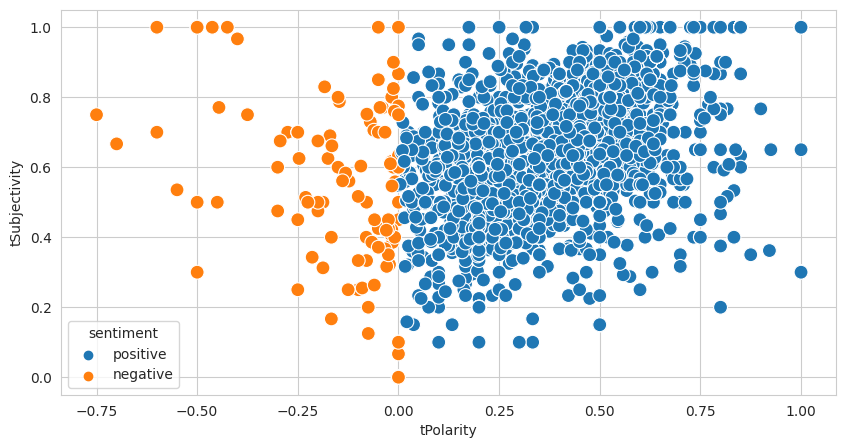

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10,5))
sns.set_style("whitegrid")
sns.scatterplot(data=pos_textblob, x='tPolarity',y='tSubjectivity',s=100,hue='sentiment')

plt.show()

,resp,pct
0,Positive,91.8
1,Negative,8.2


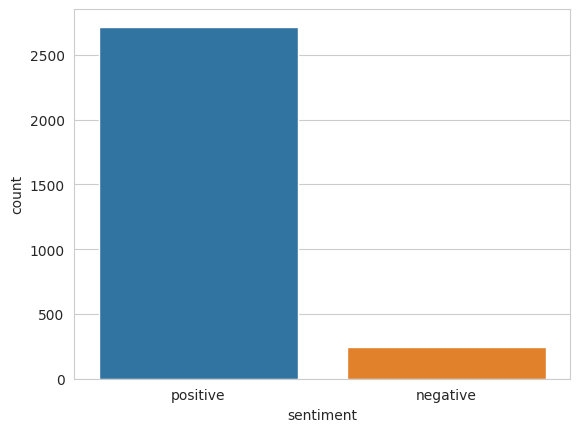

In [ ]:
sns.countplot(data=pos_textblob,x='sentiment')

positive = round(len(pos_textblob[pos_textblob.sentiment == 'positive'])/len(pos_textblob)*100,1)
negative = round(len(pos_textblob[pos_textblob.sentiment == 'negative'])/len(pos_textblob)*100,1)

responses = [positive, negative]
responses

response = {'resp': ['Positive', 'Negative',], 'pct':[positive, negative]}
pd.DataFrame(response)

In [ ]:
neg_textblob = neg_cleaned['Cleaned_Comment'].copy().to_frame()

neg_textblob['tPolarity'] = neg_textblob['Cleaned_Comment'].apply(calPolarity)
neg_textblob['tSubjectivity'] = neg_textblob['Cleaned_Comment'].apply(calSubjectivity)
neg_textblob['sentiment'] = neg_textblob['tPolarity'].apply(segmentation)
neg_textblob['target'] = neg_textblob['sentiment'].apply(get_target_textblob)

In [ ]:
neg_textblob.pivot_table(index=['sentiment'],aggfunc={'sentiment':'count'})

,sentiment
sentiment,
negative,1582
positive,1113


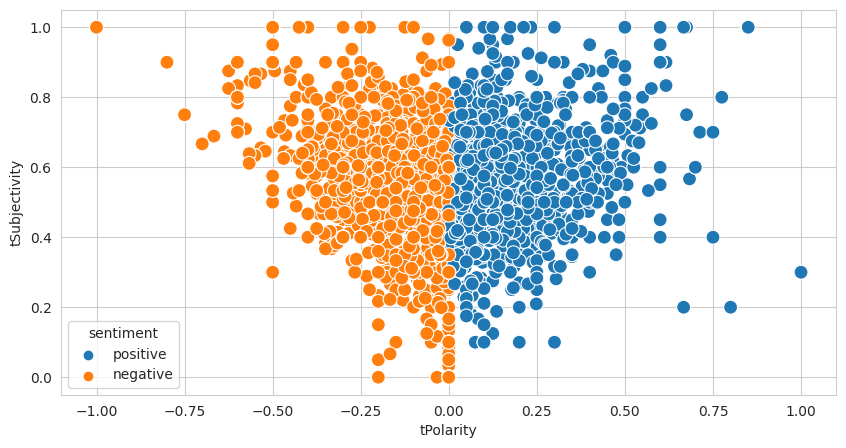

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10,5))
sns.set_style("whitegrid")
sns.scatterplot(data=neg_textblob, x='tPolarity',y='tSubjectivity',s=100,hue='sentiment')

plt.show()

,resp,pct
0,Positive,41.3
1,Negative,58.7


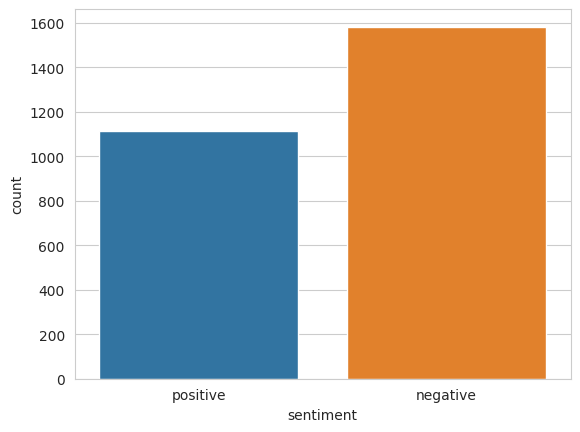

In [ ]:
sns.countplot(data=neg_textblob,x='sentiment')

positive = round(len(neg_textblob[neg_textblob.sentiment == 'positive'])/len(neg_textblob)*100,1)
negative = round(len(neg_textblob[neg_textblob.sentiment == 'negative'])/len(neg_textblob)*100,1)

responses = [positive, negative]
responses

response = {'resp': ['Positive', 'Negative',], 'pct':[positive, negative]}
pd.DataFrame(response)

### Vader

In [ ]:
pip install vaderSentiment

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.0/126.0 kB 1.4 MB/s eta 0:00:00


In [ ]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

sia = SentimentIntensityAnalyzer()

In [ ]:
pos_vader = pos_cleaned['Cleaned_Comment'].copy().to_frame()
pos_vader['Score'] = pos_vader['Cleaned_Comment'].apply(lambda txt: sia.polarity_scores(txt))

In [ ]:
pos_vader['negative'] = pos_vader['Score'].apply(lambda txt: txt['neg'])
pos_vader['neutral'] = pos_vader['Score'].apply(lambda txt: txt['neu'])
pos_vader['positive'] = pos_vader['Score'].apply(lambda txt: txt['pos'])
pos_vader['compound'] = pos_vader['Score'].apply(lambda txt: txt['compound'])

pos_vader.head()

,Cleaned_Comment,Score,negative,neutral,positive,compound
0,not thick not think not tried yet think cool f...,"{'neg': 0.071, 'neu': 0.573, 'pos': 0.356, 'co...",0.071,0.573,0.356,0.8726
1,fabric beautiful rare quality beautiful patter...,"{'neg': 0.17, 'neu': 0.505, 'pos': 0.324, 'com...",0.170,0.505,0.324,0.7783
2,item received good condition delivery fast bea...,"{'neg': 0.0, 'neu': 0.505, 'pos': 0.495, 'comp...",0.000,0.505,0.495,0.9559
3,thank fast delivery close express thing slow n...,"{'neg': 0.042, 'neu': 0.485, 'pos': 0.474, 'co...",0.042,0.485,0.474,0.9618
4,sorry picture nothing folded hands item receiv...,"{'neg': 0.031, 'neu': 0.541, 'pos': 0.428, 'co...",0.031,0.541,0.428,0.9509


In [ ]:
def polarity_score_vader(compound):
    if compound >= 0.5:
        return "positive"
    else:
        return "negative"

def get_target_vader(sentiment):
    if sentiment == "negative":
        return 0
    elif sentiment == "positive":
        return 2

In [ ]:
pos_vader['sentiment'] = pos_vader['compound'].apply(lambda val: polarity_score_vader(val))
pos_vader['target'] = pos_vader['sentiment'].apply(get_target_vader)
pos_vader.pivot_table(index=['sentiment'],aggfunc={'sentiment':'count'})

,sentiment
sentiment,
negative,518
positive,2444


,resp,pct
0,Positive,82.5
1,Negative,17.5


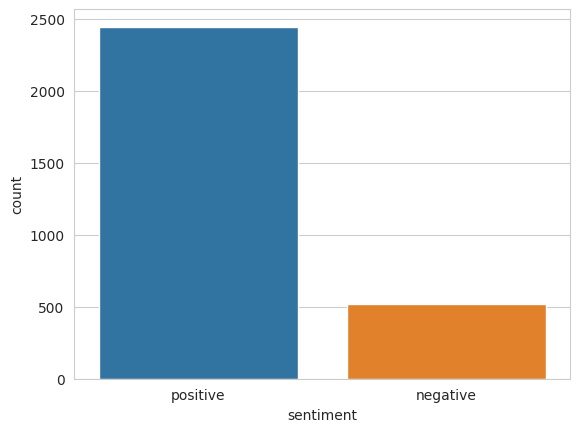

In [ ]:
sns.countplot(data=pos_vader,x='sentiment')

positive = round(len(pos_vader[pos_vader.sentiment == 'positive'])/len(pos_vader)*100,1)
negative = round(len(pos_vader[pos_vader.sentiment == 'negative'])/len(pos_vader)*100,1)

responses = [positive, negative]
responses

response = {'resp': ['Positive', 'Negative'], 'pct':[positive, negative]}
pd.DataFrame(response)

In [ ]:
neg_vader = neg_cleaned['Cleaned_Comment'].copy().to_frame()
neg_vader['Score'] = neg_vader['Cleaned_Comment'].apply(lambda txt: sia.polarity_scores(txt))

In [ ]:
neg_vader['negative'] = neg_vader['Score'].apply(lambda txt: txt['neg'])
neg_vader['neutral'] = neg_vader['Score'].apply(lambda txt: txt['neu'])
neg_vader['positive'] = neg_vader['Score'].apply(lambda txt: txt['pos'])
neg_vader['compound'] = neg_vader['Score'].apply(lambda txt: txt['compound'])

neg_vader.head()

,Cleaned_Comment,Score,negative,neutral,positive,compound
0,quality fabric not good fabric smooth,"{'neg': 0.325, 'neu': 0.675, 'pos': 0.0, 'comp...",0.325,0.675,0.000,-0.3412
1,crepe hard find shape not match price quality ...,"{'neg': 0.205, 'neu': 0.667, 'pos': 0.128, 'co...",0.205,0.667,0.128,-0.1280
2,smelly fabric grinning face sweat even washing...,"{'neg': 0.313, 'neu': 0.569, 'pos': 0.118, 'co...",0.313,0.569,0.118,-0.6249
3,practice practice bad crying crying face thin ...,"{'neg': 0.596, 'neu': 0.312, 'pos': 0.093, 'co...",0.596,0.312,0.093,-0.9811
4,material made hard hard cloth easy remove hair...,"{'neg': 0.204, 'neu': 0.584, 'pos': 0.212, 'co...",0.204,0.584,0.212,0.2732


In [ ]:
neg_vader['sentiment'] = neg_vader['compound'].apply(lambda val: polarity_score_vader(val))
neg_vader['target'] = neg_vader['sentiment'].apply(get_target_vader)
neg_vader.pivot_table(index=['sentiment'],aggfunc={'sentiment':'count'})

,sentiment
sentiment,
negative,2117
positive,578


,resp,pct
0,Positive,21.4
1,Negative,78.6


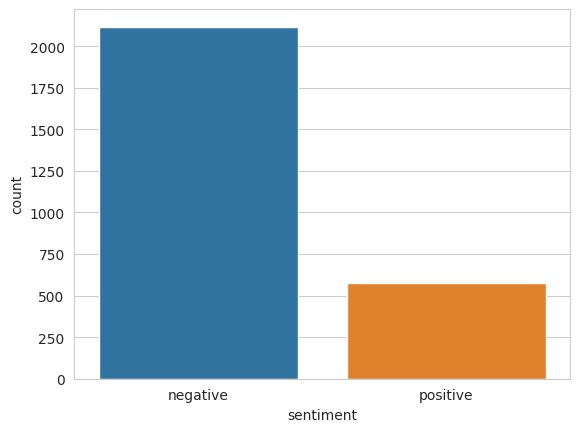

In [ ]:
sns.countplot(data=neg_vader,x='sentiment')

positive = round(len(neg_vader[neg_vader.sentiment == 'positive'])/len(neg_vader)*100,1)
negative = round(len(neg_vader[neg_vader.sentiment == 'negative'])/len(neg_vader)*100,1)

responses = [positive, negative]
responses

response = {'resp': ['Positive', 'Negative'], 'pct':[positive, negative]}
pd.DataFrame(response)

### Afinn

In [ ]:
pip install afinn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.6/52.6 kB 783.0 kB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for afinn: filename=afinn-0.1-py3-none-any.whl size=53429 sha256=c9644cd62dd4c0e3b99013d13f4e0d1a36039b5afea0e8bd638d29892d955adb
  Stored in directory: /root/.cache/pip/wheels/b0/05/90/43f79196199a138fb486902fceca30a2d1b5228e6d2db8eb90
Successfully built afinn


In [ ]:
from afinn import Afinn

afn = Afinn()

pos_afinn = pos_cleaned['Cleaned_Comment'].copy().to_frame()
pos_afinn['Score'] = pos_afinn['Cleaned_Comment'].apply(lambda txt: afn.score(txt))

In [ ]:
def polarity_score_afinn(score):
    if score > 0:
        return "positive"
    else:
        return "negative"

def get_target_afinn(sentiment):
    if sentiment == "negative":
        return 0
    elif sentiment == "positive":
        return 2

In [ ]:
pos_afinn['sentiment'] = pos_afinn['Score'].apply(lambda val: polarity_score_afinn(val))
pos_afinn['target'] = pos_afinn['sentiment'].apply(get_target_afinn)
pos_afinn.pivot_table(index=['sentiment'],aggfunc={'sentiment':'count'})

,sentiment
sentiment,
negative,287
positive,2675


,resp,pct
0,Positive,90.3
1,Negative,9.7


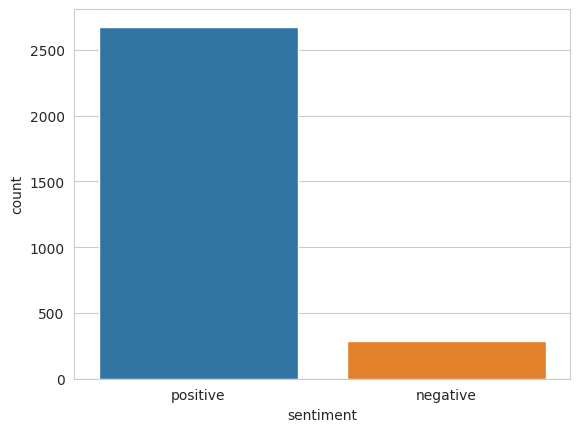

In [ ]:
sns.countplot(data=pos_afinn,x='sentiment')

positive = round(len(pos_afinn[pos_afinn.sentiment == 'positive'])/len(pos_afinn)*100,1)
negative = round(len(pos_afinn[pos_afinn.sentiment == 'negative'])/len(pos_afinn)*100,1)

responses = [positive, negative]
responses

response = {'resp': ['Positive', 'Negative'], 'pct':[positive, negative]}
pd.DataFrame(response)

In [ ]:
neg_afinn = neg_cleaned['Cleaned_Comment'].copy().to_frame()
neg_afinn['Score'] = neg_afinn['Cleaned_Comment'].apply(lambda txt: afn.score(txt))

In [ ]:
neg_afinn['sentiment'] = neg_afinn['Score'].apply(lambda val: polarity_score_afinn(val))
neg_afinn['target'] = neg_afinn['sentiment'].apply(get_target_afinn)
neg_afinn.pivot_table(index=['sentiment'],aggfunc={'sentiment':'count'})

,sentiment
sentiment,
negative,1532
positive,1163


,resp,pct
0,Positive,43.2
1,Negative,56.8


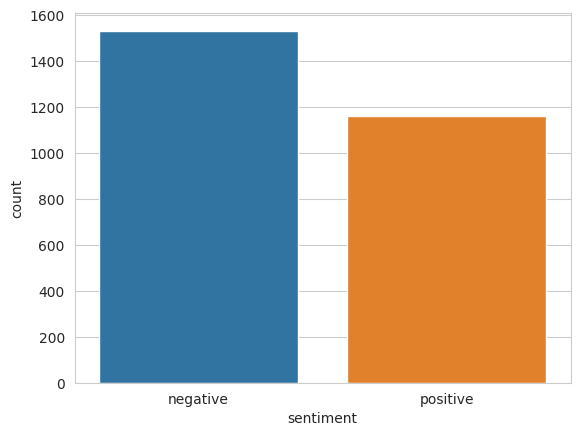

In [ ]:
sns.countplot(data=neg_afinn,x='sentiment')

positive = round(len(neg_afinn[neg_afinn.sentiment == 'positive'])/len(neg_afinn)*100,1)
negative = round(len(neg_afinn[neg_afinn.sentiment == 'negative'])/len(neg_afinn)*100,1)

responses = [positive, negative]
responses

response = {'resp': ['Positive', 'Negative'], 'pct':[positive, negative]}
pd.DataFrame(response)

## Reassign sentiment

In [ ]:
def sentiment(words):
    pslen= len(pos_senti.intersection(words))
    nglen= len(neg_senti.intersection(words))

    if pslen > nglen:
        return 'positive'
    else:
        return 'negative'

In [ ]:
from collections import Counter

def count_senti(sentences):
    sents = Counter()
    words = Counter()

    for sentence in sentences:
        senti = sentiment(sentence)
        sents[senti] += 1
        words[senti]+= len(sentence)
    return sents,words

In [ ]:
import nltk
def parse_senti(text):

    sentences = [
        [word.lower() for word in nltk.word_tokenize(sentence)]
        for sentence in nltk.sent_tokenize(text)
    ]

    sents, words = count_senti(sentences)
    total = sum(words.values())

    for sentiment, count in words.items():
        pcent = (count / total) * 100
        nsents = sents[sentiment]

        return(
            sentiment
        )

In [ ]:
from collections import Counter

def extract_frequent_words(comments, threshold):
    word_counts = Counter([word for comment in comments for word in comment.split()])
    frequent_words = [word for word, count in word_counts.items() if count >= threshold]
    return frequent_words

frequency_threshold = 50

### TextBlob

In [ ]:
# Filter the DataFrame for positive and negative comments
positive_comments = pos_textblob[pos_textblob['sentiment'] == 'positive']['Cleaned_Comment']
negative_comments = pos_textblob[pos_textblob['sentiment'] == 'negative']['Cleaned_Comment']

# Get the most frequent words that appear at least 'frequency_threshold' times in positive and negative comments
frequent_positive_words = extract_frequent_words(positive_comments, frequency_threshold)
frequent_negative_words = extract_frequent_words(negative_comments, frequency_threshold)

print("Most frequent words in Positive Comments:")
print(frequent_positive_words)

print("\nMost frequent words in Negative Comments:")
print(frequent_negative_words)

Most frequent words in Positive Comments:
['not', 'thick', 'think', 'cool', 'fabric', 'comfortable', 'hood', 'safe', 'beautiful', 'smiling', 'face', 'repeat', 'order', 'thumbs', 'light', 'skin', 'tone', 'quality', 'pattern', 'worth', 'price', 'no', 'sorry', 'even', 'item', 'thank', 'seller', 'received', 'good', 'condition', 'delivery', 'fast', 'easy', 'wear', 'ok', 'buy', 'time', 'hope', 'best', 'hijab', 'picture', 'nothing', 'ordered', 'used', 'reasonable', 'god', 'soft', 'cotton', 'shape', 'color', 'packaging', 'really', 'like', 'arrived', 'safely', 'cheap', 'buying', 'want', 'gift', 'likes', 'also', 'bit', 'hot', 'later', 'okay', 'get', 'handsome', 'use', 'already', 'one', 'thanks', 'little', 'big', 'quickly', 'nice', 'near', 'design', 'material', 'love', 'awning', 'product', 'money', 'satisfied', 'stitching', 'well', 'recommended', 'neat', 'long', 'red', 'heart', 'bought', 'cloth', 'eyes', 'free', 'chiffon', 'heartened', 'veil', 'much', 'size', 'mom', 'many', 'tears', 'goods', 'ser

In [ ]:
pos_senti = set(list(frequent_positive_words))
neg_senti = set(list(frequent_negative_words))

In [ ]:
pos_textblob['Reassigned_Sentiment'] = pos_textblob['Cleaned_Comment'].apply(parse_senti)

In [ ]:
pos_textblob['new_target'] = pos_textblob['Reassigned_Sentiment'].apply(get_target_textblob)

pos_textblob.head()

,Cleaned_Comment,tPolarity,tSubjectivity,sentiment,target,Reassigned_Sentiment,new_target
0,not thick not think not tried yet think cool f...,0.441667,0.687500,positive,2,positive,2
1,fabric beautiful rare quality beautiful patter...,0.360000,0.800000,positive,2,positive,2
2,item received good condition delivery fast bea...,0.398148,0.548148,positive,2,positive,2
3,thank fast delivery close express thing slow n...,0.362500,0.568750,positive,2,positive,2
4,sorry picture nothing folded hands item receiv...,0.276190,0.683333,positive,2,positive,2


In [ ]:
pos_textblob.pivot_table(index=['Reassigned_Sentiment'],aggfunc={'Reassigned_Sentiment':'count'})

,Reassigned_Sentiment
Reassigned_Sentiment,
negative,44
positive,2918


In [ ]:
positive_comments = neg_textblob[neg_textblob['sentiment'] == 'positive']['Cleaned_Comment']
negative_comments = neg_textblob[neg_textblob['sentiment'] == 'negative']['Cleaned_Comment']

frequent_positive_words = extract_frequent_words(positive_comments, frequency_threshold)
frequent_negative_words = extract_frequent_words(negative_comments, frequency_threshold)

print("Most frequent words in Positive Comments:")
print(frequent_positive_words)

print("\nMost frequent words in Negative Comments:")
print(frequent_negative_words)

Most frequent words in Positive Comments:
['quality', 'fabric', 'not', 'good', 'arrived', 'cotton', 'ok', 'beautiful', 'price', 'color', 'picture', 'cheap', 'material', 'wear', 'soft', 'hard', 'get', 'no', 'seller', 'thumbs', 'light', 'skin', 'tone', 'first', 'buy', 'like', 'bought', 'different', 'hope', 'really', 'best', 'time', 'hood', 'blue', 'check', 'dark', 'green', 'gray', 'another', 'one', '2', 'please', 'know', 'item', 'sorry', 'satisfied', 'little', 'smiling', 'face', 'use', 'also', 'even', 'colors', 'want', 'ordered', 'got', 'pink', 'hijab', 'looks', 'okay', 'give', 'near', 'post', 'short', 'think', 'handsome', 'wrong', 'size', 'small', 'stitching', 'neat', 'order', 'nice', '3', 'pieces', 'already', 'fast', 'delivery', 'rare', '1', 'thank', 'awning', 'comfortable', 'black']

Most frequent words in Negative Comments:
['hard', 'not', 'price', 'quality', 'fabric', 'like', 'already', 'bought', '3', 'face', 'even', 'bad', 'crying', 'thin', 'crazy', 'short', 'really', 'know', 'clot

In [ ]:
pos_senti = set(list(frequent_positive_words))
neg_senti = set(list(frequent_negative_words))

In [ ]:
neg_textblob['Reassigned_Sentiment'] = neg_textblob['Cleaned_Comment'].apply(parse_senti)

In [ ]:
neg_textblob['new_target'] = neg_textblob['Reassigned_Sentiment'].apply(get_target_textblob)

neg_textblob.head()

,Cleaned_Comment,tPolarity,tSubjectivity,sentiment,target,Reassigned_Sentiment,new_target
0,quality fabric not good fabric smooth,0.025000,0.550000,positive,2,negative,0.0
1,crepe hard find shape not match price quality ...,-0.291667,0.541667,negative,0,negative,0.0
2,smelly fabric grinning face sweat even washing...,-0.183333,0.583333,negative,0,negative,0.0
3,practice practice bad crying crying face thin ...,-0.063426,0.664352,negative,0,negative,0.0
4,material made hard hard cloth easy remove hair...,-0.050000,0.638889,negative,0,negative,0.0


In [ ]:
neg_textblob.pivot_table(index=['Reassigned_Sentiment'],aggfunc={'Reassigned_Sentiment':'count'})

,Reassigned_Sentiment
Reassigned_Sentiment,
negative,2146
positive,548


,resp,pct
0,Positive,20.3
1,Negative,79.6


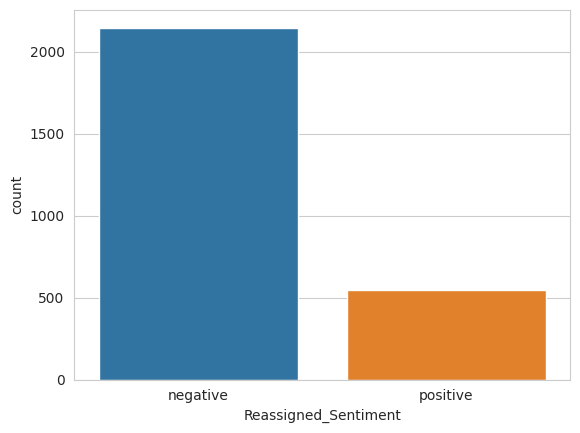

In [ ]:
sns.countplot(data=neg_textblob,x='Reassigned_Sentiment')

positive = round(len(neg_textblob[neg_textblob.Reassigned_Sentiment == 'positive'])/len(neg_textblob)*100,1)
negative = round(len(neg_textblob[neg_textblob.Reassigned_Sentiment == 'negative'])/len(neg_textblob)*100,1)

responses = [positive, negative]
responses

response = {'resp': ['Positive', 'Negative',], 'pct':[positive, negative]}
pd.DataFrame(response)

### Vader

In [ ]:
positive_comments = pos_vader[pos_vader['sentiment'] == 'positive']['Cleaned_Comment']
negative_comments = pos_vader[pos_vader['sentiment'] == 'negative']['Cleaned_Comment']

frequent_positive_words = extract_frequent_words(positive_comments, frequency_threshold)
frequent_negative_words = extract_frequent_words(negative_comments, frequency_threshold)

print("Most frequent words in Positive Comments:")
print(frequent_positive_words)

print("\nMost frequent words in Negative Comments:")
print(frequent_negative_words)

Most frequent words in Positive Comments:
['not', 'cool', 'fabric', 'comfortable', 'hood', 'safe', 'beautiful', 'smiling', 'face', 'repeat', 'order', 'thumbs', 'light', 'skin', 'tone', 'quality', 'pattern', 'worth', 'price', 'no', 'sorry', 'even', 'item', 'thank', 'seller', 'received', 'good', 'condition', 'delivery', 'fast', 'easy', 'wear', 'ok', 'buy', 'time', 'hope', 'best', 'hijab', 'picture', 'ordered', 'used', 'god', 'soft', 'cotton', 'shape', 'color', 'packaging', 'really', 'like', 'arrived', 'safely', 'cheap', 'buying', 'want', 'gift', 'likes', 'also', 'bit', 'okay', 'get', 'handsome', 'use', 'already', 'one', 'thanks', 'quickly', 'nice', 'near', 'design', 'material', 'love', 'awning', 'product', 'money', 'satisfied', 'stitching', 'well', 'recommended', 'neat', 'long', 'red', 'heart', 'bought', 'hot', 'eyes', 'free', 'little', 'chiffon', 'heartened', 'veil', 'much', 'size', 'mom', 'big', 'many', 'tears', 'goods', 'service', 'scarf', 'another', 'blowing', 'headscarf', 'hearts', 

In [ ]:
pos_senti = set(list(frequent_positive_words))
neg_senti = set(list(frequent_negative_words))

In [ ]:
pos_vader['Reassigned_Sentiment'] = pos_vader['Cleaned_Comment'].apply(parse_senti)

In [ ]:
pos_vader['new_target'] = pos_vader['Reassigned_Sentiment'].apply(get_target_textblob)

pos_vader.head()

,Cleaned_Comment,Score,negative,neutral,positive,compound,sentiment,target,Reassigned_Sentiment,new_target
0,not thick not think not tried yet think cool f...,"{'neg': 0.071, 'neu': 0.573, 'pos': 0.356, 'co...",0.071,0.573,0.356,0.8726,positive,2,positive,2
1,fabric beautiful rare quality beautiful patter...,"{'neg': 0.17, 'neu': 0.505, 'pos': 0.324, 'com...",0.170,0.505,0.324,0.7783,positive,2,positive,2
2,item received good condition delivery fast bea...,"{'neg': 0.0, 'neu': 0.505, 'pos': 0.495, 'comp...",0.000,0.505,0.495,0.9559,positive,2,positive,2
3,thank fast delivery close express thing slow n...,"{'neg': 0.042, 'neu': 0.485, 'pos': 0.474, 'co...",0.042,0.485,0.474,0.9618,positive,2,positive,2
4,sorry picture nothing folded hands item receiv...,"{'neg': 0.031, 'neu': 0.541, 'pos': 0.428, 'co...",0.031,0.541,0.428,0.9509,positive,2,positive,2


In [ ]:
pos_vader.pivot_table(index=['Reassigned_Sentiment'],aggfunc={'Reassigned_Sentiment':'count'})

,Reassigned_Sentiment
Reassigned_Sentiment,
negative,117
positive,2845


In [ ]:
positive_comments = neg_vader[neg_vader['sentiment'] == 'positive']['Cleaned_Comment']
negative_comments = neg_vader[neg_vader['sentiment'] == 'negative']['Cleaned_Comment']

frequent_positive_words = extract_frequent_words(positive_comments, frequency_threshold)
frequent_negative_words = extract_frequent_words(negative_comments, frequency_threshold)

print("Most frequent words in Positive Comments:")
print(frequent_positive_words)

print("\nMost frequent words in Negative Comments:")
print(frequent_negative_words)

Most frequent words in Positive Comments:
['cotton', 'ok', 'beautiful', 'price', 'color', 'different', 'picture', 'got', 'like', 'seller', 'first', 'buy', 'fabric', 'not', 'bought', 'hope', 'time', 'hood', 'ordered', 'one', 'arrived', 'want', 'get', 'face', 'smiling', 'material', 'know', 'sorry', 'please', '2', 'post', 'cheap', 'use', 'think', 'handsome', 'okay', 'order', 'another', 'thank', 'hijab', 'delivery', 'size', 'item', 'even', 'awning', 'comfortable', 'good', 'soft']

Most frequent words in Negative Comments:
['quality', 'fabric', 'not', 'good', 'hard', 'shape', 'price', 'like', 'buying', 'already', 'bought', '3', 'face', 'even', 'still', 'bad', 'crying', 'thin', 'crazy', 'short', 'really', 'know', 'cloth', 'rare', 'loudly', 'material', 'different', 'another', 'seller', 'disappointed', 'hood', 'think', 'arrived', 'order', 'color', 'get', 'pink', 'green', 'blue', 'black', 'picture', 'cheap', 'wear', 'soft', 'ok', 'awning', 'hijab', 'okay', 'comfortable', 'bit', 'near', '2', 'so

In [ ]:
pos_senti = set(list(frequent_positive_words))
neg_senti = set(list(frequent_negative_words))

In [ ]:
neg_vader['Reassigned_Sentiment'] = neg_vader['Cleaned_Comment'].apply(parse_senti)

In [ ]:
neg_vader['new_target'] = neg_vader['Reassigned_Sentiment'].apply(get_target_textblob)

neg_vader.head()

,Cleaned_Comment,Score,negative,neutral,positive,compound,sentiment,target,Reassigned_Sentiment,new_target
0,quality fabric not good fabric smooth,"{'neg': 0.325, 'neu': 0.675, 'pos': 0.0, 'comp...",0.325,0.675,0.000,-0.3412,negative,0,negative,0.0
1,crepe hard find shape not match price quality ...,"{'neg': 0.205, 'neu': 0.667, 'pos': 0.128, 'co...",0.205,0.667,0.128,-0.1280,negative,0,negative,0.0
2,smelly fabric grinning face sweat even washing...,"{'neg': 0.313, 'neu': 0.569, 'pos': 0.118, 'co...",0.313,0.569,0.118,-0.6249,negative,0,negative,0.0
3,practice practice bad crying crying face thin ...,"{'neg': 0.596, 'neu': 0.312, 'pos': 0.093, 'co...",0.596,0.312,0.093,-0.9811,negative,0,negative,0.0
4,material made hard hard cloth easy remove hair...,"{'neg': 0.204, 'neu': 0.584, 'pos': 0.212, 'co...",0.204,0.584,0.212,0.2732,negative,0,negative,0.0


In [ ]:
neg_vader.pivot_table(index=['Reassigned_Sentiment'],aggfunc={'Reassigned_Sentiment':'count'})

,Reassigned_Sentiment
Reassigned_Sentiment,
negative,2658
positive,36


### Afinn

In [ ]:
positive_comments = pos_afinn[pos_afinn['sentiment'] == 'positive']['Cleaned_Comment']
negative_comments = pos_afinn[pos_afinn['sentiment'] == 'negative']['Cleaned_Comment']

frequent_positive_words = extract_frequent_words(positive_comments, frequency_threshold)
frequent_negative_words = extract_frequent_words(negative_comments, frequency_threshold)

print("Most frequent words in Positive Comments:")
print(frequent_positive_words)

print("\nMost frequent words in Negative Comments:")
print(frequent_negative_words)

Most frequent words in Positive Comments:
['not', 'thick', 'think', 'cool', 'fabric', 'comfortable', 'hood', 'safe', 'beautiful', 'smiling', 'face', 'repeat', 'order', 'thumbs', 'light', 'skin', 'tone', 'quality', 'pattern', 'worth', 'price', 'no', 'sorry', 'even', 'item', 'thank', 'seller', 'received', 'good', 'condition', 'delivery', 'fast', 'easy', 'wear', 'ok', 'buy', 'time', 'hope', 'best', 'hijab', 'picture', 'nothing', 'ordered', 'used', 'god', 'soft', 'cotton', 'shape', 'color', 'packaging', 'really', 'like', 'arrived', 'safely', 'cheap', 'buying', 'want', 'gift', 'likes', 'also', 'bit', 'hot', 'later', 'handsome', 'use', 'already', 'one', 'thanks', 'little', 'big', 'quickly', 'nice', 'near', 'design', 'material', 'love', 'awning', 'product', 'money', 'satisfied', 'well', 'recommended', 'stitching', 'neat', 'long', 'red', 'heart', 'bought', 'eyes', 'free', 'get', 'chiffon', 'heartened', 'okay', 'veil', 'much', 'size', 'looks', 'mom', 'many', 'tears', 'goods', 'service', 'scarf'

In [ ]:
pos_senti = set(list(frequent_positive_words))
neg_senti = set(list(frequent_negative_words))

In [ ]:
pos_afinn['Reassigned_Sentiment'] = pos_afinn['Cleaned_Comment'].apply(parse_senti)
pos_afinn['new_target'] = pos_afinn['Reassigned_Sentiment'].apply(get_target_textblob)

pos_afinn.head()

,Cleaned_Comment,Score,sentiment,target,Reassigned_Sentiment,new_target
0,not thick not think not tried yet think cool f...,9.0,positive,2,positive,2
1,fabric beautiful rare quality beautiful patter...,7.0,positive,2,positive,2
2,item received good condition delivery fast bea...,11.0,positive,2,positive,2
3,thank fast delivery close express thing slow n...,17.0,positive,2,positive,2
4,sorry picture nothing folded hands item receiv...,11.0,positive,2,positive,2


In [ ]:
pos_afinn.pivot_table(index=['Reassigned_Sentiment'],aggfunc={'Reassigned_Sentiment':'count'})

,Reassigned_Sentiment
Reassigned_Sentiment,
negative,52
positive,2910


In [ ]:
positive_comments = neg_afinn[neg_afinn['sentiment'] == 'positive']['Cleaned_Comment']
negative_comments = neg_afinn[neg_afinn['sentiment'] == 'negative']['Cleaned_Comment']

frequent_positive_words = extract_frequent_words(positive_comments, frequency_threshold)
frequent_negative_words = extract_frequent_words(negative_comments, frequency_threshold)

print("Most frequent words in Positive Comments:")
print(frequent_positive_words)

print("\nMost frequent words in Negative Comments:")
print(frequent_negative_words)

Most frequent words in Positive Comments:
['hard', 'shape', 'not', 'price', 'quality', 'fabric', 'like', 'already', 'bought', '3', 'arrived', 'good', 'cotton', 'ok', 'beautiful', 'color', 'picture', 'cheap', 'material', 'wear', 'different', 'got', 'awning', 'hijab', 'green', 'okay', 'comfortable', 'near', '2', 'sorry', 'seller', 'even', 'hood', 'small', 'size', 'short', 'look', 'light', 'skin', 'first', 'buy', 'hope', 'really', 'best', 'time', 'blue', 'check', 'dark', 'soft', 'no', 'another', 'one', 'get', 'please', 'know', 'item', 'satisfied', 'pieces', 'scarf', 'want', 'use', 'colors', 'disappointed', 'ordered', 'thin', 'order', 'thank', 'refund', 'white', 'pink', 'face', 'little', 'looks', 'post', 'smiling', 'think', 'long', 'handsome', 'black', 'nice', 'give', 'slow', 'fast', 'delivery', 'also', 'pom', '1', 'used', 'stitching', 'neat']

Most frequent words in Negative Comments:
['quality', 'fabric', 'not', 'good', 'face', 'even', 'bad', 'crying', 'thin', 'crazy', 'short', 'really',

In [ ]:
pos_senti = set(list(frequent_positive_words))
neg_senti = set(list(frequent_negative_words))

In [ ]:
neg_afinn['Reassigned_Sentiment'] = neg_afinn['Cleaned_Comment'].apply(parse_senti)
neg_afinn['new_target'] = neg_afinn['Reassigned_Sentiment'].apply(get_target_textblob)

neg_afinn.head()

,Cleaned_Comment,Score,sentiment,target,Reassigned_Sentiment,new_target
0,quality fabric not good fabric smooth,0.0,negative,0,negative,0.0
1,crepe hard find shape not match price quality ...,1.0,positive,2,positive,2.0
2,smelly fabric grinning face sweat even washing...,-5.0,negative,0,negative,0.0
3,practice practice bad crying crying face thin ...,-13.0,negative,0,negative,0.0
4,material made hard hard cloth easy remove hair...,-1.0,negative,0,negative,0.0


In [ ]:
neg_afinn.pivot_table(index=['Reassigned_Sentiment'],aggfunc={'Reassigned_Sentiment':'count'})

,Reassigned_Sentiment
Reassigned_Sentiment,
negative,1902
positive,792


## Combine into one dataframe

### TextBlob

In [ ]:
df_textblob = pd.DataFrame(columns=['Comment', 'Target'])

positive_comments_selected = pos_textblob[['Cleaned_Comment', 'new_target']]
positive_comments_selected.rename(columns={'Cleaned_Comment': 'Comment', 'new_target': 'Target'}, inplace=True)
negative_comments_selected = neg_textblob[['Cleaned_Comment', 'new_target']]
negative_comments_selected.rename(columns={'Cleaned_Comment': 'Comment', 'new_target': 'Target'}, inplace=True)
df_textblob = pd.concat([positive_comments_selected, negative_comments_selected], ignore_index=True)

<ipython-input-71-8bcb8c171400>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  positive_comments_selected.rename(columns={'Cleaned_Comment': 'Comment', 'new_target': 'Target'}, inplace=True)
<ipython-input-71-8bcb8c171400>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  negative_comments_selected.rename(columns={'Cleaned_Comment': 'Comment', 'new_target': 'Target'}, inplace=True)


In [ ]:
df_textblob.shape

(5657, 2)

In [ ]:
df_textblob.head()

,Comment,Target
0,not thick not think not tried yet think cool f...,2.0
1,fabric beautiful rare quality beautiful patter...,2.0
2,item received good condition delivery fast bea...,2.0
3,thank fast delivery close express thing slow n...,2.0
4,sorry picture nothing folded hands item receiv...,2.0


,resp,pct
0,Positive,61.3
1,Negative,38.7


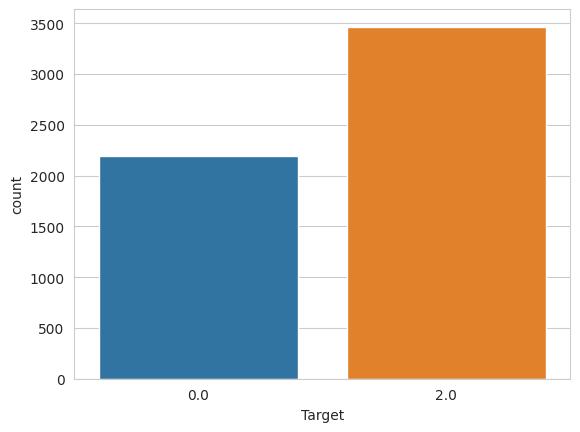

In [ ]:
sns.countplot(data=df_textblob,x='Target')

positive = round(len(df_textblob[df_textblob.Target == 2])/len(df_textblob)*100,1)
negative = round(len(df_textblob[df_textblob.Target == 0])/len(df_textblob)*100,1)

responses = [positive, negative]
responses

response = {'resp': ['Positive', 'Negative',], 'pct':[positive, negative]}
pd.DataFrame(response)

In [ ]:
df_textblob.isnull().any().sum()

1

In [ ]:
df_textblob.dropna(inplace=True)
print(df_textblob.isnull().any().sum())

0


### Vader

In [ ]:
df_vader = pd.DataFrame(columns=['Comment', 'Target'])

positive_comments_selected = pos_vader[['Cleaned_Comment', 'new_target']]
positive_comments_selected.rename(columns={'Cleaned_Comment': 'Comment', 'new_target': 'Target'}, inplace=True)
negative_comments_selected = neg_vader[['Cleaned_Comment', 'new_target']]
negative_comments_selected.rename(columns={'Cleaned_Comment': 'Comment', 'new_target': 'Target'}, inplace=True)
df_vader = pd.concat([positive_comments_selected, negative_comments_selected], ignore_index=True)

<ipython-input-77-2f170c51b025>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  positive_comments_selected.rename(columns={'Cleaned_Comment': 'Comment', 'new_target': 'Target'}, inplace=True)
<ipython-input-77-2f170c51b025>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  negative_comments_selected.rename(columns={'Cleaned_Comment': 'Comment', 'new_target': 'Target'}, inplace=True)


,resp,pct
0,Positive,50.9
1,Negative,49.1


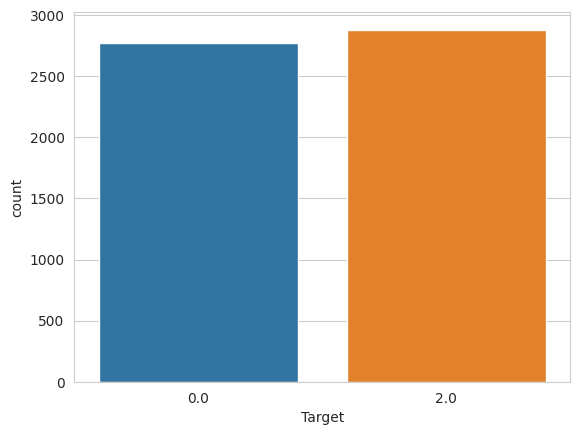

In [ ]:
sns.countplot(data=df_vader,x='Target')

positive = round(len(df_vader[df_vader.Target == 2])/len(df_vader)*100,1)
negative = round(len(df_vader[df_vader.Target == 0])/len(df_vader)*100,1)

responses = [positive, negative]
responses

response = {'resp': ['Positive', 'Negative',], 'pct':[positive, negative]}
pd.DataFrame(response)

In [ ]:
df_vader.isnull().any().sum()

1

In [ ]:
df_vader.dropna(inplace=True)
print(df_vader.isnull().any().sum())

0


### Afinn

In [ ]:
df_afinn = pd.DataFrame(columns=['Comment', 'Target'])

positive_comments_selected = pos_afinn[['Cleaned_Comment', 'new_target']]
positive_comments_selected.rename(columns={'Cleaned_Comment': 'Comment', 'new_target': 'Target'}, inplace=True)
negative_comments_selected = neg_afinn[['Cleaned_Comment', 'new_target']]
negative_comments_selected.rename(columns={'Cleaned_Comment': 'Comment', 'new_target': 'Target'}, inplace=True)
df_afinn = pd.concat([positive_comments_selected, negative_comments_selected], ignore_index=True)

<ipython-input-81-e8d4b3d665a6>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  positive_comments_selected.rename(columns={'Cleaned_Comment': 'Comment', 'new_target': 'Target'}, inplace=True)
<ipython-input-81-e8d4b3d665a6>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  negative_comments_selected.rename(columns={'Cleaned_Comment': 'Comment', 'new_target': 'Target'}, inplace=True)


,resp,pct
0,Positive,65.4
1,Negative,34.5


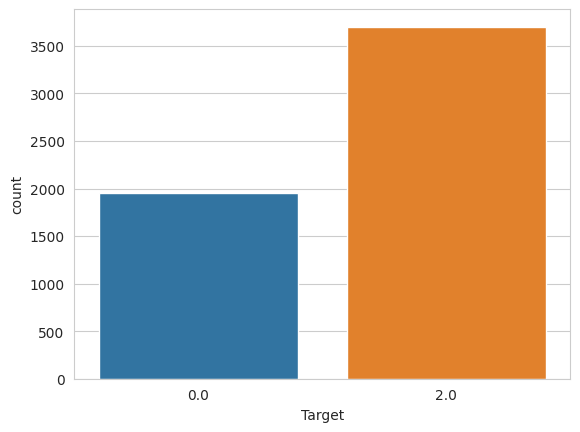

In [ ]:
sns.countplot(data=df_afinn,x='Target')

positive = round(len(df_afinn[df_afinn.Target == 2])/len(df_afinn)*100,1)
negative = round(len(df_afinn[df_afinn.Target == 0])/len(df_afinn)*100,1)

responses = [positive, negative]
responses

response = {'resp': ['Positive', 'Negative',], 'pct':[positive, negative]}
pd.DataFrame(response)

In [ ]:
df_afinn.isnull().any().sum()

1

In [ ]:
df_afinn.dropna(inplace=True)
print(df_afinn.isnull().any().sum())

0


##Tokenization

In [ ]:
import nltk
from nltk.tokenize import word_tokenize

nltk.download('punkt')

df_textblob['Cleaned_Comment'] = df_textblob['Comment'].apply(word_tokenize)
df_vader['Cleaned_Comment'] = df_vader['Comment'].apply(word_tokenize)
df_afinn['Cleaned_Comment'] = df_afinn['Comment'].apply(word_tokenize)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


## Stemming and Lemmatization

In [ ]:
from nltk.stem import PorterStemmer, WordNetLemmatizer
import nltk
nltk.download('wordnet')

stemmer = PorterStemmer()
lemmatizer = WordNetLemmatizer()

def lemmatize_and_stem(tokens):
    lemmatized_tokens = [lemmatizer.lemmatize(token) for token in tokens]
    stemmed_tokens = [stemmer.stem(token) for token in lemmatized_tokens]
    return stemmed_tokens

[nltk_data] Downloading package wordnet to /root/nltk_data...


In [ ]:
def stem(tokens):
    stemmed_tokens = [stemmer.stem(token) for token in tokens]
    return stemmed_tokens

In [ ]:
def lemmatize(tokens):
    lemmatized_tokens = [lemmatizer.lemmatize(token) for token in tokens]
    return lemmatized_tokens

### TextBlob

In [ ]:
df_textblob['Lemmatized_Stemmed_Comment'] = df_textblob['Cleaned_Comment'].apply(lemmatize_and_stem)
df_textblob['Stemmed_Comment'] = df_textblob['Cleaned_Comment'].apply(stem)
df_textblob['Lemmatized_Comment'] = df_textblob['Cleaned_Comment'].apply(lemmatize)

In [ ]:
df_textblob.tail()

,Comment,Target,Cleaned_Comment,Lemmatized_Stemmed_Comment,Stemmed_Comment,Lemmatized_Comment
5652,not usual item already arrived not know differ...,2.0,"[not, usual, item, already, arrived, not, know...","[not, usual, item, alreadi, arriv, not, know, ...","[not, usual, item, alreadi, arriv, not, know, ...","[not, usual, item, already, arrived, not, know..."
5653,order wanted post prime minister seller not re...,0.0,"[order, wanted, post, prime, minister, seller,...","[order, want, post, prime, minist, seller, not...","[order, want, post, prime, minist, seller, not...","[order, wanted, post, prime, minister, seller,..."
5654,small face,0.0,"[small, face]","[small, face]","[small, face]","[small, face]"
5655,excited wait sleepy face hood limp hard shape ...,0.0,"[excited, wait, sleepy, face, hood, limp, hard...","[excit, wait, sleepi, face, hood, limp, hard, ...","[excit, wait, sleepi, face, hood, limp, hard, ...","[excited, wait, sleepy, face, hood, limp, hard..."
5656,color picture far one judge green like blue as...,0.0,"[color, picture, far, one, judge, green, like,...","[color, pictur, far, one, judg, green, like, b...","[color, pictur, far, one, judg, green, like, b...","[color, picture, far, one, judge, green, like,..."


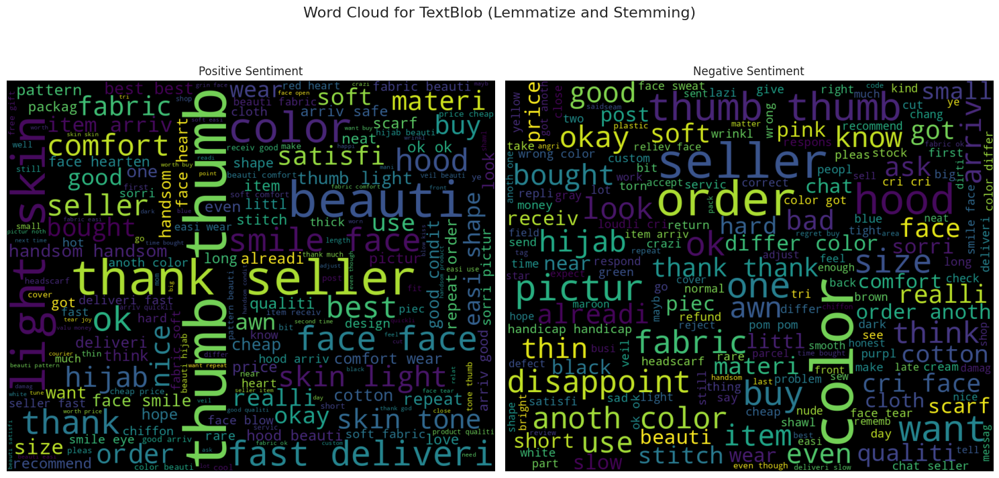

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

positive_tokens = df_textblob.loc[df_textblob['Target'] == 2, 'Lemmatized_Stemmed_Comment'].values
negative_tokens = df_textblob.loc[df_textblob['Target'] == 0, 'Lemmatized_Stemmed_Comment'].values

all_positive_tokens = [token for comment_tokens in positive_tokens for token in comment_tokens]
all_negative_tokens = [token for comment_tokens in negative_tokens for token in comment_tokens]

consolidated_positive = ' '.join(all_positive_tokens)
consolidated_negative = ' '.join(all_negative_tokens)

wordCloud_positive = WordCloud(width=1000, height=800, random_state=20, max_font_size=119).generate(consolidated_positive)
wordCloud_negative = WordCloud(width=1000, height=800, random_state=20, max_font_size=119).generate(consolidated_negative)

plt.figure(figsize=(15, 8))

plt.subplot(1, 2, 1)
plt.imshow(wordCloud_positive, interpolation='bilinear')
plt.title('Positive Sentiment')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(wordCloud_negative, interpolation='bilinear')
plt.title('Negative Sentiment')
plt.axis('off')

plt.suptitle('Word Cloud for TextBlob (Lemmatize and Stemming)', fontsize=16)
plt.tight_layout()
plt.show()

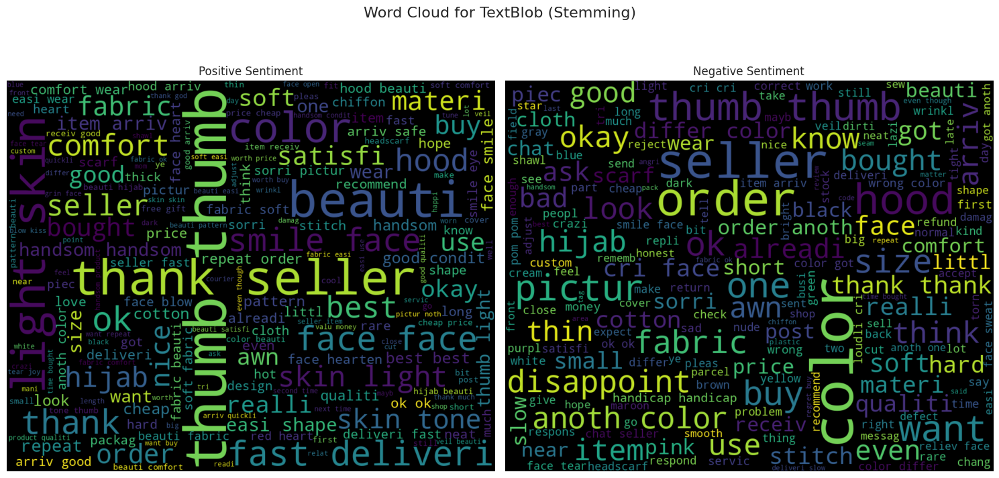

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

positive_tokens = df_textblob.loc[df_textblob['Target'] == 2, 'Stemmed_Comment'].values
negative_tokens = df_textblob.loc[df_textblob['Target'] == 0, 'Stemmed_Comment'].values

all_positive_tokens = [token for comment_tokens in positive_tokens for token in comment_tokens]
all_negative_tokens = [token for comment_tokens in negative_tokens for token in comment_tokens]

consolidated_positive = ' '.join(all_positive_tokens)
consolidated_negative = ' '.join(all_negative_tokens)

wordCloud_positive = WordCloud(width=1000, height=800, random_state=20, max_font_size=119).generate(consolidated_positive)
wordCloud_negative = WordCloud(width=1000, height=800, random_state=20, max_font_size=119).generate(consolidated_negative)

plt.figure(figsize=(15, 8))

plt.subplot(1, 2, 1)
plt.imshow(wordCloud_positive, interpolation='bilinear')
plt.title('Positive Sentiment')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(wordCloud_negative, interpolation='bilinear')
plt.title('Negative Sentiment')
plt.axis('off')

plt.suptitle('Word Cloud for TextBlob (Stemming)', fontsize=16)
plt.tight_layout()
plt.show()

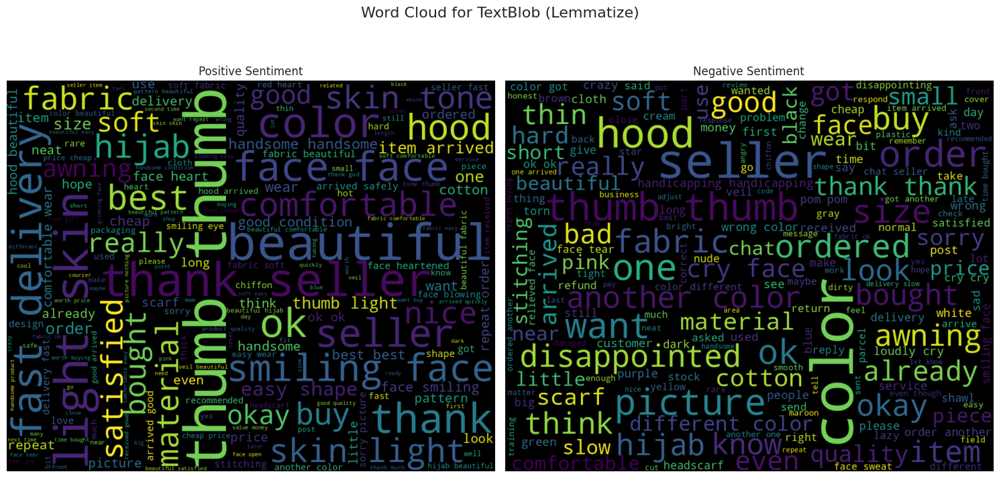

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

positive_tokens = df_textblob.loc[df_textblob['Target'] == 2, 'Lemmatized_Comment'].values
negative_tokens = df_textblob.loc[df_textblob['Target'] == 0, 'Lemmatized_Comment'].values

all_positive_tokens = [token for comment_tokens in positive_tokens for token in comment_tokens]
all_negative_tokens = [token for comment_tokens in negative_tokens for token in comment_tokens]

consolidated_positive = ' '.join(all_positive_tokens)
consolidated_negative = ' '.join(all_negative_tokens)

wordCloud_positive = WordCloud(width=1000, height=800, random_state=20, max_font_size=119).generate(consolidated_positive)
wordCloud_negative = WordCloud(width=1000, height=800, random_state=20, max_font_size=119).generate(consolidated_negative)

plt.figure(figsize=(15, 8))

plt.subplot(1, 2, 1)
plt.imshow(wordCloud_positive, interpolation='bilinear')
plt.title('Positive Sentiment')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(wordCloud_negative, interpolation='bilinear')
plt.title('Negative Sentiment')
plt.axis('off')

plt.suptitle('Word Cloud for TextBlob (Lemmatize)', fontsize=16)
plt.tight_layout()
plt.show()

### Vader

In [ ]:
df_vader['Lemmatized_Stemmed_Comment'] = df_vader['Cleaned_Comment'].apply(lemmatize_and_stem)
df_vader['Stemmed_Comment'] = df_vader['Cleaned_Comment'].apply(stem)
df_vader['Lemmatized_Comment'] = df_vader['Cleaned_Comment'].apply(lemmatize)

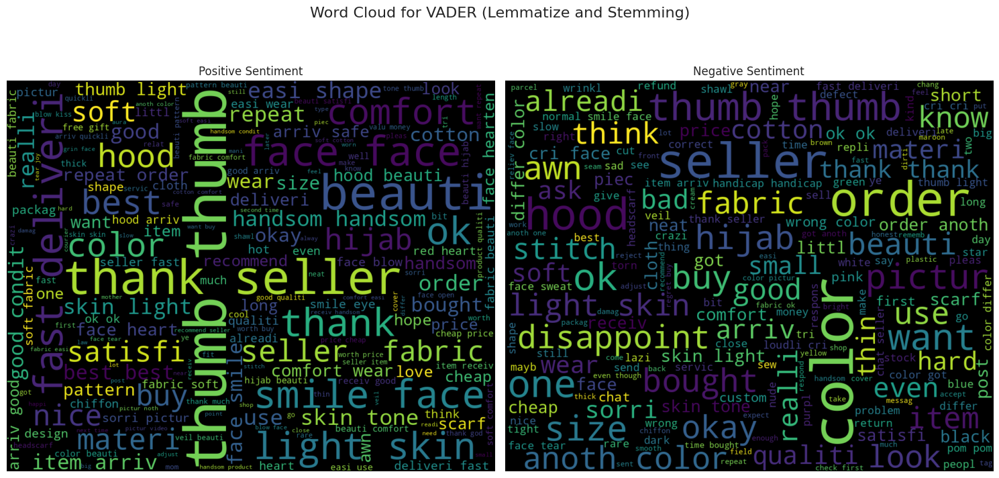

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

positive_tokens = df_vader.loc[df_vader['Target'] == 2, 'Lemmatized_Stemmed_Comment'].values
negative_tokens = df_vader.loc[df_vader['Target'] == 0, 'Lemmatized_Stemmed_Comment'].values

all_positive_tokens = [token for comment_tokens in positive_tokens for token in comment_tokens]
all_negative_tokens = [token for comment_tokens in negative_tokens for token in comment_tokens]

consolidated_positive = ' '.join(all_positive_tokens)
consolidated_negative = ' '.join(all_negative_tokens)

wordCloud_positive = WordCloud(width=1000, height=800, random_state=20, max_font_size=119).generate(consolidated_positive)
wordCloud_negative = WordCloud(width=1000, height=800, random_state=20, max_font_size=119).generate(consolidated_negative)

plt.figure(figsize=(15, 8))

plt.subplot(1, 2, 1)
plt.imshow(wordCloud_positive, interpolation='bilinear')
plt.title('Positive Sentiment')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(wordCloud_negative, interpolation='bilinear')
plt.title('Negative Sentiment')
plt.axis('off')

plt.suptitle('Word Cloud for VADER (Lemmatize and Stemming)', fontsize=16)
plt.tight_layout()
plt.show()

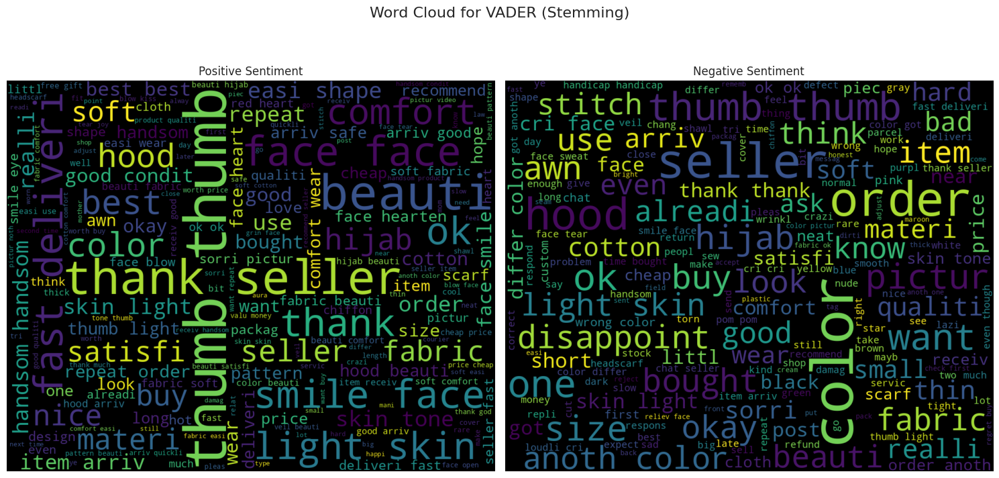

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

positive_tokens = df_vader.loc[df_vader['Target'] == 2, 'Stemmed_Comment'].values
negative_tokens = df_vader.loc[df_vader['Target'] == 0, 'Stemmed_Comment'].values

all_positive_tokens = [token for comment_tokens in positive_tokens for token in comment_tokens]
all_negative_tokens = [token for comment_tokens in negative_tokens for token in comment_tokens]

consolidated_positive = ' '.join(all_positive_tokens)
consolidated_negative = ' '.join(all_negative_tokens)

wordCloud_positive = WordCloud(width=1000, height=800, random_state=20, max_font_size=119).generate(consolidated_positive)
wordCloud_negative = WordCloud(width=1000, height=800, random_state=20, max_font_size=119).generate(consolidated_negative)

plt.figure(figsize=(15, 8))

plt.subplot(1, 2, 1)
plt.imshow(wordCloud_positive, interpolation='bilinear')
plt.title('Positive Sentiment')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(wordCloud_negative, interpolation='bilinear')
plt.title('Negative Sentiment')
plt.axis('off')

plt.suptitle('Word Cloud for VADER (Stemming)', fontsize=16)
plt.tight_layout()
plt.show()

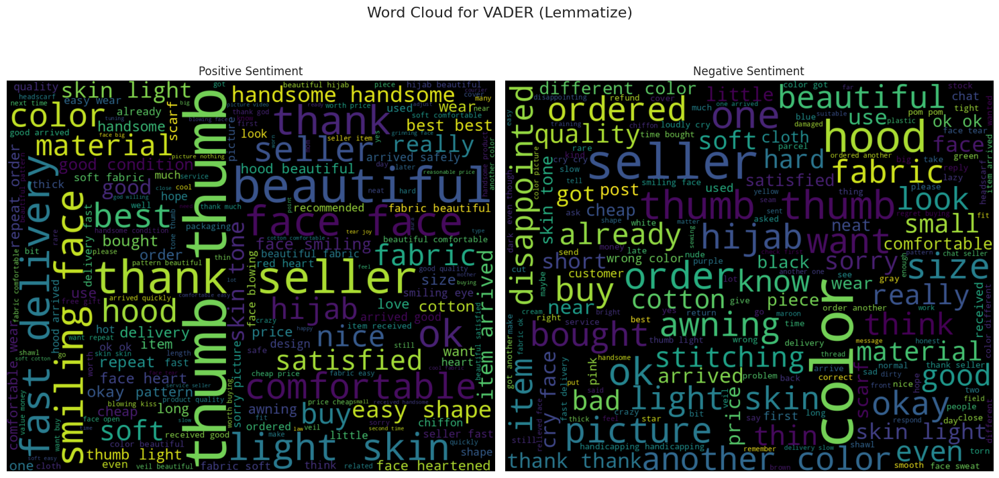

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

positive_tokens = df_vader.loc[df_vader['Target'] == 2, 'Lemmatized_Comment'].values
negative_tokens = df_vader.loc[df_vader['Target'] == 0, 'Lemmatized_Comment'].values

all_positive_tokens = [token for comment_tokens in positive_tokens for token in comment_tokens]
all_negative_tokens = [token for comment_tokens in negative_tokens for token in comment_tokens]

consolidated_positive = ' '.join(all_positive_tokens)
consolidated_negative = ' '.join(all_negative_tokens)

wordCloud_positive = WordCloud(width=1000, height=800, random_state=20, max_font_size=119).generate(consolidated_positive)
wordCloud_negative = WordCloud(width=1000, height=800, random_state=20, max_font_size=119).generate(consolidated_negative)

plt.figure(figsize=(15, 8))

plt.subplot(1, 2, 1)
plt.imshow(wordCloud_positive, interpolation='bilinear')
plt.title('Positive Sentiment')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(wordCloud_negative, interpolation='bilinear')
plt.title('Negative Sentiment')
plt.axis('off')

plt.suptitle('Word Cloud for VADER (Lemmatize)', fontsize=16)
plt.tight_layout()
plt.show()

### Afinn

In [ ]:
df_afinn['Lemmatized_Stemmed_Comment'] = df_afinn['Cleaned_Comment'].apply(lemmatize_and_stem)
df_afinn['Stemmed_Comment'] = df_afinn['Cleaned_Comment'].apply(stem)
df_afinn['Lemmatized_Comment'] = df_afinn['Cleaned_Comment'].apply(lemmatize)

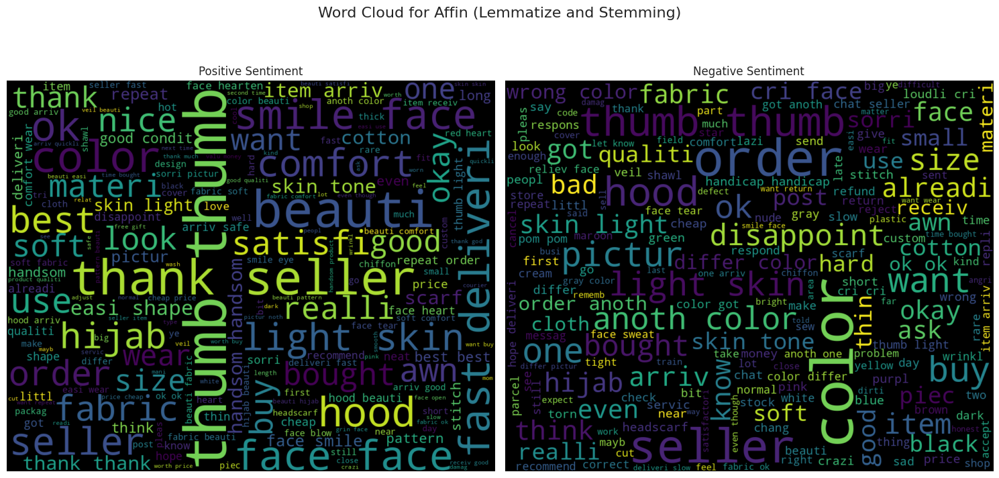

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

positive_tokens = df_afinn.loc[df_afinn['Target'] == 2, 'Lemmatized_Stemmed_Comment'].values
negative_tokens = df_afinn.loc[df_afinn['Target'] == 0, 'Lemmatized_Stemmed_Comment'].values

all_positive_tokens = [token for comment_tokens in positive_tokens for token in comment_tokens]
all_negative_tokens = [token for comment_tokens in negative_tokens for token in comment_tokens]

consolidated_positive = ' '.join(all_positive_tokens)
consolidated_negative = ' '.join(all_negative_tokens)

wordCloud_positive = WordCloud(width=1000, height=800, random_state=20, max_font_size=119).generate(consolidated_positive)
wordCloud_negative = WordCloud(width=1000, height=800, random_state=20, max_font_size=119).generate(consolidated_negative)

plt.figure(figsize=(15, 8))

plt.subplot(1, 2, 1)
plt.imshow(wordCloud_positive, interpolation='bilinear')
plt.title('Positive Sentiment')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(wordCloud_negative, interpolation='bilinear')
plt.title('Negative Sentiment')
plt.axis('off')

plt.suptitle('Word Cloud for Affin (Lemmatize and Stemming)', fontsize=16)
plt.tight_layout()
plt.show()

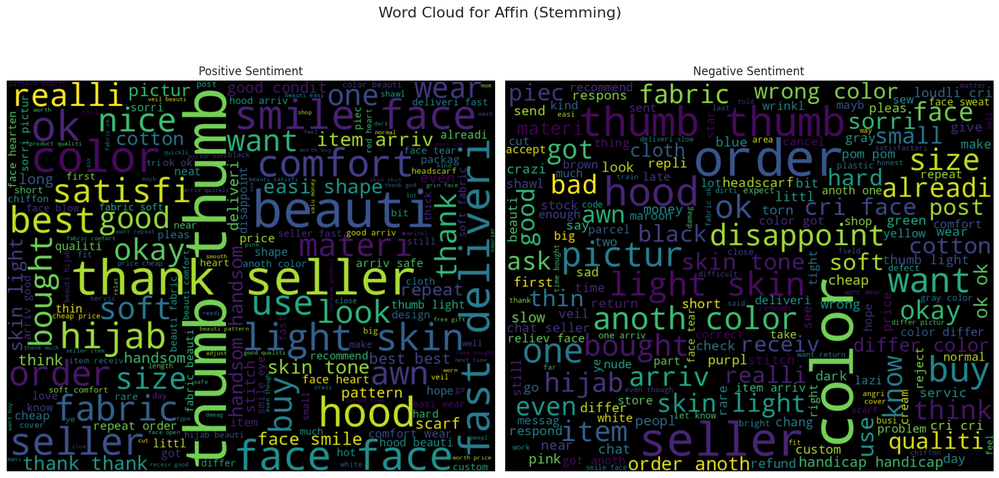

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

positive_tokens = df_afinn.loc[df_afinn['Target'] == 2, 'Stemmed_Comment'].values
negative_tokens = df_afinn.loc[df_afinn['Target'] == 0, 'Stemmed_Comment'].values

all_positive_tokens = [token for comment_tokens in positive_tokens for token in comment_tokens]
all_negative_tokens = [token for comment_tokens in negative_tokens for token in comment_tokens]

consolidated_positive = ' '.join(all_positive_tokens)
consolidated_negative = ' '.join(all_negative_tokens)

wordCloud_positive = WordCloud(width=1000, height=800, random_state=20, max_font_size=119).generate(consolidated_positive)
wordCloud_negative = WordCloud(width=1000, height=800, random_state=20, max_font_size=119).generate(consolidated_negative)

plt.figure(figsize=(15, 8))

plt.subplot(1, 2, 1)
plt.imshow(wordCloud_positive, interpolation='bilinear')
plt.title('Positive Sentiment')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(wordCloud_negative, interpolation='bilinear')
plt.title('Negative Sentiment')
plt.axis('off')

plt.suptitle('Word Cloud for Affin (Stemming)', fontsize=16)
plt.tight_layout()
plt.show()

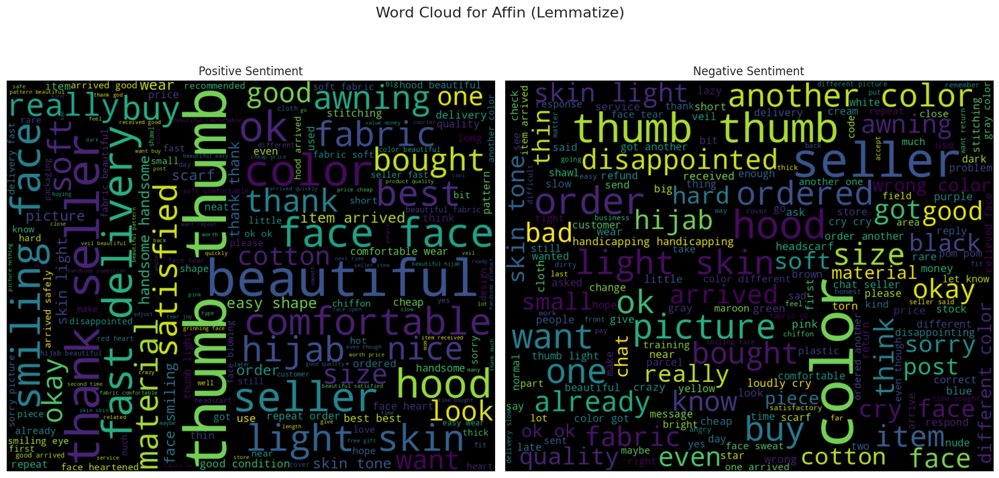

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

positive_tokens = df_afinn.loc[df_afinn['Target'] == 2, 'Lemmatized_Comment'].values
negative_tokens = df_afinn.loc[df_afinn['Target'] == 0, 'Lemmatized_Comment'].values

all_positive_tokens = [token for comment_tokens in positive_tokens for token in comment_tokens]
all_negative_tokens = [token for comment_tokens in negative_tokens for token in comment_tokens]

consolidated_positive = ' '.join(all_positive_tokens)
consolidated_negative = ' '.join(all_negative_tokens)

wordCloud_positive = WordCloud(width=1000, height=800, random_state=20, max_font_size=119).generate(consolidated_positive)
wordCloud_negative = WordCloud(width=1000, height=800, random_state=20, max_font_size=119).generate(consolidated_negative)

plt.figure(figsize=(15, 8))

plt.subplot(1, 2, 1)
plt.imshow(wordCloud_positive, interpolation='bilinear')
plt.title('Positive Sentiment')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(wordCloud_negative, interpolation='bilinear')
plt.title('Negative Sentiment')
plt.axis('off')

plt.suptitle('Word Cloud for Affin (Lemmatize)', fontsize=16)
plt.tight_layout()
plt.show()

# Machine learning

In [ ]:
import time
import numpy as np
import seaborn as sns

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB

from sklearn.model_selection import GridSearchCV

In [ ]:
models = {
    'DT': (DecisionTreeClassifier(), {'max_depth': [None, 5, 10]}),
    'RF': (RandomForestClassifier(n_estimators=100), {'max_depth': [5, 10, 20, 30, 40, 50], 'n_estimators': [100, 150, 200, 250, 300]}),
    'SVM': (SVC(kernel='poly', gamma='scale'), {'C': [0.1, 1, 10], 'degree': [2, 3]}),
    'KNN': (KNeighborsClassifier(n_neighbors=3), {'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 9, 10]}),
    'LRM': (LogisticRegression(multi_class='auto'), {'solver': ['liblinear', 'saga'], 'C': [0.1, 1, 10]}),
    'MNB': (MultinomialNB(alpha=1.0), {'alpha': [0.1, 1.0, 10.0]})
}

for model_name, (model, param_grid) in models.items():
    grid_search = GridSearchCV(model, param_grid, cv=5)
    grid_search.fit(tf_x_train, Y_train)

    print(f"Best hyperparameters for {model_name}: {grid_search.best_params_}")
    print(f"Best score for {model_name}: {grid_search.best_score_}")

SyntaxError: ignored

In [ ]:
def evaluateModel(y_test, predicted):
    acc = accuracy_score(y_test, predicted) # accuracy
    print("\nAccuracy with validation data: %4.2f%%" %(100*acc))
    print("\nClassification report:\n")
    print(classification_report(y_test, predicted))
    cm = confusion_matrix(y_test, predicted) # confusion_matrix
    plt.figure(figsize=(4, 2))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix')
    plt.show()
    return acc

In [ ]:
models = {}
models['DT'] = DecisionTreeClassifier(max_depth=None)
models['RF'] = RandomForestClassifier(max_depth=50, n_estimators=250)
models['SVM'] = SVC(kernel='poly', gamma='scale', C=1, degree=2)
models['KNN'] = KNeighborsClassifier(n_neighbors=10)
models['LRM'] = LogisticRegression(multi_class='auto', solver='saga', C=10)
models['MNB'] = MultinomialNB(alpha=1.0)

## TextBlob

### Set 1 (Stemming and Lemmatization)

#### Spliting dataset

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train, Y_test = train_test_split(df_textblob['Lemmatized_Stemmed_Comment'], df_textblob['Target'], test_size=0.2, stratify=df_textblob['Target'], random_state=30)
print("Training set contains %d examples" %len(X_train))
print("Test set contains %d examples" %len(X_test))

Training set contains 4524 examples
Test set contains 1132 examples


#### Vectorization

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer= TfidfVectorizer()

X_train = [' '.join(doc) for doc in X_train]
X_test = [' '.join(doc) for doc in X_test]

tf_x_train = vectorizer.fit_transform(X_train)
tf_x_test = vectorizer.transform(X_test)

#### Model training


Training classifier DT:
DecisionTreeClassifier()
Time to train and test classifier: 0.45 seconds

Accuracy with validation data: 84.19%

Classification report:

              precision    recall  f1-score   support

         0.0       0.82      0.76      0.79       438
         2.0       0.85      0.89      0.87       694

    accuracy                           0.84      1132
   macro avg       0.84      0.83      0.83      1132
weighted avg       0.84      0.84      0.84      1132



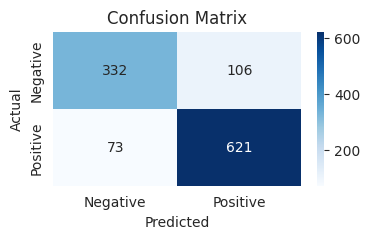


ROC AUC:  0.8264017738475913
Model DT trained.

Training classifier RF:
RandomForestClassifier(max_depth=50, n_estimators=250)
Time to train and test classifier: 4.64 seconds

Accuracy with validation data: 88.60%

Classification report:

              precision    recall  f1-score   support

         0.0       0.85      0.85      0.85       438
         2.0       0.91      0.91      0.91       694

    accuracy                           0.89      1132
   macro avg       0.88      0.88      0.88      1132
weighted avg       0.89      0.89      0.89      1132



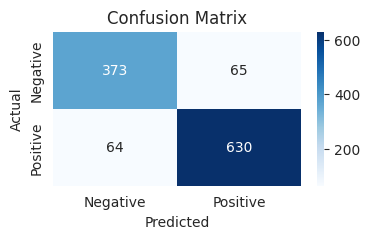


ROC AUC:  0.8796895766715357
Model RF trained.

Training classifier SVM:
SVC(C=1, degree=2, kernel='poly')
Time to train and test classifier: 2.54 seconds

Accuracy with validation data: 89.84%

Classification report:

              precision    recall  f1-score   support

         0.0       0.84      0.90      0.87       438
         2.0       0.94      0.89      0.92       694

    accuracy                           0.90      1132
   macro avg       0.89      0.90      0.89      1132
weighted avg       0.90      0.90      0.90      1132



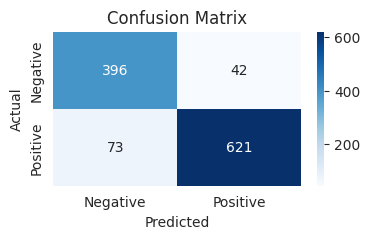


ROC AUC:  0.899461134578185
Model SVM trained.

Training classifier KNN:
KNeighborsClassifier(n_neighbors=10)
Time to train and test classifier: 1.24 seconds

Accuracy with validation data: 82.69%

Classification report:

              precision    recall  f1-score   support

         0.0       0.76      0.80      0.78       438
         2.0       0.87      0.84      0.86       694

    accuracy                           0.83      1132
   macro avg       0.82      0.82      0.82      1132
weighted avg       0.83      0.83      0.83      1132



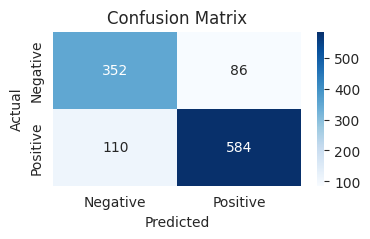


ROC AUC:  0.8225757635571697
Model KNN trained.

Training classifier LRM:
LogisticRegression(C=10, solver='saga')
Time to train and test classifier: 0.08 seconds

Accuracy with validation data: 91.08%

Classification report:

              precision    recall  f1-score   support

         0.0       0.87      0.91      0.89       438
         2.0       0.94      0.91      0.93       694

    accuracy                           0.91      1132
   macro avg       0.90      0.91      0.91      1132
weighted avg       0.91      0.91      0.91      1132



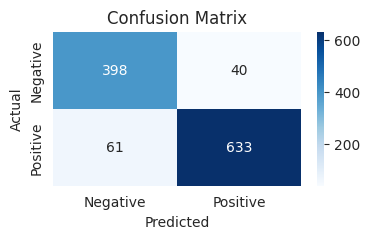


ROC AUC:  0.9103897727422262
Model LRM trained.

Training classifier MNB:
MultinomialNB()
Time to train and test classifier: 0.00 seconds

Accuracy with validation data: 86.31%

Classification report:

              precision    recall  f1-score   support

         0.0       0.86      0.77      0.81       438
         2.0       0.86      0.92      0.89       694

    accuracy                           0.86      1132
   macro avg       0.86      0.85      0.85      1132
weighted avg       0.86      0.86      0.86      1132



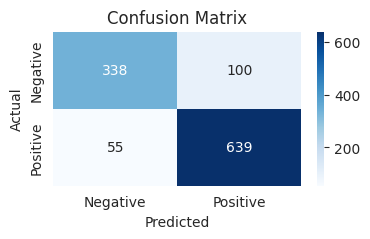


ROC AUC:  0.8462193886278999
Model MNB trained.


In [ ]:
result = []
accuracy1 = []
precision1 = []
recall1 = []
f1score1 = []
auc1 = []
TextBlob1_trained_models = {}
for m in [m for m in models]:
    model = models[m]
    print("\nTraining classifier %s:\n%s" %(m, model))
    st = time.time()
    model.fit(tf_x_train, Y_train)
    predicted = model.predict(tf_x_test)
    t = time.time() - st
    print("Time to train and test classifier: %4.2f seconds" %(t))
    acc = evaluateModel(Y_test, predicted)
    auc = roc_auc_score(Y_test, predicted)
    print("\nROC AUC: ", auc)

    precision = precision_score(Y_test, predicted, average='weighted')
    recall = recall_score(Y_test, predicted, average='weighted')
    f1 = f1_score(Y_test, predicted, average='weighted')
    result.append([m, acc, t])
    accuracy1.append(acc)
    precision1.append(precision)
    recall1.append(recall)
    f1score1.append(f1)
    auc1.append(auc)

    TextBlob1_trained_models[m] = model
    print(f"Model {m} trained.")
    print(60*'=')

In [ ]:
pd.DataFrame(result, columns=["Model", "Accuracy", "Time"])

,Model,Accuracy,Time
0,DT,0.841873,0.451436
1,RF,0.886042,4.636808
2,SVM,0.898410,2.542586
3,KNN,0.826855,1.239160
4,LRM,0.910777,0.076542
5,MNB,0.863074,0.004559


### Set 2 (Stemming)

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train, Y_test = train_test_split(df_textblob['Stemmed_Comment'], df_textblob['Target'], test_size=0.2, stratify=df_textblob['Target'], random_state=30)
print("Training set contains %d examples" %len(X_train))
print("Test set contains %d examples" %len(X_test))

Training set contains 4524 examples
Test set contains 1132 examples


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer= TfidfVectorizer()

X_train = [' '.join(doc) for doc in X_train]
X_test = [' '.join(doc) for doc in X_test]

tf_x_train = vectorizer.fit_transform(X_train)
tf_x_test = vectorizer.transform(X_test)


Training classifier DT:
DecisionTreeClassifier()
Time to train and test classifier: 0.31 seconds

Accuracy with validation data: 83.39%

Classification report:

              precision    recall  f1-score   support

         0.0       0.80      0.76      0.78       438
         2.0       0.85      0.88      0.87       694

    accuracy                           0.83      1132
   macro avg       0.83      0.82      0.82      1132
weighted avg       0.83      0.83      0.83      1132



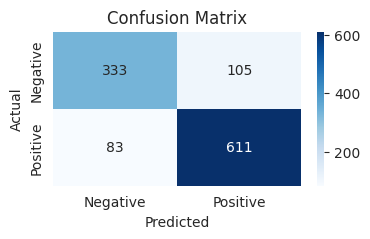


ROC AUC:  0.8203387154079981
Model DT trained.

Training classifier RF:
RandomForestClassifier(max_depth=50, n_estimators=250)
Time to train and test classifier: 5.65 seconds

Accuracy with validation data: 89.22%

Classification report:

              precision    recall  f1-score   support

         0.0       0.86      0.86      0.86       438
         2.0       0.91      0.91      0.91       694

    accuracy                           0.89      1132
   macro avg       0.89      0.89      0.89      1132
weighted avg       0.89      0.89      0.89      1132



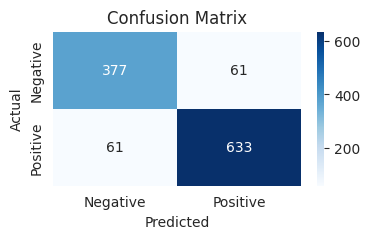


ROC AUC:  0.8864171700025002
Model RF trained.

Training classifier SVM:
SVC(C=1, degree=2, kernel='poly')
Time to train and test classifier: 2.64 seconds

Accuracy with validation data: 89.22%

Classification report:

              precision    recall  f1-score   support

         0.0       0.84      0.89      0.87       438
         2.0       0.93      0.89      0.91       694

    accuracy                           0.89      1132
   macro avg       0.88      0.89      0.89      1132
weighted avg       0.89      0.89      0.89      1132



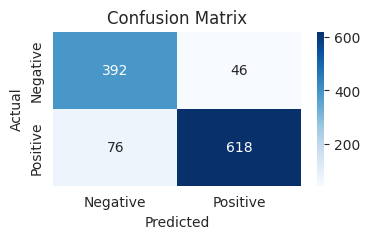


ROC AUC:  0.89273354124722
Model SVM trained.

Training classifier KNN:
KNeighborsClassifier(n_neighbors=10)
Time to train and test classifier: 1.20 seconds

Accuracy with validation data: 82.77%

Classification report:

              precision    recall  f1-score   support

         0.0       0.76      0.80      0.78       438
         2.0       0.87      0.84      0.86       694

    accuracy                           0.83      1132
   macro avg       0.82      0.82      0.82      1132
weighted avg       0.83      0.83      0.83      1132



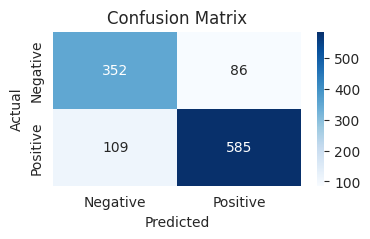


ROC AUC:  0.8232962246522706
Model KNN trained.

Training classifier LRM:
LogisticRegression(C=10, solver='saga')
Time to train and test classifier: 0.07 seconds

Accuracy with validation data: 91.17%

Classification report:

              precision    recall  f1-score   support

         0.0       0.87      0.91      0.89       438
         2.0       0.94      0.91      0.93       694

    accuracy                           0.91      1132
   macro avg       0.90      0.91      0.91      1132
weighted avg       0.91      0.91      0.91      1132



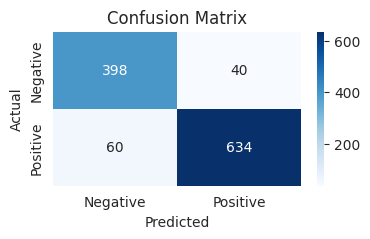


ROC AUC:  0.9111102338373271
Model LRM trained.

Training classifier MNB:
MultinomialNB()
Time to train and test classifier: 0.00 seconds

Accuracy with validation data: 86.13%

Classification report:

              precision    recall  f1-score   support

         0.0       0.86      0.77      0.81       438
         2.0       0.86      0.92      0.89       694

    accuracy                           0.86      1132
   macro avg       0.86      0.84      0.85      1132
weighted avg       0.86      0.86      0.86      1132



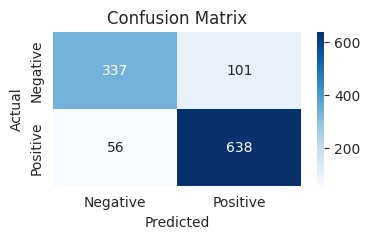


ROC AUC:  0.8443573750213835
Model MNB trained.


In [ ]:
result = []
accuracy2 = []
precision2 = []
recall2 = []
f1score2 = []
auc2 = []
TextBlob2_trained_models = {}
for m in [m for m in models]:
    model = models[m]
    print("\nTraining classifier %s:\n%s" %(m, model))
    st = time.time()
    model.fit(tf_x_train, Y_train)
    predicted = model.predict(tf_x_test)
    t = time.time() - st
    print("Time to train and test classifier: %4.2f seconds" %(t))
    acc = evaluateModel(Y_test, predicted)
    auc = roc_auc_score(Y_test, predicted)
    print("\nROC AUC: ", auc)

    precision = precision_score(Y_test, predicted, average='weighted')
    recall = recall_score(Y_test, predicted, average='weighted')
    f1 = f1_score(Y_test, predicted, average='weighted')
    result.append([m, acc, t])
    accuracy2.append(acc)
    precision2.append(precision)
    recall2.append(recall)
    f1score2.append(f1)
    auc2.append(auc)
    TextBlob2_trained_models[m] = model
    print(f"Model {m} trained.")
    print(60*'=')

In [ ]:
pd.DataFrame(result, columns=["Model", "Accuracy", "Time"])

,Model,Accuracy,Time
0,DT,0.833922,0.312490
1,RF,0.892226,5.654483
2,SVM,0.892226,2.643893
3,KNN,0.827739,1.197128
4,LRM,0.911661,0.073603
5,MNB,0.861307,0.004854


### Set 3 (Lemmatization)

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train, Y_test = train_test_split(df_textblob['Lemmatized_Comment'], df_textblob['Target'], test_size=0.2, stratify=df_textblob['Target'], random_state=30)
print("Training set contains %d examples" %len(X_train))
print("Test set contains %d examples" %len(X_test))

Training set contains 4524 examples
Test set contains 1132 examples


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer= TfidfVectorizer()

X_train = [' '.join(doc) for doc in X_train]
X_test = [' '.join(doc) for doc in X_test]

tf_x_train = vectorizer.fit_transform(X_train)
tf_x_test = vectorizer.transform(X_test)


Training classifier DT:
DecisionTreeClassifier()
Time to train and test classifier: 0.33 seconds

Accuracy with validation data: 84.45%

Classification report:

              precision    recall  f1-score   support

         0.0       0.80      0.79      0.80       438
         2.0       0.87      0.88      0.87       694

    accuracy                           0.84      1132
   macro avg       0.84      0.83      0.84      1132
weighted avg       0.84      0.84      0.84      1132



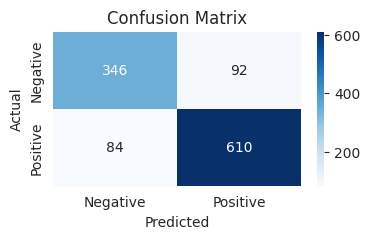


ROC AUC:  0.8344584369612991
Model DT trained.

Training classifier RF:
RandomForestClassifier(max_depth=50, n_estimators=250)
Time to train and test classifier: 4.19 seconds

Accuracy with validation data: 89.05%

Classification report:

              precision    recall  f1-score   support

         0.0       0.86      0.85      0.86       438
         2.0       0.91      0.91      0.91       694

    accuracy                           0.89      1132
   macro avg       0.89      0.88      0.88      1132
weighted avg       0.89      0.89      0.89      1132



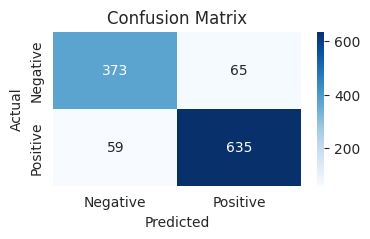


ROC AUC:  0.8832918821470398
Model RF trained.

Training classifier SVM:
SVC(C=1, degree=2, kernel='poly')
Time to train and test classifier: 3.55 seconds

Accuracy with validation data: 89.75%

Classification report:

              precision    recall  f1-score   support

         0.0       0.85      0.89      0.87       438
         2.0       0.93      0.90      0.92       694

    accuracy                           0.90      1132
   macro avg       0.89      0.90      0.89      1132
weighted avg       0.90      0.90      0.90      1132



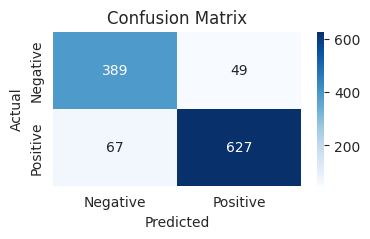


ROC AUC:  0.8957930335688814
Model SVM trained.

Training classifier KNN:
KNeighborsClassifier(n_neighbors=10)
Time to train and test classifier: 2.00 seconds

Accuracy with validation data: 82.77%

Classification report:

              precision    recall  f1-score   support

         0.0       0.77      0.80      0.78       438
         2.0       0.87      0.85      0.86       694

    accuracy                           0.83      1132
   macro avg       0.82      0.82      0.82      1132
weighted avg       0.83      0.83      0.83      1132



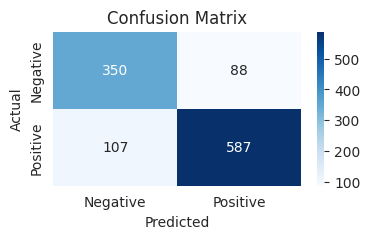


ROC AUC:  0.8224540418196412
Model KNN trained.

Training classifier LRM:
LogisticRegression(C=10, solver='saga')
Time to train and test classifier: 0.07 seconds

Accuracy with validation data: 91.70%

Classification report:

              precision    recall  f1-score   support

         0.0       0.88      0.91      0.89       438
         2.0       0.94      0.92      0.93       694

    accuracy                           0.92      1132
   macro avg       0.91      0.92      0.91      1132
weighted avg       0.92      0.92      0.92      1132



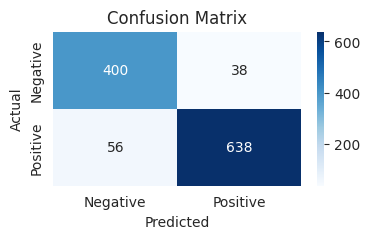


ROC AUC:  0.9162751832405616
Model LRM trained.

Training classifier MNB:
MultinomialNB()
Time to train and test classifier: 0.01 seconds

Accuracy with validation data: 86.57%

Classification report:

              precision    recall  f1-score   support

         0.0       0.86      0.77      0.82       438
         2.0       0.87      0.92      0.89       694

    accuracy                           0.87      1132
   macro avg       0.87      0.85      0.86      1132
weighted avg       0.87      0.87      0.86      1132



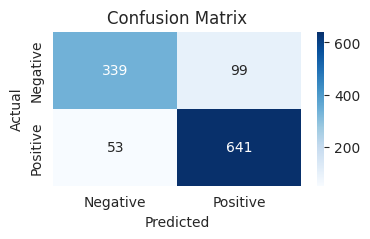


ROC AUC:  0.8488018633295171
Model MNB trained.


In [ ]:
result = []
accuracy3 = []
precision3 = []
recall3 = []
f1score3 = []
auc3 = []
TextBlob3_trained_models = {}
for m in [m for m in models]:
    model = models[m]
    print("\nTraining classifier %s:\n%s" %(m, model))
    st = time.time()
    model.fit(tf_x_train, Y_train)
    predicted = model.predict(tf_x_test)
    t = time.time() - st
    print("Time to train and test classifier: %4.2f seconds" %(t))
    acc = evaluateModel(Y_test, predicted)
    auc = roc_auc_score(Y_test, predicted)
    print("\nROC AUC: ", auc)
    precision = precision_score(Y_test, predicted, average='weighted')
    recall = recall_score(Y_test, predicted, average='weighted')
    f1 = f1_score(Y_test, predicted, average='weighted')
    result.append([m, acc, t])
    accuracy3.append(acc)
    precision3.append(precision)
    recall3.append(recall)
    f1score3.append(f1)
    auc3.append(auc)
    TextBlob3_trained_models[m] = model
    print(f"Model {m} trained.")
    print(60*'=')

In [ ]:
pd.DataFrame(result, columns=["Model", "Accuracy", "Time"])

,Model,Accuracy,Time
0,DT,0.844523,0.330462
1,RF,0.890459,4.187306
2,SVM,0.897527,3.548493
3,KNN,0.827739,1.996130
4,LRM,0.916961,0.074892
5,MNB,0.865724,0.005435


## Vader

### Set 1

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train, Y_test = train_test_split(df_vader['Lemmatized_Stemmed_Comment'], df_vader['Target'], test_size=0.2, stratify=df_vader['Target'], random_state=30)
print("Training set contains %d examples" %len(X_train))
print("Test set contains %d examples" %len(X_test))

Training set contains 4524 examples
Test set contains 1132 examples


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer= TfidfVectorizer()

X_train = [' '.join(doc) for doc in X_train]
X_test = [' '.join(doc) for doc in X_test]

tf_x_train = vectorizer.fit_transform(X_train)
tf_x_test = vectorizer.transform(X_test)


Training classifier DT:
DecisionTreeClassifier()
Time to train and test classifier: 0.32 seconds

Accuracy with validation data: 83.04%

Classification report:

              precision    recall  f1-score   support

         0.0       0.84      0.81      0.82       555
         2.0       0.82      0.85      0.84       577

    accuracy                           0.83      1132
   macro avg       0.83      0.83      0.83      1132
weighted avg       0.83      0.83      0.83      1132



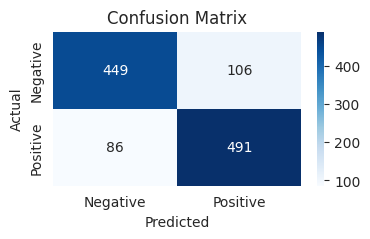


ROC AUC:  0.8299811076240885
Model DT trained.

Training classifier RF:
RandomForestClassifier(max_depth=50, n_estimators=250)
Time to train and test classifier: 5.63 seconds

Accuracy with validation data: 89.40%

Classification report:

              precision    recall  f1-score   support

         0.0       0.89      0.89      0.89       555
         2.0       0.89      0.90      0.90       577

    accuracy                           0.89      1132
   macro avg       0.89      0.89      0.89      1132
weighted avg       0.89      0.89      0.89      1132



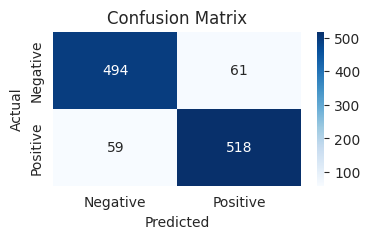


ROC AUC:  0.8939185285805736
Model RF trained.

Training classifier SVM:
SVC(C=1, degree=2, kernel='poly')
Time to train and test classifier: 3.22 seconds

Accuracy with validation data: 89.66%

Classification report:

              precision    recall  f1-score   support

         0.0       0.89      0.90      0.90       555
         2.0       0.90      0.89      0.90       577

    accuracy                           0.90      1132
   macro avg       0.90      0.90      0.90      1132
weighted avg       0.90      0.90      0.90      1132



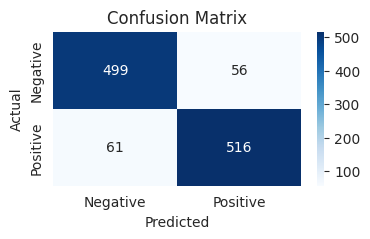


ROC AUC:  0.8966899308320453
Model SVM trained.

Training classifier KNN:
KNeighborsClassifier(n_neighbors=10)
Time to train and test classifier: 2.01 seconds

Accuracy with validation data: 82.24%

Classification report:

              precision    recall  f1-score   support

         0.0       0.81      0.83      0.82       555
         2.0       0.83      0.82      0.82       577

    accuracy                           0.82      1132
   macro avg       0.82      0.82      0.82      1132
weighted avg       0.82      0.82      0.82      1132



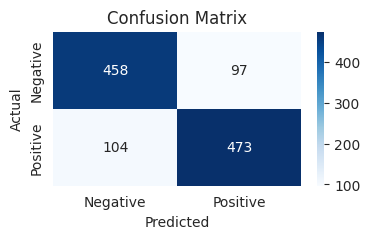


ROC AUC:  0.8224912954549004
Model KNN trained.

Training classifier LRM:
LogisticRegression(C=10, solver='saga')
Time to train and test classifier: 0.13 seconds

Accuracy with validation data: 89.22%

Classification report:

              precision    recall  f1-score   support

         0.0       0.89      0.89      0.89       555
         2.0       0.89      0.90      0.89       577

    accuracy                           0.89      1132
   macro avg       0.89      0.89      0.89      1132
weighted avg       0.89      0.89      0.89      1132



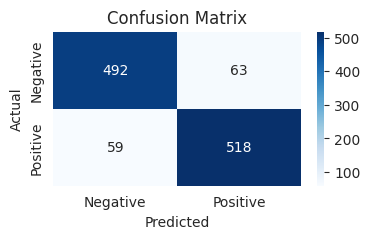


ROC AUC:  0.8921167267787719
Model LRM trained.

Training classifier MNB:
MultinomialNB()
Time to train and test classifier: 0.01 seconds

Accuracy with validation data: 88.69%

Classification report:

              precision    recall  f1-score   support

         0.0       0.91      0.86      0.88       555
         2.0       0.87      0.91      0.89       577

    accuracy                           0.89      1132
   macro avg       0.89      0.89      0.89      1132
weighted avg       0.89      0.89      0.89      1132



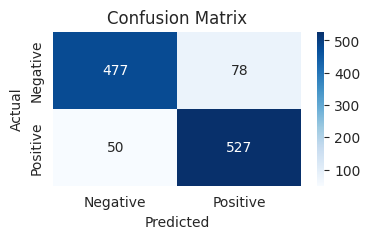


ROC AUC:  0.8864021734039064
Model MNB trained.


In [ ]:
result = []
accuracy4 = []
precision4 = []
recall4 = []
f1score4 = []
auc4 = []
VADER1_trained_models = {}
for m in [m for m in models]:
    model = models[m]
    print("\nTraining classifier %s:\n%s" %(m, model))
    st = time.time()
    model.fit(tf_x_train, Y_train)
    predicted = model.predict(tf_x_test)
    t = time.time() - st
    print("Time to train and test classifier: %4.2f seconds" %(t))
    acc = evaluateModel(Y_test, predicted)
    auc = roc_auc_score(Y_test, predicted)
    print("\nROC AUC: ", auc)
    precision = precision_score(Y_test, predicted, average='weighted')
    recall = recall_score(Y_test, predicted, average='weighted')
    f1 = f1_score(Y_test, predicted, average='weighted')
    result.append([m, acc, t])
    accuracy4.append(acc)
    precision4.append(precision)
    recall4.append(recall)
    f1score4.append(f1)
    auc4.append(auc)
    VADER1_trained_models[m] = model
    print(f"Model {m} trained.")
    print(60*'=')

In [ ]:
pd.DataFrame(result, columns=["Model", "Accuracy", "Time"])

,Model,Accuracy,Time
0,DT,0.830389,0.318564
1,RF,0.893993,5.627936
2,SVM,0.896643,3.219504
3,KNN,0.822438,2.008184
4,LRM,0.892226,0.132947
5,MNB,0.886926,0.006507


### Set 2

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train, Y_test = train_test_split(df_vader['Stemmed_Comment'], df_vader['Target'], test_size=0.2, stratify=df_vader['Target'], random_state=30)
print("Training set contains %d examples" %len(X_train))
print("Test set contains %d examples" %len(X_test))

Training set contains 4524 examples
Test set contains 1132 examples


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer= TfidfVectorizer()

X_train = [' '.join(doc) for doc in X_train]
X_test = [' '.join(doc) for doc in X_test]

tf_x_train = vectorizer.fit_transform(X_train)
tf_x_test = vectorizer.transform(X_test)


Training classifier DT:
DecisionTreeClassifier()
Time to train and test classifier: 0.49 seconds

Accuracy with validation data: 82.51%

Classification report:

              precision    recall  f1-score   support

         0.0       0.83      0.81      0.82       555
         2.0       0.82      0.84      0.83       577

    accuracy                           0.83      1132
   macro avg       0.83      0.82      0.82      1132
weighted avg       0.83      0.83      0.83      1132



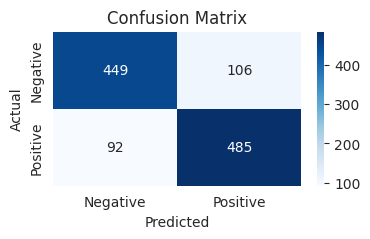


ROC AUC:  0.8247818008649898
Model DT trained.

Training classifier RF:
RandomForestClassifier(max_depth=50, n_estimators=250)
Time to train and test classifier: 4.57 seconds

Accuracy with validation data: 89.66%

Classification report:

              precision    recall  f1-score   support

         0.0       0.90      0.89      0.89       555
         2.0       0.89      0.91      0.90       577

    accuracy                           0.90      1132
   macro avg       0.90      0.90      0.90      1132
weighted avg       0.90      0.90      0.90      1132



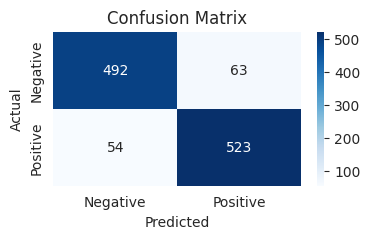


ROC AUC:  0.8964494824113541
Model RF trained.

Training classifier SVM:
SVC(C=1, degree=2, kernel='poly')
Time to train and test classifier: 2.45 seconds

Accuracy with validation data: 89.66%

Classification report:

              precision    recall  f1-score   support

         0.0       0.89      0.90      0.89       555
         2.0       0.90      0.90      0.90       577

    accuracy                           0.90      1132
   macro avg       0.90      0.90      0.90      1132
weighted avg       0.90      0.90      0.90      1132



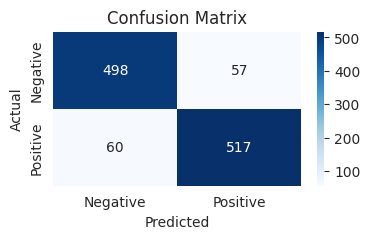


ROC AUC:  0.8966555810576607
Model SVM trained.

Training classifier KNN:
KNeighborsClassifier(n_neighbors=10)
Time to train and test classifier: 1.21 seconds

Accuracy with validation data: 82.24%

Classification report:

              precision    recall  f1-score   support

         0.0       0.81      0.83      0.82       555
         2.0       0.83      0.82      0.82       577

    accuracy                           0.82      1132
   macro avg       0.82      0.82      0.82      1132
weighted avg       0.82      0.82      0.82      1132



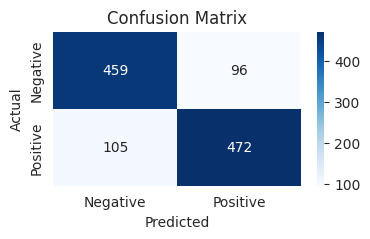


ROC AUC:  0.8225256452292847
Model KNN trained.

Training classifier LRM:
LogisticRegression(C=10, solver='saga')
Time to train and test classifier: 0.09 seconds

Accuracy with validation data: 89.40%

Classification report:

              precision    recall  f1-score   support

         0.0       0.89      0.89      0.89       555
         2.0       0.89      0.90      0.90       577

    accuracy                           0.89      1132
   macro avg       0.89      0.89      0.89      1132
weighted avg       0.89      0.89      0.89      1132



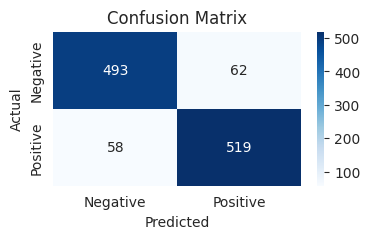


ROC AUC:  0.8938841788061892
Model LRM trained.

Training classifier MNB:
MultinomialNB()
Time to train and test classifier: 0.01 seconds

Accuracy with validation data: 88.69%

Classification report:

              precision    recall  f1-score   support

         0.0       0.91      0.86      0.88       555
         2.0       0.87      0.91      0.89       577

    accuracy                           0.89      1132
   macro avg       0.89      0.89      0.89      1132
weighted avg       0.89      0.89      0.89      1132



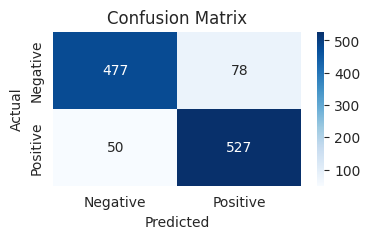


ROC AUC:  0.8864021734039064
Model MNB trained.


In [ ]:
result = []
accuracy5 = []
precision5 = []
recall5 = []
f1score5 = []
auc5 = []
VADER2_trained_models = {}
for m in [m for m in models]:
    model = models[m]
    print("\nTraining classifier %s:\n%s" %(m, model))
    st = time.time()
    model.fit(tf_x_train, Y_train)
    predicted = model.predict(tf_x_test)
    t = time.time() - st
    print("Time to train and test classifier: %4.2f seconds" %(t))
    acc = evaluateModel(Y_test, predicted)
    auc = roc_auc_score(Y_test, predicted)
    print("\nROC AUC: ", auc)
    precision = precision_score(Y_test, predicted, average='weighted')
    recall = recall_score(Y_test, predicted, average='weighted')
    f1 = f1_score(Y_test, predicted, average='weighted')
    result.append([m, acc, t])
    accuracy5.append(acc)
    precision5.append(precision)
    recall5.append(recall)
    f1score5.append(f1)
    auc5.append(auc)
    VADER2_trained_models[m] = model
    print(f"Model {m} trained.")
    print(60*'=')

In [ ]:
pd.DataFrame(result, columns=["Model", "Accuracy", "Time"])

,Model,Accuracy,Time
0,DT,0.825088,0.494020
1,RF,0.896643,4.565499
2,SVM,0.896643,2.449161
3,KNN,0.822438,1.208845
4,LRM,0.893993,0.091126
5,MNB,0.886926,0.005148


### Set 3

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train, Y_test = train_test_split(df_vader['Lemmatized_Comment'], df_vader['Target'], test_size=0.2, stratify=df_vader['Target'], random_state=30)
print("Training set contains %d examples" %len(X_train))
print("Test set contains %d examples" %len(X_test))

Training set contains 4524 examples
Test set contains 1132 examples


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer= TfidfVectorizer()

X_train = [' '.join(doc) for doc in X_train]
X_test = [' '.join(doc) for doc in X_test]

tf_x_train = vectorizer.fit_transform(X_train)
tf_x_test = vectorizer.transform(X_test)


Training classifier DT:
DecisionTreeClassifier()
Time to train and test classifier: 0.39 seconds

Accuracy with validation data: 81.63%

Classification report:

              precision    recall  f1-score   support

         0.0       0.82      0.80      0.81       555
         2.0       0.81      0.84      0.82       577

    accuracy                           0.82      1132
   macro avg       0.82      0.82      0.82      1132
weighted avg       0.82      0.82      0.82      1132



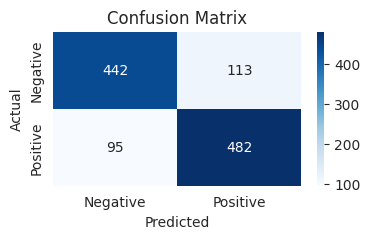


ROC AUC:  0.8158758411791341
Model DT trained.

Training classifier RF:
RandomForestClassifier(max_depth=50, n_estimators=250)
Time to train and test classifier: 5.94 seconds

Accuracy with validation data: 88.87%

Classification report:

              precision    recall  f1-score   support

         0.0       0.90      0.87      0.88       555
         2.0       0.88      0.90      0.89       577

    accuracy                           0.89      1132
   macro avg       0.89      0.89      0.89      1132
weighted avg       0.89      0.89      0.89      1132



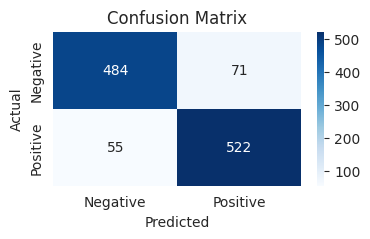


ROC AUC:  0.8883757240776304
Model RF trained.

Training classifier SVM:
SVC(C=1, degree=2, kernel='poly')
Time to train and test classifier: 2.96 seconds

Accuracy with validation data: 89.58%

Classification report:

              precision    recall  f1-score   support

         0.0       0.89      0.89      0.89       555
         2.0       0.90      0.90      0.90       577

    accuracy                           0.90      1132
   macro avg       0.90      0.90      0.90      1132
weighted avg       0.90      0.90      0.90      1132



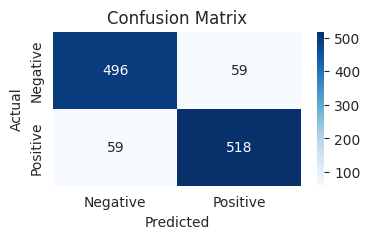


ROC AUC:  0.8957203303823754
Model SVM trained.

Training classifier KNN:
KNeighborsClassifier(n_neighbors=10)
Time to train and test classifier: 1.20 seconds

Accuracy with validation data: 81.89%

Classification report:

              precision    recall  f1-score   support

         0.0       0.81      0.82      0.82       555
         2.0       0.83      0.82      0.82       577

    accuracy                           0.82      1132
   macro avg       0.82      0.82      0.82      1132
weighted avg       0.82      0.82      0.82      1132



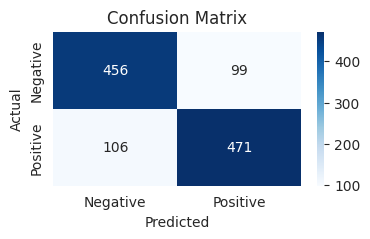


ROC AUC:  0.8189563914000656
Model KNN trained.

Training classifier LRM:
LogisticRegression(C=10, solver='saga')
Time to train and test classifier: 0.09 seconds

Accuracy with validation data: 89.75%

Classification report:

              precision    recall  f1-score   support

         0.0       0.90      0.89      0.90       555
         2.0       0.90      0.90      0.90       577

    accuracy                           0.90      1132
   macro avg       0.90      0.90      0.90      1132
weighted avg       0.90      0.90      0.90      1132



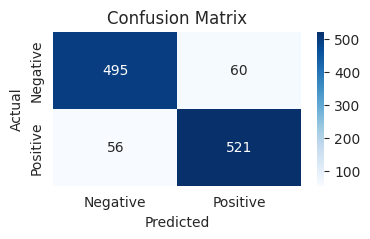


ROC AUC:  0.8974190828610239
Model LRM trained.

Training classifier MNB:
MultinomialNB()
Time to train and test classifier: 0.00 seconds

Accuracy with validation data: 88.60%

Classification report:

              precision    recall  f1-score   support

         0.0       0.91      0.85      0.88       555
         2.0       0.87      0.92      0.89       577

    accuracy                           0.89      1132
   macro avg       0.89      0.89      0.89      1132
weighted avg       0.89      0.89      0.89      1132



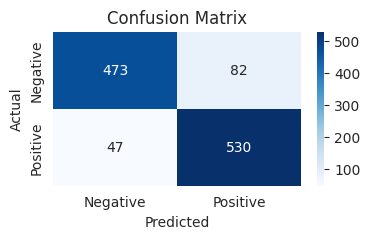


ROC AUC:  0.8853982231798523
Model MNB trained.


In [ ]:
result = []
accuracy6 = []
precision6 = []
recall6 = []
f1score6 = []
auc6 = []
VADER3_trained_models = {}
for m in [m for m in models]:
    model = models[m]
    print("\nTraining classifier %s:\n%s" %(m, model))
    st = time.time()
    model.fit(tf_x_train, Y_train)
    predicted = model.predict(tf_x_test)
    t = time.time() - st
    print("Time to train and test classifier: %4.2f seconds" %(t))
    acc = evaluateModel(Y_test, predicted)
    auc = roc_auc_score(Y_test, predicted)
    print("\nROC AUC: ", auc)
    precision = precision_score(Y_test, predicted, average='weighted')
    recall = recall_score(Y_test, predicted, average='weighted')
    f1 = f1_score(Y_test, predicted, average='weighted')
    result.append([m, acc, t])
    accuracy6.append(acc)
    precision6.append(precision)
    recall6.append(recall)
    f1score6.append(f1)
    auc6.append(auc)
    VADER3_trained_models[m] = model

    print(f"Model {m} trained.")
    print(60*'=')

In [ ]:
pd.DataFrame(result, columns=["Model", "Accuracy", "Time"])

,Model,Accuracy,Time
0,DT,0.816254,0.388149
1,RF,0.888693,5.942116
2,SVM,0.895760,2.955363
3,KNN,0.818905,1.198364
4,LRM,0.897527,0.086286
5,MNB,0.886042,0.003768


## Afinn

### Set 1

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train, Y_test = train_test_split(df_afinn['Lemmatized_Stemmed_Comment'], df_afinn['Target'], test_size=0.2, stratify=df_afinn['Target'], random_state=30)
print("Training set contains %d examples" %len(X_train))
print("Test set contains %d examples" %len(X_test))

Training set contains 4524 examples
Test set contains 1132 examples


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer= TfidfVectorizer()

X_train = [' '.join(doc) for doc in X_train]
X_test = [' '.join(doc) for doc in X_test]

tf_x_train = vectorizer.fit_transform(X_train)
tf_x_test = vectorizer.transform(X_test)


Training classifier DT:
DecisionTreeClassifier()
Time to train and test classifier: 0.25 seconds

Accuracy with validation data: 85.16%

Classification report:

              precision    recall  f1-score   support

         0.0       0.79      0.77      0.78       391
         2.0       0.88      0.89      0.89       741

    accuracy                           0.85      1132
   macro avg       0.84      0.83      0.83      1132
weighted avg       0.85      0.85      0.85      1132



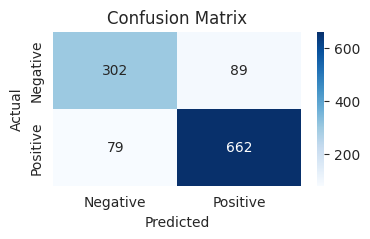


ROC AUC:  0.8328829155319935
Model DT trained.

Training classifier RF:
RandomForestClassifier(max_depth=50, n_estimators=250)
Time to train and test classifier: 4.39 seconds

Accuracy with validation data: 90.02%

Classification report:

              precision    recall  f1-score   support

         0.0       0.88      0.83      0.85       391
         2.0       0.91      0.94      0.92       741

    accuracy                           0.90      1132
   macro avg       0.89      0.88      0.89      1132
weighted avg       0.90      0.90      0.90      1132



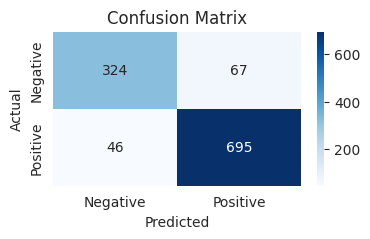


ROC AUC:  0.8832831143370921
Model RF trained.

Training classifier SVM:
SVC(C=1, degree=2, kernel='poly')
Time to train and test classifier: 3.01 seconds

Accuracy with validation data: 88.60%

Classification report:

              precision    recall  f1-score   support

         0.0       0.85      0.82      0.83       391
         2.0       0.91      0.92      0.91       741

    accuracy                           0.89      1132
   macro avg       0.88      0.87      0.87      1132
weighted avg       0.89      0.89      0.89      1132



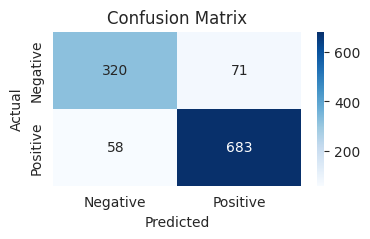


ROC AUC:  0.8700708588311226
Model SVM trained.

Training classifier KNN:
KNeighborsClassifier(n_neighbors=10)
Time to train and test classifier: 1.44 seconds

Accuracy with validation data: 82.42%

Classification report:

              precision    recall  f1-score   support

         0.0       0.73      0.78      0.75       391
         2.0       0.88      0.85      0.86       741

    accuracy                           0.82      1132
   macro avg       0.80      0.81      0.81      1132
weighted avg       0.83      0.82      0.83      1132



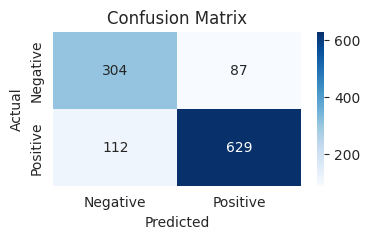


ROC AUC:  0.813173253811294
Model KNN trained.

Training classifier LRM:
LogisticRegression(C=10, solver='saga')
Time to train and test classifier: 0.08 seconds

Accuracy with validation data: 90.81%

Classification report:

              precision    recall  f1-score   support

         0.0       0.87      0.87      0.87       391
         2.0       0.93      0.93      0.93       741

    accuracy                           0.91      1132
   macro avg       0.90      0.90      0.90      1132
weighted avg       0.91      0.91      0.91      1132



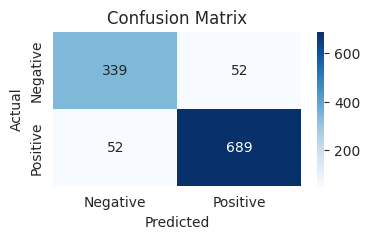


ROC AUC:  0.8984161170188898
Model LRM trained.

Training classifier MNB:
MultinomialNB()
Time to train and test classifier: 0.01 seconds

Accuracy with validation data: 84.36%

Classification report:

              precision    recall  f1-score   support

         0.0       0.87      0.64      0.74       391
         2.0       0.83      0.95      0.89       741

    accuracy                           0.84      1132
   macro avg       0.85      0.80      0.81      1132
weighted avg       0.85      0.84      0.84      1132



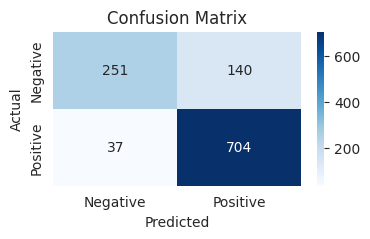


ROC AUC:  0.7960056051993056
Model MNB trained.


In [ ]:
result = []
accuracy7 = []
precision7 = []
recall7 = []
f1score7 = []
auc7 = []
Afinn1_trained_models = {}
for m in [m for m in models]:
    model = models[m]
    print("\nTraining classifier %s:\n%s" %(m, model))
    st = time.time()
    model.fit(tf_x_train, Y_train)
    predicted = model.predict(tf_x_test)
    t = time.time() - st
    print("Time to train and test classifier: %4.2f seconds" %(t))
    acc = evaluateModel(Y_test, predicted)
    auc = roc_auc_score(Y_test, predicted)
    print("\nROC AUC: ", auc)
    precision = precision_score(Y_test, predicted, average='weighted')
    recall = recall_score(Y_test, predicted, average='weighted')
    f1 = f1_score(Y_test, predicted, average='weighted')
    result.append([m, acc, t])
    accuracy7.append(acc)
    precision7.append(precision)
    recall7.append(recall)
    f1score7.append(f1)
    auc7.append(auc)
    Afinn1_trained_models[m] = model
    print(f"Model {m} trained.")
    print(60*'=')

In [ ]:
pd.DataFrame(result, columns=["Model", "Accuracy", "Time"])

,Model,Accuracy,Time
0,DT,0.851590,0.247832
1,RF,0.900177,4.387626
2,SVM,0.886042,3.005430
3,KNN,0.824205,1.441618
4,LRM,0.908127,0.075028
5,MNB,0.843640,0.005192


### Set 2

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train, Y_test = train_test_split(df_afinn['Stemmed_Comment'], df_afinn['Target'], test_size=0.2, stratify=df_afinn['Target'], random_state=30)
print("Training set contains %d examples" %len(X_train))
print("Test set contains %d examples" %len(X_test))

Training set contains 4524 examples
Test set contains 1132 examples


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer= TfidfVectorizer()

X_train = [' '.join(doc) for doc in X_train]
X_test = [' '.join(doc) for doc in X_test]

tf_x_train = vectorizer.fit_transform(X_train)
tf_x_test = vectorizer.transform(X_test)


Training classifier DT:
DecisionTreeClassifier()
Time to train and test classifier: 0.25 seconds

Accuracy with validation data: 85.42%

Classification report:

              precision    recall  f1-score   support

         0.0       0.80      0.77      0.79       391
         2.0       0.88      0.90      0.89       741

    accuracy                           0.85      1132
   macro avg       0.84      0.83      0.84      1132
weighted avg       0.85      0.85      0.85      1132



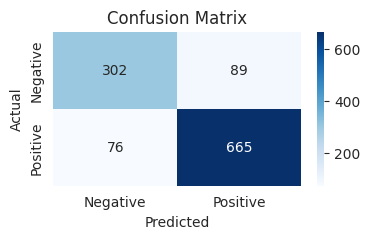


ROC AUC:  0.8349072070299691
Model DT trained.

Training classifier RF:
RandomForestClassifier(max_depth=50, n_estimators=250)
Time to train and test classifier: 3.90 seconds

Accuracy with validation data: 90.11%

Classification report:

              precision    recall  f1-score   support

         0.0       0.88      0.83      0.85       391
         2.0       0.91      0.94      0.93       741

    accuracy                           0.90      1132
   macro avg       0.90      0.88      0.89      1132
weighted avg       0.90      0.90      0.90      1132



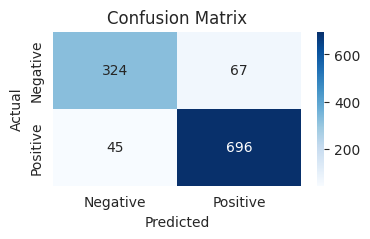


ROC AUC:  0.8839578781697506
Model RF trained.

Training classifier SVM:
SVC(C=1, degree=2, kernel='poly')
Time to train and test classifier: 2.42 seconds

Accuracy with validation data: 88.87%

Classification report:

              precision    recall  f1-score   support

         0.0       0.85      0.82      0.84       391
         2.0       0.91      0.93      0.92       741

    accuracy                           0.89      1132
   macro avg       0.88      0.87      0.88      1132
weighted avg       0.89      0.89      0.89      1132



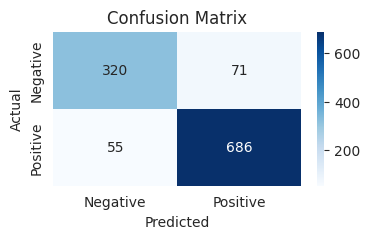


ROC AUC:  0.8720951503290983
Model SVM trained.

Training classifier KNN:
KNeighborsClassifier(n_neighbors=10)
Time to train and test classifier: 1.65 seconds

Accuracy with validation data: 82.51%

Classification report:

              precision    recall  f1-score   support

         0.0       0.73      0.78      0.75       391
         2.0       0.88      0.85      0.86       741

    accuracy                           0.83      1132
   macro avg       0.81      0.81      0.81      1132
weighted avg       0.83      0.83      0.83      1132



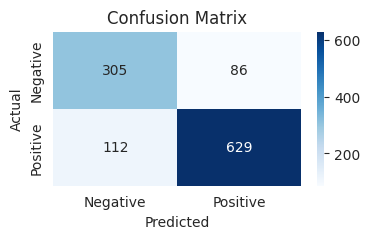


ROC AUC:  0.8144520261898105
Model KNN trained.

Training classifier LRM:
LogisticRegression(C=10, solver='saga')
Time to train and test classifier: 0.12 seconds

Accuracy with validation data: 91.43%

Classification report:

              precision    recall  f1-score   support

         0.0       0.88      0.88      0.88       391
         2.0       0.94      0.93      0.93       741

    accuracy                           0.91      1132
   macro avg       0.91      0.91      0.91      1132
weighted avg       0.91      0.91      0.91      1132



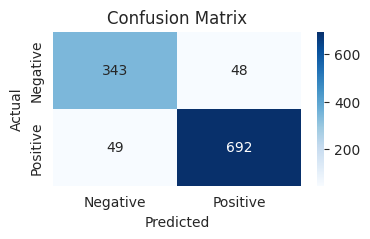


ROC AUC:  0.905555498030932
Model LRM trained.

Training classifier MNB:
MultinomialNB()
Time to train and test classifier: 0.01 seconds

Accuracy with validation data: 84.36%

Classification report:

              precision    recall  f1-score   support

         0.0       0.87      0.64      0.74       391
         2.0       0.83      0.95      0.89       741

    accuracy                           0.84      1132
   macro avg       0.85      0.80      0.81      1132
weighted avg       0.85      0.84      0.84      1132



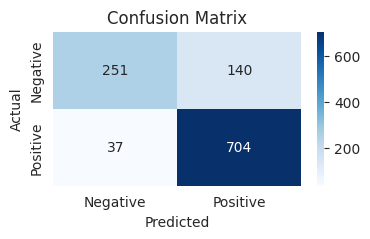


ROC AUC:  0.7960056051993056
Model MNB trained.


In [ ]:
result = []
accuracy8 = []
precision8 = []
recall8 = []
f1score8 = []
auc8 = []
Afinn2_trained_models = {}
for m in [m for m in models]:
    model = models[m]
    print("\nTraining classifier %s:\n%s" %(m, model))
    st = time.time()
    model.fit(tf_x_train, Y_train)
    predicted = model.predict(tf_x_test)
    t = time.time() - st
    print("Time to train and test classifier: %4.2f seconds" %(t))
    acc = evaluateModel(Y_test, predicted)
    auc = roc_auc_score(Y_test, predicted)
    print("\nROC AUC: ", auc)
    precision = precision_score(Y_test, predicted, average='weighted')
    recall = recall_score(Y_test, predicted, average='weighted')
    f1 = f1_score(Y_test, predicted, average='weighted')
    result.append([m, acc, t])
    accuracy8.append(acc)
    precision8.append(precision)
    recall8.append(recall)
    f1score8.append(f1)
    auc8.append(auc)
    Afinn2_trained_models[m] = model
    print(f"Model {m} trained.")
    print(60*'=')

In [ ]:
pd.DataFrame(result, columns=["Model", "Accuracy", "Time"])

,Model,Accuracy,Time
0,DT,0.854240,0.247901
1,RF,0.901060,3.896659
2,SVM,0.888693,2.417330
3,KNN,0.825088,1.650642
4,LRM,0.914311,0.116013
5,MNB,0.843640,0.005445


### Set 3

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train, Y_test = train_test_split(df_afinn['Lemmatized_Comment'], df_afinn['Target'], test_size=0.2, stratify=df_afinn['Target'], random_state=30)
print("Training set contains %d examples" %len(X_train))
print("Test set contains %d examples" %len(X_test))

Training set contains 4524 examples
Test set contains 1132 examples


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer= TfidfVectorizer()

X_train = [' '.join(doc) for doc in X_train]
X_test = [' '.join(doc) for doc in X_test]

tf_x_train = vectorizer.fit_transform(X_train)
tf_x_test = vectorizer.transform(X_test)


Training classifier DT:
DecisionTreeClassifier()
Time to train and test classifier: 0.32 seconds

Accuracy with validation data: 84.98%

Classification report:

              precision    recall  f1-score   support

         0.0       0.78      0.78      0.78       391
         2.0       0.89      0.89      0.89       741

    accuracy                           0.85      1132
   macro avg       0.83      0.83      0.83      1132
weighted avg       0.85      0.85      0.85      1132



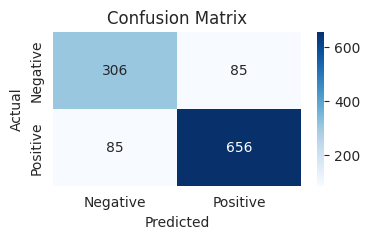


ROC AUC:  0.8339494220501086
Model DT trained.

Training classifier RF:
RandomForestClassifier(max_depth=50, n_estimators=250)
Time to train and test classifier: 4.67 seconds

Accuracy with validation data: 89.84%

Classification report:

              precision    recall  f1-score   support

         0.0       0.88      0.82      0.85       391
         2.0       0.91      0.94      0.92       741

    accuracy                           0.90      1132
   macro avg       0.89      0.88      0.89      1132
weighted avg       0.90      0.90      0.90      1132



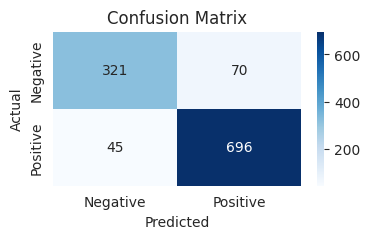


ROC AUC:  0.8801215610342007
Model RF trained.

Training classifier SVM:
SVC(C=1, degree=2, kernel='poly')
Time to train and test classifier: 2.50 seconds

Accuracy with validation data: 88.78%

Classification report:

              precision    recall  f1-score   support

         0.0       0.85      0.82      0.83       391
         2.0       0.91      0.92      0.92       741

    accuracy                           0.89      1132
   macro avg       0.88      0.87      0.87      1132
weighted avg       0.89      0.89      0.89      1132



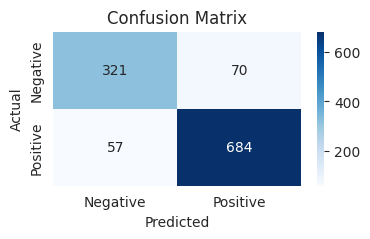


ROC AUC:  0.8720243950422979
Model SVM trained.

Training classifier KNN:
KNeighborsClassifier(n_neighbors=10)
Time to train and test classifier: 1.24 seconds

Accuracy with validation data: 81.10%

Classification report:

              precision    recall  f1-score   support

         0.0       0.72      0.75      0.73       391
         2.0       0.87      0.84      0.85       741

    accuracy                           0.81      1132
   macro avg       0.79      0.80      0.79      1132
weighted avg       0.81      0.81      0.81      1132



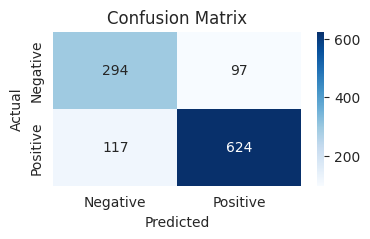


ROC AUC:  0.7970117108628348
Model KNN trained.

Training classifier LRM:
LogisticRegression(C=10, solver='saga')
Time to train and test classifier: 0.08 seconds

Accuracy with validation data: 91.96%

Classification report:

              precision    recall  f1-score   support

         0.0       0.88      0.89      0.88       391
         2.0       0.94      0.94      0.94       741

    accuracy                           0.92      1132
   macro avg       0.91      0.91      0.91      1132
weighted avg       0.92      0.92      0.92      1132



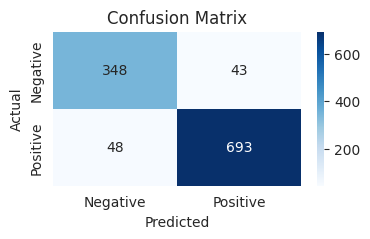


ROC AUC:  0.9126241237561739
Model LRM trained.

Training classifier MNB:
MultinomialNB()
Time to train and test classifier: 0.01 seconds

Accuracy with validation data: 83.39%

Classification report:

              precision    recall  f1-score   support

         0.0       0.87      0.61      0.72       391
         2.0       0.82      0.95      0.88       741

    accuracy                           0.83      1132
   macro avg       0.85      0.78      0.80      1132
weighted avg       0.84      0.83      0.83      1132



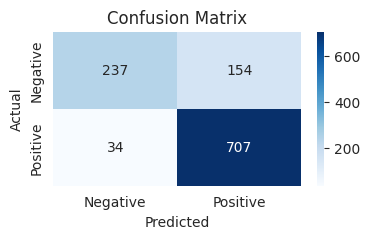


ROC AUC:  0.7801270833980485
Model MNB trained.


In [ ]:
result = []
accuracy9 = []
precision9 = []
recall9 = []
f1score9 = []
auc9 = []
Afinn3_trained_models = {}
for m in [m for m in models]:
    model = models[m]
    print("\nTraining classifier %s:\n%s" %(m, model))
    st = time.time()
    model.fit(tf_x_train, Y_train)
    predicted = model.predict(tf_x_test)
    t = time.time() - st
    print("Time to train and test classifier: %4.2f seconds" %(t))
    acc = evaluateModel(Y_test, predicted)
    auc = roc_auc_score(Y_test, predicted)
    print("\nROC AUC: ", auc)
    precision = precision_score(Y_test, predicted, average='weighted')
    recall = recall_score(Y_test, predicted, average='weighted')
    f1 = f1_score(Y_test, predicted, average='weighted')
    result.append([m, acc, t])
    accuracy9.append(acc)
    precision9.append(precision)
    recall9.append(recall)
    f1score9.append(f1)
    auc9.append(auc)
    Afinn3_trained_models[m] = model
    print(f"Model {m} trained.")
    print(60*'=')

In [ ]:
pd.DataFrame(result, columns=["Model", "Accuracy", "Time"])

,Model,Accuracy,Time
0,DT,0.849823,0.323238
1,RF,0.898410,4.671683
2,SVM,0.887809,2.504367
3,KNN,0.810954,1.235662
4,LRM,0.919611,0.075083
5,MNB,0.833922,0.005196


# Improvement

In [ ]:
from collections import Counter
from imblearn.over_sampling import RandomOverSampler

X = df_textblob['Lemmatized_Comment']
y = df_textblob['Target']
X = X.values.reshape(-1, 1)

print("Original class distribution:", Counter(y))

oversample = RandomOverSampler(sampling_strategy='minority', random_state=42)

X_over, y_over = oversample.fit_resample(X, y)

print("Class distribution after oversampling:", Counter(y_over))

Original class distribution: Counter({2.0: 3466, 0.0: 2190})
Class distribution after oversampling: Counter({2.0: 3466, 0.0: 3466})


In [ ]:
df_upsampled = pd.DataFrame(X_over, columns=['Lemmatized_Stemmed_Comment'])
df_upsampled['Target'] = y_over

print(df_upsampled.shape)
print(df_upsampled.head())

(6932, 2)
                          Lemmatized_Stemmed_Comment  Target
0  [not, thick, not, think, not, tried, yet, thin...     2.0
1  [fabric, beautiful, rare, quality, beautiful, ...     2.0
2  [item, received, good, condition, delivery, fa...     2.0
3  [thank, fast, delivery, close, express, thing,...     2.0
4  [sorry, picture, nothing, folded, hand, item, ...     2.0


In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train, Y_test = train_test_split(df_upsampled['Lemmatized_Stemmed_Comment'], df_upsampled['Target'], test_size=0.2, stratify=df_upsampled['Target'], random_state=30)
print("Training set contains %d examples" %len(X_train))
print("Test set contains %d examples" %len(X_test))

Training set contains 5545 examples
Test set contains 1387 examples


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer= TfidfVectorizer()

X_train = [' '.join(doc) for doc in X_train]
X_test = [' '.join(doc) for doc in X_test]

tf_x_train = vectorizer.fit_transform(X_train)
tf_x_test = vectorizer.transform(X_test)


Training classifier DT:
DecisionTreeClassifier()
Time to train and test classifier: 0.49 seconds

Accuracy with validation data: 89.69%

Classification report:

              precision    recall  f1-score   support

         0.0       0.88      0.91      0.90       693
         2.0       0.91      0.88      0.90       694

    accuracy                           0.90      1387
   macro avg       0.90      0.90      0.90      1387
weighted avg       0.90      0.90      0.90      1387



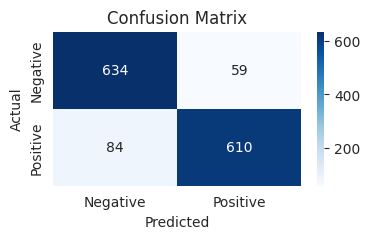

Model DT trained.

Training classifier RF:
RandomForestClassifier(max_depth=50, n_estimators=250)
Time to train and test classifier: 6.27 seconds

Accuracy with validation data: 91.49%

Classification report:

              precision    recall  f1-score   support

         0.0       0.89      0.95      0.92       693
         2.0       0.95      0.88      0.91       694

    accuracy                           0.91      1387
   macro avg       0.92      0.91      0.91      1387
weighted avg       0.92      0.91      0.91      1387



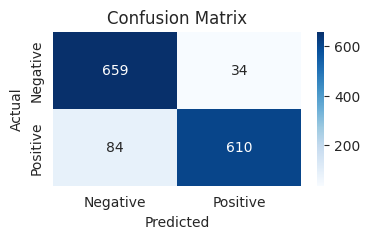

Model RF trained.

Training classifier SVM:
SVC(C=1, degree=2, kernel='poly')
Time to train and test classifier: 3.34 seconds

Accuracy with validation data: 90.99%

Classification report:

              precision    recall  f1-score   support

         0.0       0.89      0.93      0.91       693
         2.0       0.93      0.89      0.91       694

    accuracy                           0.91      1387
   macro avg       0.91      0.91      0.91      1387
weighted avg       0.91      0.91      0.91      1387



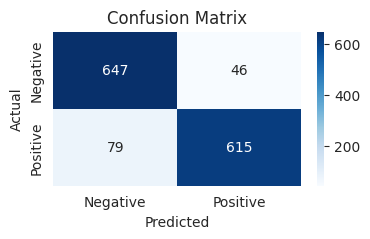

Model SVM trained.

Training classifier KNN:
KNeighborsClassifier(n_neighbors=10)
Time to train and test classifier: 1.81 seconds

Accuracy with validation data: 83.92%

Classification report:

              precision    recall  f1-score   support

         0.0       0.82      0.87      0.84       693
         2.0       0.87      0.80      0.83       694

    accuracy                           0.84      1387
   macro avg       0.84      0.84      0.84      1387
weighted avg       0.84      0.84      0.84      1387



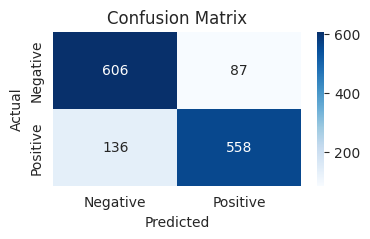

Model KNN trained.

Training classifier LRM:
LogisticRegression(C=10, solver='saga')
Time to train and test classifier: 0.11 seconds

Accuracy with validation data: 91.20%

Classification report:

              precision    recall  f1-score   support

         0.0       0.90      0.93      0.91       693
         2.0       0.93      0.89      0.91       694

    accuracy                           0.91      1387
   macro avg       0.91      0.91      0.91      1387
weighted avg       0.91      0.91      0.91      1387



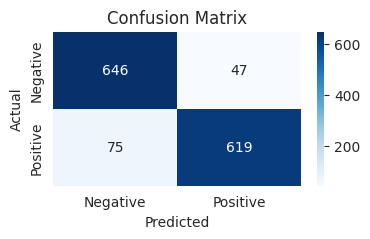

Model LRM trained.

Training classifier MNB:
MultinomialNB()
Time to train and test classifier: 0.01 seconds

Accuracy with validation data: 87.53%

Classification report:

              precision    recall  f1-score   support

         0.0       0.87      0.88      0.88       693
         2.0       0.88      0.87      0.87       694

    accuracy                           0.88      1387
   macro avg       0.88      0.88      0.88      1387
weighted avg       0.88      0.88      0.88      1387



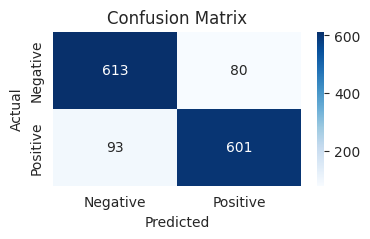

Model MNB trained.


In [ ]:
result = []
improved_trained_models = {}
for m in [m for m in models]:
    model = models[m]
    print("\nTraining classifier %s:\n%s" %(m, model))
    st = time.time()
    model.fit(tf_x_train, Y_train)
    predicted = model.predict(tf_x_test)
    t = time.time() - st
    print("Time to train and test classifier: %4.2f seconds" %(t))
    acc = evaluateModel(Y_test, predicted)
    result.append([m, acc, t])
    improved_trained_models[m] = model
    print(f"Model {m} trained.")
    print(60*'=')

In [ ]:
pd.DataFrame(result, columns=["Model", "Accuracy", "Time"])

,Model,Accuracy,Time
0,DT,0.896900,0.490948
1,RF,0.914924,6.273162
2,SVM,0.909877,3.336383
3,KNN,0.839221,1.806085
4,LRM,0.912040,0.113144
5,MNB,0.875270,0.009834


# Evaluation

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
model_names = ['Decision Tree', 'Random Forest', 'SVM', 'KNN', 'Logistic Regeression', 'Multinomial NB']
dataset_names = ['TextBlob Set1', 'TextBlob Set2', 'TextBlob Set3', 'Vader Set1', 'Vader Set2', 'Vader Set3', 'Afinn Set1', 'Afinn Set2', 'Afinn Set3']
colors = ['red', 'orange', 'yellow', 'lightgreen', 'green', 'cyan', 'blue', 'purple', 'grey']

## Accuracy

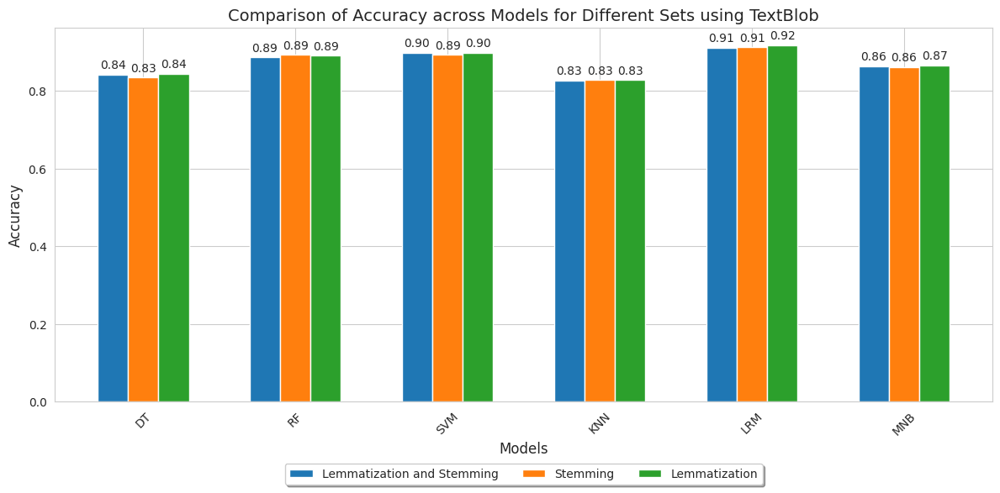

In [ ]:
tb_accuracy = pd.DataFrame({
    'Model': [m for m in models],
    'Set 1': accuracy1,
    'Set 2': accuracy2,
    'Set 3': accuracy3,
})

bar_width = 0.2
index = np.arange(len(models))

plt.figure(figsize=(12, 6))
bar1 = plt.bar(index, tb_accuracy['Set 1'], bar_width, label='Lemmatization and Stemming')
bar2 = plt.bar(index + bar_width, tb_accuracy['Set 2'], bar_width, label='Stemming')
bar3 = plt.bar(index + 2 * bar_width, tb_accuracy['Set 3'], bar_width, label='Lemmatization')

plt.xlabel('Models', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.title('Comparison of Accuracy across Models for Different Sets using TextBlob', fontsize=14)
plt.xticks(index + bar_width, tb_accuracy['Model'], rotation=45)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), shadow=True, ncol=3, fontsize='medium')

for bars in [bar1, bar2, bar3]:
    for bar in bars:
        height = bar.get_height()
        plt.annotate(f'{height:.2f}',
                     xy=(bar.get_x() + bar.get_width() / 2, height),
                     xytext=(0, 3),
                     textcoords="offset points",
                     ha='center', va='bottom')

plt.tight_layout()
plt.show()

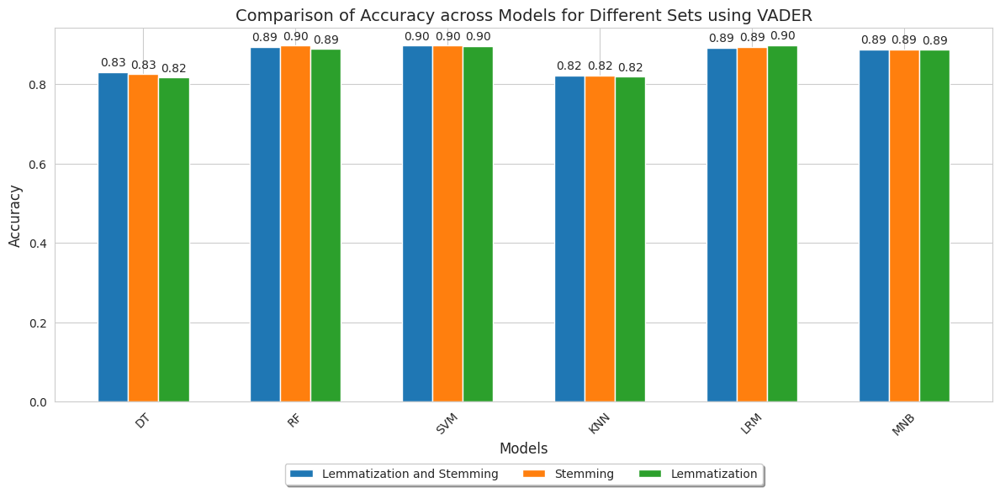

In [ ]:
vd_accuracy = pd.DataFrame({
    'Model': [m for m in models],
    'Set 1': accuracy4,
    'Set 2': accuracy5,
    'Set 3': accuracy6,
})

bar_width = 0.2
index = np.arange(len(models))

plt.figure(figsize=(12, 6))
bar1 = plt.bar(index, vd_accuracy['Set 1'], bar_width, label='Lemmatization and Stemming')
bar2 = plt.bar(index + bar_width, vd_accuracy['Set 2'], bar_width, label='Stemming')
bar3 = plt.bar(index + 2 * bar_width, vd_accuracy['Set 3'], bar_width, label='Lemmatization')

plt.xlabel('Models', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.title('Comparison of Accuracy across Models for Different Sets using VADER', fontsize=14)
plt.xticks(index + bar_width, vd_accuracy['Model'], rotation=45)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), shadow=True, ncol=3, fontsize='medium')

for bars in [bar1, bar2, bar3]:
    for bar in bars:
        height = bar.get_height()
        plt.annotate(f'{height:.2f}',
                     xy=(bar.get_x() + bar.get_width() / 2, height),
                     xytext=(0, 3),
                     textcoords="offset points",
                     ha='center', va='bottom')

plt.tight_layout()
plt.show()

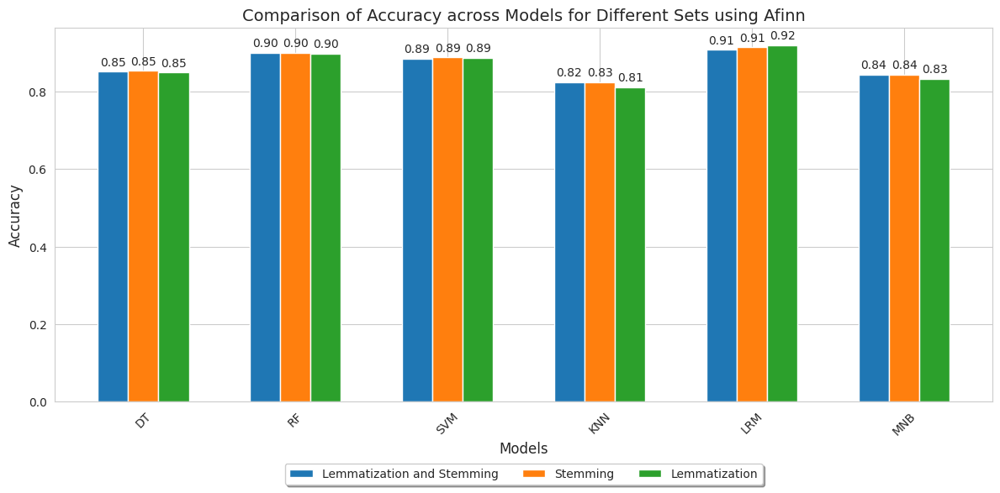

In [ ]:
af_accuracy = pd.DataFrame({
    'Model': [m for m in models],
    'Set 1': accuracy7,
    'Set 2': accuracy8,
    'Set 3': accuracy9,
})

bar_width = 0.2
index = np.arange(len(models))

plt.figure(figsize=(12, 6))
bar1 = plt.bar(index, af_accuracy['Set 1'], bar_width, label='Lemmatization and Stemming')
bar2 = plt.bar(index + bar_width, af_accuracy['Set 2'], bar_width, label='Stemming')
bar3 = plt.bar(index + 2 * bar_width, af_accuracy['Set 3'], bar_width, label='Lemmatization')

plt.xlabel('Models', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.title('Comparison of Accuracy across Models for Different Sets using Afinn', fontsize=14)
plt.xticks(index + bar_width, tb_accuracy['Model'], rotation=45)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), shadow=True, ncol=3, fontsize='medium')

for bars in [bar1, bar2, bar3]:
    for bar in bars:
        height = bar.get_height()
        plt.annotate(f'{height:.2f}',
                     xy=(bar.get_x() + bar.get_width() / 2, height),
                     xytext=(0, 3),
                     textcoords="offset points",
                     ha='center', va='bottom')

plt.tight_layout()
plt.show()

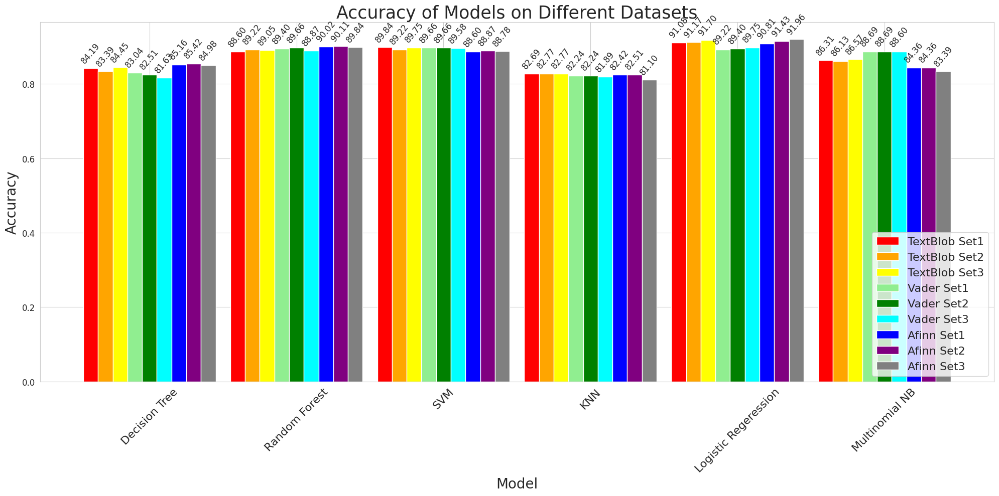

In [ ]:
dataset_scores = []
accuracy_scores = [accuracy1, accuracy2, accuracy3, accuracy4, accuracy5, accuracy6, accuracy7, accuracy8, accuracy9]

for i, scores in enumerate(accuracy_scores):
    dataset_scores.append(pd.DataFrame({
        'Model': model_names,
        f'Accuracy {dataset_names[i]}': scores
    }))

comparison_df = pd.concat([df.set_index('Model') for df in dataset_scores], axis=1)

fig, ax = plt.subplots(figsize=(20, 10))
bar_width = 0.9
index = np.arange(len(comparison_df))

bars = []
for i, dataset in enumerate(dataset_names):
    bars.append(ax.bar(index + i*bar_width/len(dataset_names), comparison_df[f'Accuracy {dataset}'], bar_width/len(dataset_names), label=dataset, color=colors[i]))

plt.xlabel('Model', fontsize=20)
plt.ylabel('Accuracy', fontsize=20)
plt.title('Accuracy of Models on Different Datasets', fontsize=25)
plt.xticks(index + bar_width*(len(dataset_names)-1)/(2*len(dataset_names)), comparison_df.index, rotation=45, fontsize=16)
plt.yticks(fontsize=12)
plt.legend(loc='lower right', fontsize=16)

for bar_group in bars:
    for bar in bar_group:
        height = bar.get_height()
        ax.annotate(f"{height*100:.2f}", (bar.get_x() + bar.get_width() / 2, height), ha='center', va='bottom', xytext=(0, 5), rotation=50, textcoords='offset points', fontsize=12)


plt.tight_layout()
plt.show()

## Precision

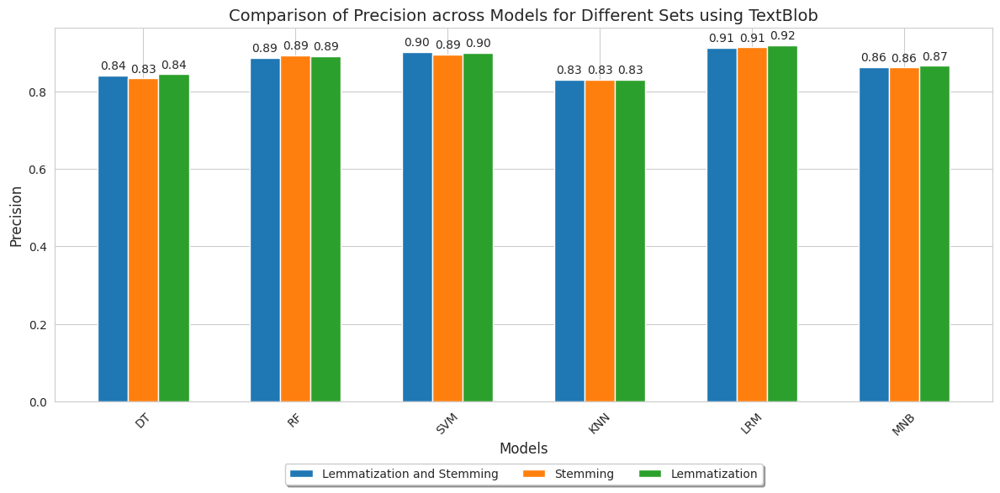

In [ ]:
tb_precision = pd.DataFrame({
    'Model': [m for m in models],
    'Set 1': precision1,
    'Set 2': precision2,
    'Set 3': precision3,
})

bar_width = 0.2
index = np.arange(len(models))

plt.figure(figsize=(12, 6))
bar1 = plt.bar(index, tb_precision['Set 1'], bar_width, label='Lemmatization and Stemming')
bar2 = plt.bar(index + bar_width, tb_precision['Set 2'], bar_width, label='Stemming')
bar3 = plt.bar(index + 2 * bar_width, tb_precision['Set 3'], bar_width, label='Lemmatization')

plt.xlabel('Models', fontsize=12)
plt.ylabel('Precision', fontsize=12)
plt.title('Comparison of Precision across Models for Different Sets using TextBlob', fontsize=14)
plt.xticks(index + bar_width, tb_precision['Model'], rotation=45)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), shadow=True, ncol=3, fontsize='medium')

for bars in [bar1, bar2, bar3]:
    for bar in bars:
        height = bar.get_height()
        plt.annotate(f'{height:.2f}',
                     xy=(bar.get_x() + bar.get_width() / 2, height),
                     xytext=(0, 3),
                     textcoords="offset points",
                     ha='center', va='bottom')

plt.tight_layout()
plt.show()

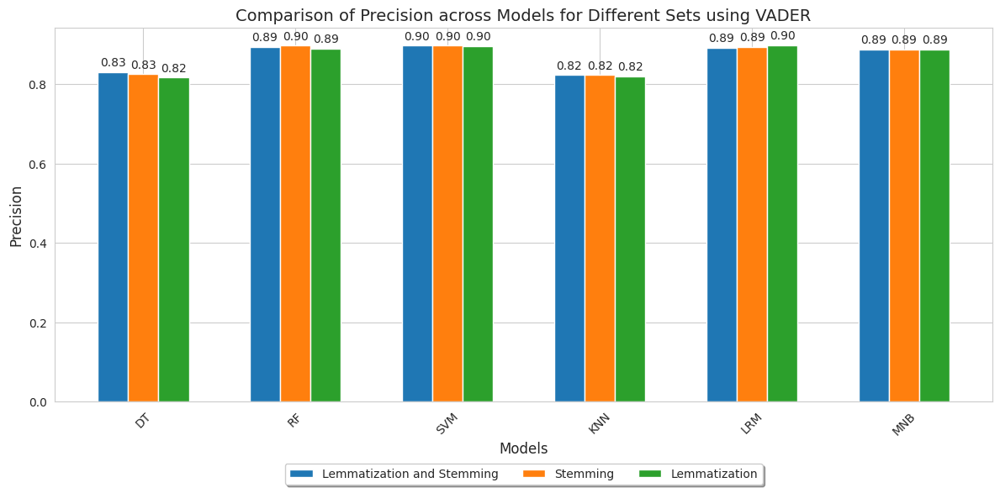

In [ ]:
vd_precision = pd.DataFrame({
    'Model': [m for m in models],
    'Set 1': precision4,
    'Set 2': precision5,
    'Set 3': precision6,
})

bar_width = 0.2
index = np.arange(len(models))

plt.figure(figsize=(12, 6))
bar1 = plt.bar(index, vd_precision['Set 1'], bar_width, label='Lemmatization and Stemming')
bar2 = plt.bar(index + bar_width, vd_precision['Set 2'], bar_width, label='Stemming')
bar3 = plt.bar(index + 2 * bar_width, vd_precision['Set 3'], bar_width, label='Lemmatization')

plt.xlabel('Models', fontsize=12)
plt.ylabel('Precision', fontsize=12)
plt.title('Comparison of Precision across Models for Different Sets using VADER', fontsize=14)
plt.xticks(index + bar_width, vd_precision['Model'], rotation=45)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), shadow=True, ncol=3, fontsize='medium')

for bars in [bar1, bar2, bar3]:
    for bar in bars:
        height = bar.get_height()
        plt.annotate(f'{height:.2f}',
                     xy=(bar.get_x() + bar.get_width() / 2, height),
                     xytext=(0, 3),
                     textcoords="offset points",
                     ha='center', va='bottom')

plt.tight_layout()
plt.show()

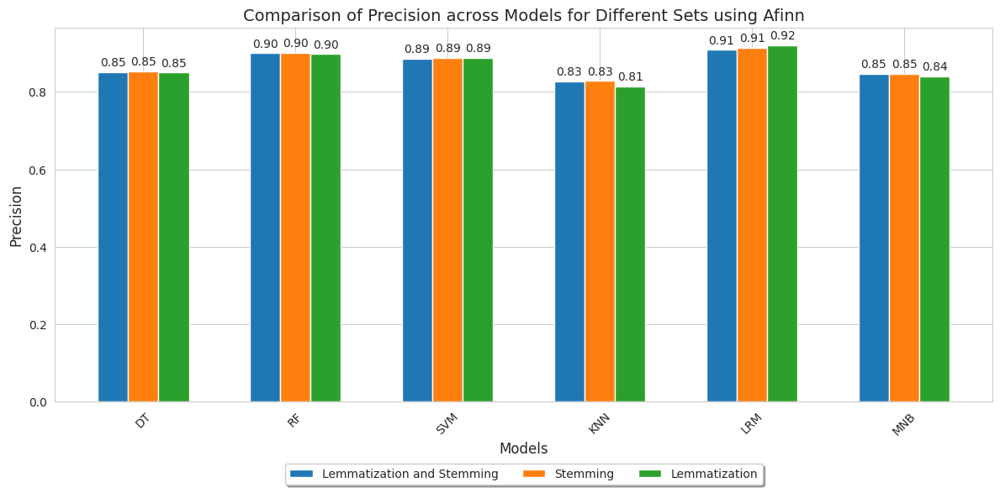

In [ ]:
af_precision = pd.DataFrame({
    'Model': [m for m in models],
    'Set 1': precision7,
    'Set 2': precision8,
    'Set 3': precision9,
})

bar_width = 0.2
index = np.arange(len(models))

plt.figure(figsize=(12, 6))
bar1 = plt.bar(index, af_precision['Set 1'], bar_width, label='Lemmatization and Stemming')
bar2 = plt.bar(index + bar_width, af_precision['Set 2'], bar_width, label='Stemming')
bar3 = plt.bar(index + 2 * bar_width, af_precision['Set 3'], bar_width, label='Lemmatization')

plt.xlabel('Models', fontsize=12)
plt.ylabel('Precision', fontsize=12)
plt.title('Comparison of Precision across Models for Different Sets using Afinn', fontsize=14)
plt.xticks(index + bar_width, af_precision['Model'], rotation=45)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), shadow=True, ncol=3, fontsize='medium')

for bars in [bar1, bar2, bar3]:
    for bar in bars:
        height = bar.get_height()
        plt.annotate(f'{height:.2f}',
                     xy=(bar.get_x() + bar.get_width() / 2, height),
                     xytext=(0, 3),
                     textcoords="offset points",
                     ha='center', va='bottom')

plt.tight_layout()
plt.show()

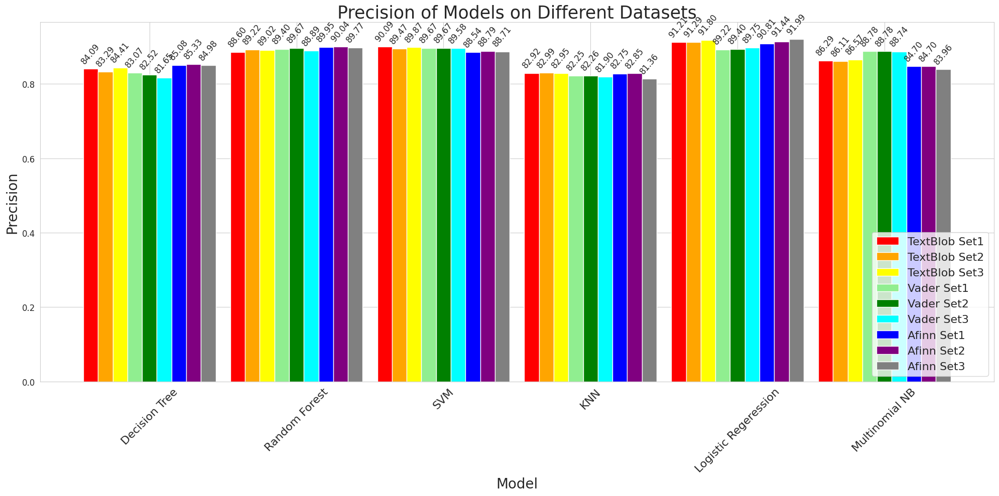

In [ ]:
dataset_scores = []
dataset_names = ['TextBlob Set1', 'TextBlob Set2', 'TextBlob Set3', 'Vader Set1', 'Vader Set2', 'Vader Set3', 'Afinn Set1', 'Afinn Set2', 'Afinn Set3']
precision_scores = [precision1, precision2, precision3, precision4, precision5, precision6, precision7, precision8, precision9]
colors = ['red', 'orange', 'yellow', 'lightgreen', 'green', 'cyan', 'blue', 'purple', 'grey']

for i, scores in enumerate(precision_scores):
    dataset_scores.append(pd.DataFrame({
        'Model': model_names,
        f'Precision {dataset_names[i]}': scores
    }))

comparison_df = pd.concat([df.set_index('Model') for df in dataset_scores], axis=1)

fig, ax = plt.subplots(figsize=(20, 10))
bar_width = 0.9
index = np.arange(len(comparison_df))

bars = []
for i, dataset in enumerate(dataset_names):
    bars.append(ax.bar(index + i*bar_width/len(dataset_names), comparison_df[f'Precision {dataset}'], bar_width/len(dataset_names), label=dataset, color=colors[i]))

plt.xlabel('Model', fontsize=20)
plt.ylabel('Precision', fontsize=20)
plt.title('Precision of Models on Different Datasets', fontsize=25)
plt.xticks(index + bar_width*(len(dataset_names)-1)/(2*len(dataset_names)), comparison_df.index, rotation=45, fontsize=16)
plt.yticks(fontsize=12)
plt.legend(loc='lower right', fontsize=16)

for bar_group in bars:
    for bar in bar_group:
        height = bar.get_height()
        ax.annotate(f"{height*100:.2f}", (bar.get_x() + bar.get_width() / 2, height), ha='center', va='bottom', xytext=(0, 5), rotation=50, textcoords='offset points', fontsize=12)


plt.tight_layout()
plt.show()

## Recall

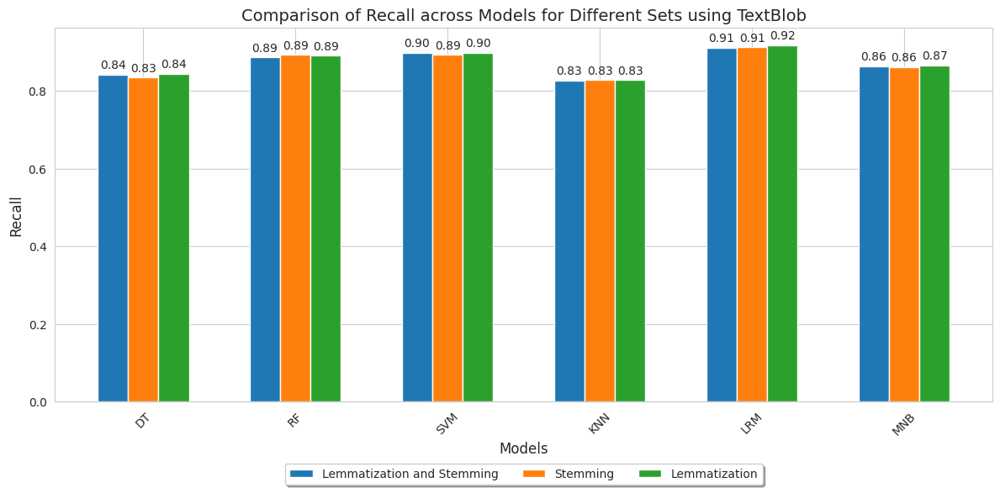

In [ ]:
tb_recall = pd.DataFrame({
    'Model': [m for m in models],
    'Set 1': recall1,
    'Set 2': recall2,
    'Set 3': recall3,
})

bar_width = 0.2
index = np.arange(len(models))

plt.figure(figsize=(12, 6))
bar1 = plt.bar(index, tb_recall['Set 1'], bar_width, label='Lemmatization and Stemming')
bar2 = plt.bar(index + bar_width, tb_recall['Set 2'], bar_width, label='Stemming')
bar3 = plt.bar(index + 2 * bar_width, tb_recall['Set 3'], bar_width, label='Lemmatization')

plt.xlabel('Models', fontsize=12)
plt.ylabel('Recall', fontsize=12)
plt.title('Comparison of Recall across Models for Different Sets using TextBlob', fontsize=14)
plt.xticks(index + bar_width, tb_recall['Model'], rotation=45)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), shadow=True, ncol=3, fontsize='medium')

for bars in [bar1, bar2, bar3]:
    for bar in bars:
        height = bar.get_height()
        plt.annotate(f'{height:.2f}',
                     xy=(bar.get_x() + bar.get_width() / 2, height),
                     xytext=(0, 3),
                     textcoords="offset points",
                     ha='center', va='bottom')

plt.tight_layout()
plt.show()

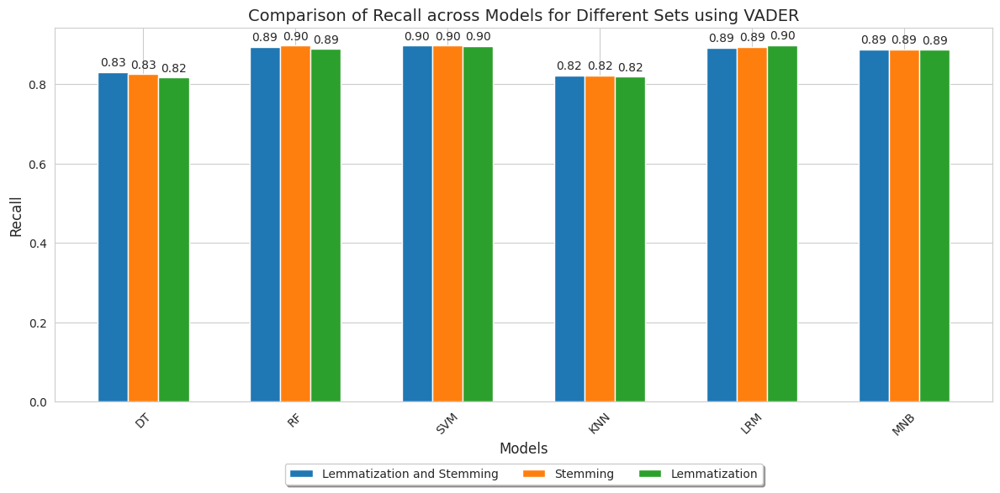

In [ ]:
vd_recall = pd.DataFrame({
    'Model': [m for m in models],
    'Set 1': recall4,
    'Set 2': recall5,
    'Set 3': recall6,
})

bar_width = 0.2
index = np.arange(len(models))

plt.figure(figsize=(12, 6))
bar1 = plt.bar(index, vd_recall['Set 1'], bar_width, label='Lemmatization and Stemming')
bar2 = plt.bar(index + bar_width, vd_recall['Set 2'], bar_width, label='Stemming')
bar3 = plt.bar(index + 2 * bar_width, vd_recall['Set 3'], bar_width, label='Lemmatization')

plt.xlabel('Models', fontsize=12)
plt.ylabel('Recall', fontsize=12)
plt.title('Comparison of Recall across Models for Different Sets using VADER', fontsize=14)
plt.xticks(index + bar_width, vd_recall['Model'], rotation=45)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), shadow=True, ncol=3, fontsize='medium')

for bars in [bar1, bar2, bar3]:
    for bar in bars:
        height = bar.get_height()
        plt.annotate(f'{height:.2f}',
                     xy=(bar.get_x() + bar.get_width() / 2, height),
                     xytext=(0, 3),
                     textcoords="offset points",
                     ha='center', va='bottom')

plt.tight_layout()
plt.show()

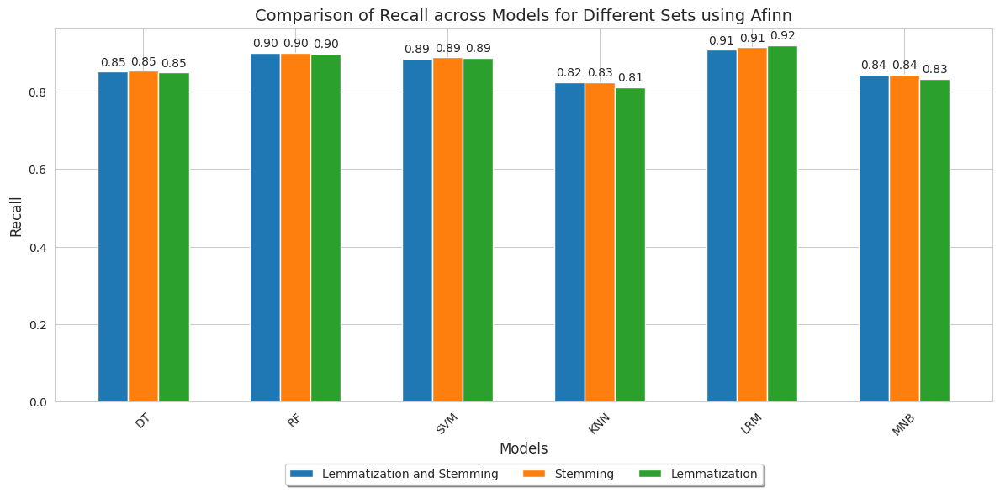

In [ ]:
af_recall = pd.DataFrame({
    'Model': [m for m in models],
    'Set 1': recall7,
    'Set 2': recall8,
    'Set 3': recall9,
})

bar_width = 0.2
index = np.arange(len(models))

plt.figure(figsize=(12, 6))
bar1 = plt.bar(index, af_recall['Set 1'], bar_width, label='Lemmatization and Stemming')
bar2 = plt.bar(index + bar_width, af_recall['Set 2'], bar_width, label='Stemming')
bar3 = plt.bar(index + 2 * bar_width, af_recall['Set 3'], bar_width, label='Lemmatization')

plt.xlabel('Models', fontsize=12)
plt.ylabel('Recall', fontsize=12)
plt.title('Comparison of Recall across Models for Different Sets using Afinn', fontsize=14)
plt.xticks(index + bar_width, af_recall['Model'], rotation=45)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), shadow=True, ncol=3, fontsize='medium')

for bars in [bar1, bar2, bar3]:
    for bar in bars:
        height = bar.get_height()
        plt.annotate(f'{height:.2f}',
                     xy=(bar.get_x() + bar.get_width() / 2, height),
                     xytext=(0, 3),
                     textcoords="offset points",
                     ha='center', va='bottom')

plt.tight_layout()
plt.show()

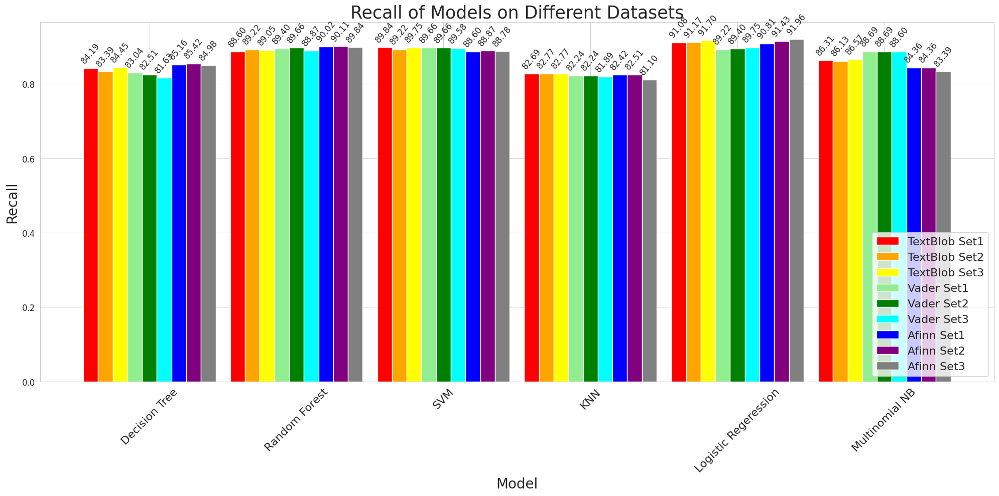

In [ ]:
dataset_scores = []
recall_scores = [recall1, recall2, recall3, recall4, recall5, recall6, recall7, recall8, recall9]

for i, scores in enumerate(recall_scores):
    dataset_scores.append(pd.DataFrame({
        'Model': model_names,
        f'Recall {dataset_names[i]}': scores
    }))

comparison_df = pd.concat([df.set_index('Model') for df in dataset_scores], axis=1)

fig, ax = plt.subplots(figsize=(20, 10))
bar_width = 0.9
index = np.arange(len(comparison_df))

bars = []
for i, dataset in enumerate(dataset_names):
    bars.append(ax.bar(index + i*bar_width/len(dataset_names), comparison_df[f'Recall {dataset}'], bar_width/len(dataset_names), label=dataset, color=colors[i]))

plt.xlabel('Model', fontsize=20)
plt.ylabel('Recall', fontsize=20)
plt.title('Recall of Models on Different Datasets', fontsize=25)
plt.xticks(index + bar_width*(len(dataset_names)-1)/(2*len(dataset_names)), comparison_df.index, rotation=45, fontsize=16)
plt.yticks(fontsize=12)
plt.legend(loc='lower right', fontsize=16)

for bar_group in bars:
    for bar in bar_group:
        height = bar.get_height()
        ax.annotate(f"{height*100:.2f}", (bar.get_x() + bar.get_width() / 2, height), ha='center', va='bottom', xytext=(0, 5), rotation=50, textcoords='offset points', fontsize=12)


plt.tight_layout()
plt.show()

## F1-Score

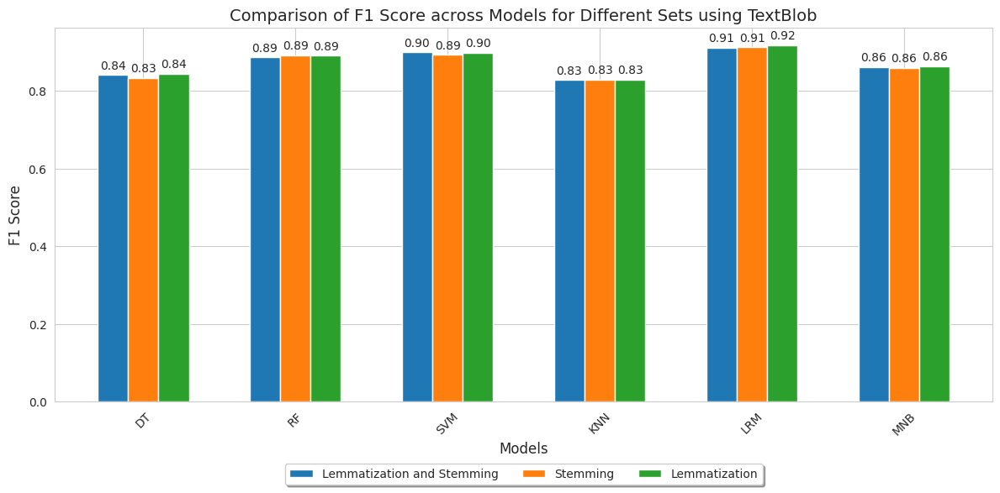

In [ ]:
tb_f1score = pd.DataFrame({
    'Model': [m for m in models],
    'Set 1': f1score1,
    'Set 2': f1score2,
    'Set 3': f1score3,
})

bar_width = 0.2
index = np.arange(len(models))

plt.figure(figsize=(12, 6))
bar1 = plt.bar(index, tb_f1score['Set 1'], bar_width, label='Lemmatization and Stemming')
bar2 = plt.bar(index + bar_width, tb_f1score['Set 2'], bar_width, label='Stemming')
bar3 = plt.bar(index + 2 * bar_width, tb_f1score['Set 3'], bar_width, label='Lemmatization')

plt.xlabel('Models', fontsize=12)
plt.ylabel('F1 Score', fontsize=12)
plt.title('Comparison of F1 Score across Models for Different Sets using TextBlob', fontsize=14)
plt.xticks(index + bar_width, tb_f1score['Model'], rotation=45)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), shadow=True, ncol=3, fontsize='medium')

for bars in [bar1, bar2, bar3]:
    for bar in bars:
        height = bar.get_height()
        plt.annotate(f'{height:.2f}',
                     xy=(bar.get_x() + bar.get_width() / 2, height),
                     xytext=(0, 3),
                     textcoords="offset points",
                     ha='center', va='bottom')

plt.tight_layout()
plt.show()

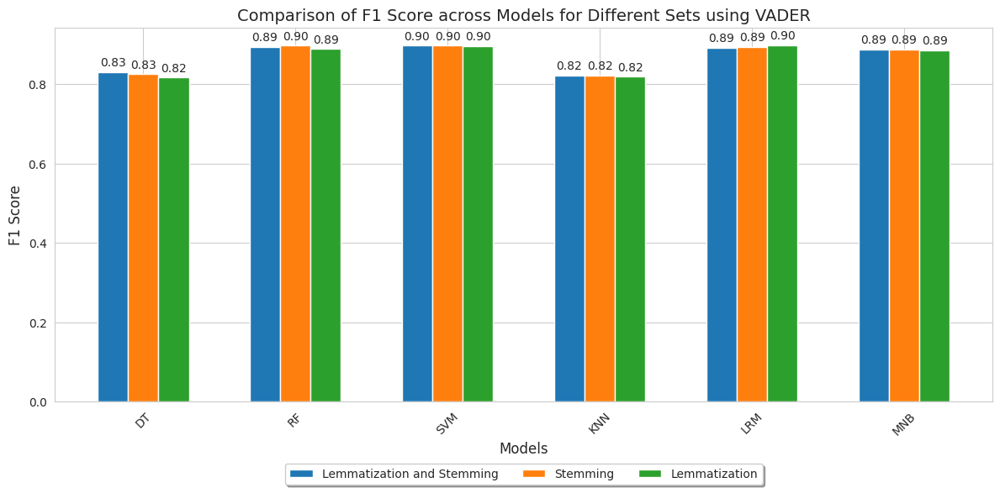

In [ ]:
vd_f1score = pd.DataFrame({
    'Model': [m for m in models],
    'Set 1': f1score4,
    'Set 2': f1score5,
    'Set 3': f1score6,
})

bar_width = 0.2
index = np.arange(len(models))

plt.figure(figsize=(12, 6))
bar1 = plt.bar(index, vd_f1score['Set 1'], bar_width, label='Lemmatization and Stemming')
bar2 = plt.bar(index + bar_width, vd_f1score['Set 2'], bar_width, label='Stemming')
bar3 = plt.bar(index + 2 * bar_width, vd_f1score['Set 3'], bar_width, label='Lemmatization')

plt.xlabel('Models', fontsize=12)
plt.ylabel('F1 Score', fontsize=12)
plt.title('Comparison of F1 Score across Models for Different Sets using VADER', fontsize=14)
plt.xticks(index + bar_width, vd_f1score['Model'], rotation=45)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), shadow=True, ncol=3, fontsize='medium')

for bars in [bar1, bar2, bar3]:
    for bar in bars:
        height = bar.get_height()
        plt.annotate(f'{height:.2f}',
                     xy=(bar.get_x() + bar.get_width() / 2, height),
                     xytext=(0, 3),
                     textcoords="offset points",
                     ha='center', va='bottom')

plt.tight_layout()
plt.show()

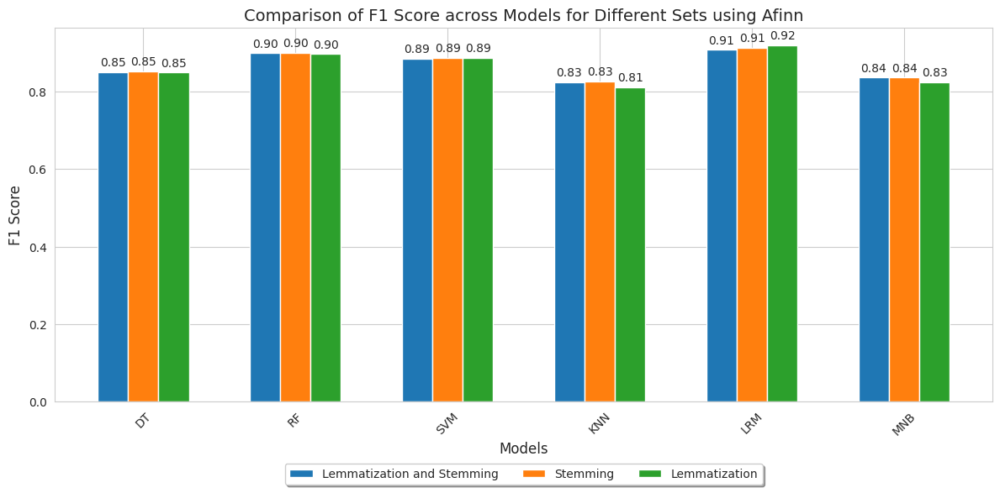

In [ ]:
af_f1score = pd.DataFrame({
    'Model': [m for m in models],
    'Set 1': f1score7,
    'Set 2': f1score8,
    'Set 3': f1score9,
})

bar_width = 0.2
index = np.arange(len(models))

plt.figure(figsize=(12, 6))
bar1 = plt.bar(index, af_f1score['Set 1'], bar_width, label='Lemmatization and Stemming')
bar2 = plt.bar(index + bar_width, af_f1score['Set 2'], bar_width, label='Stemming')
bar3 = plt.bar(index + 2 * bar_width, af_f1score['Set 3'], bar_width, label='Lemmatization')

plt.xlabel('Models', fontsize=12)
plt.ylabel('F1 Score', fontsize=12)
plt.title('Comparison of F1 Score across Models for Different Sets using Afinn', fontsize=14)
plt.xticks(index + bar_width, af_f1score['Model'], rotation=45)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), shadow=True, ncol=3, fontsize='medium')

for bars in [bar1, bar2, bar3]:
    for bar in bars:
        height = bar.get_height()
        plt.annotate(f'{height:.2f}',
                     xy=(bar.get_x() + bar.get_width() / 2, height),
                     xytext=(0, 3),
                     textcoords="offset points",
                     ha='center', va='bottom')

plt.tight_layout()
plt.show()

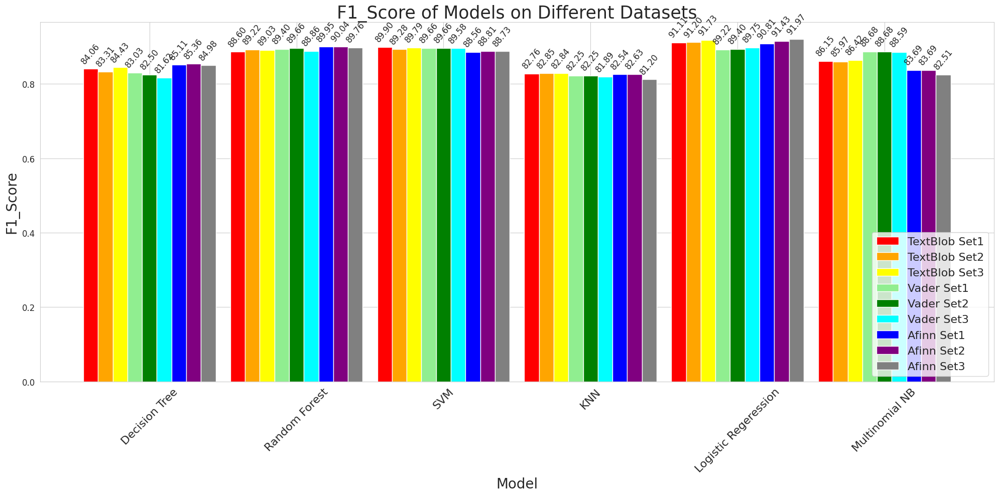

In [ ]:
dataset_scores = []
f1_scores = [f1score1, f1score2, f1score3, f1score4, f1score5, f1score6, f1score7, f1score8, f1score9]

for i, scores in enumerate(f1_scores):
    dataset_scores.append(pd.DataFrame({
        'Model': model_names,
        f'F1_Score {dataset_names[i]}': scores
    }))

comparison_df = pd.concat([df.set_index('Model') for df in dataset_scores], axis=1)

fig, ax = plt.subplots(figsize=(20, 10))
bar_width = 0.9
index = np.arange(len(comparison_df))

bars = []
for i, dataset in enumerate(dataset_names):
    bars.append(ax.bar(index + i*bar_width/len(dataset_names), comparison_df[f'F1_Score {dataset}'], bar_width/len(dataset_names), label=dataset, color=colors[i]))

plt.xlabel('Model', fontsize=20)
plt.ylabel('F1_Score', fontsize=20)
plt.title('F1_Score of Models on Different Datasets', fontsize=25)
plt.xticks(index + bar_width*(len(dataset_names)-1)/(2*len(dataset_names)), comparison_df.index, rotation=45, fontsize=16)
plt.yticks(fontsize=12)
plt.legend(loc='lower right', fontsize=16)

for bar_group in bars:
    for bar in bar_group:
        height = bar.get_height()
        ax.annotate(f"{height*100:.2f}", (bar.get_x() + bar.get_width() / 2, height), ha='center', va='bottom', xytext=(0, 5), rotation=50, textcoords='offset points', fontsize=12)


plt.tight_layout()
plt.show()

## Area Under Curve

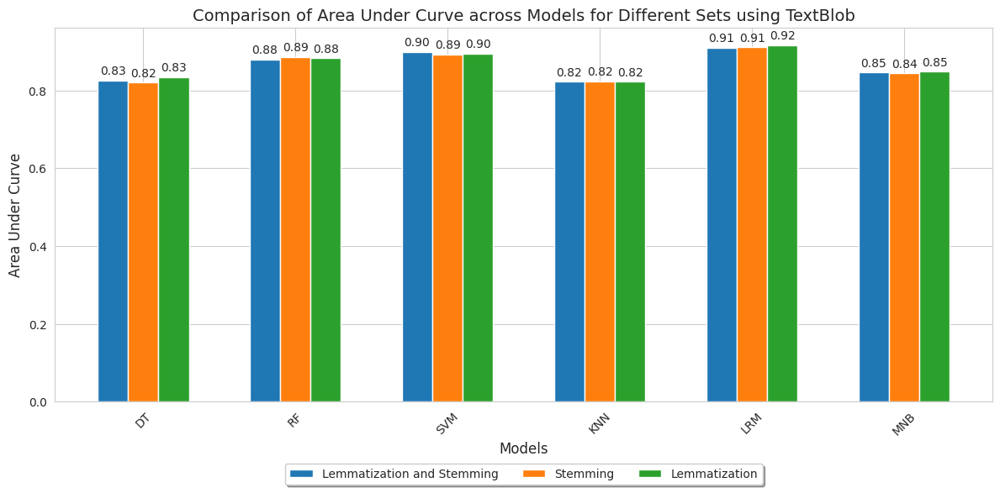

In [ ]:
tb_auc = pd.DataFrame({
    'Model': [m for m in models],
    'Set 1': auc1,
    'Set 2': auc2,
    'Set 3': auc3,
})

bar_width = 0.2
index = np.arange(len(models))

plt.figure(figsize=(12, 6))
bar1 = plt.bar(index, tb_auc['Set 1'], bar_width, label='Lemmatization and Stemming')
bar2 = plt.bar(index + bar_width, tb_auc['Set 2'], bar_width, label='Stemming')
bar3 = plt.bar(index + 2 * bar_width, tb_auc['Set 3'], bar_width, label='Lemmatization')

plt.xlabel('Models', fontsize=12)
plt.ylabel('Area Under Curve', fontsize=12)
plt.title('Comparison of Area Under Curve across Models for Different Sets using TextBlob', fontsize=14)
plt.xticks(index + bar_width, tb_auc['Model'], rotation=45)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), shadow=True, ncol=3, fontsize='medium')

for bars in [bar1, bar2, bar3]:
    for bar in bars:
        height = bar.get_height()
        plt.annotate(f'{height:.2f}',
                     xy=(bar.get_x() + bar.get_width() / 2, height),
                     xytext=(0, 3),
                     textcoords="offset points",
                     ha='center', va='bottom')

plt.tight_layout()
plt.show()

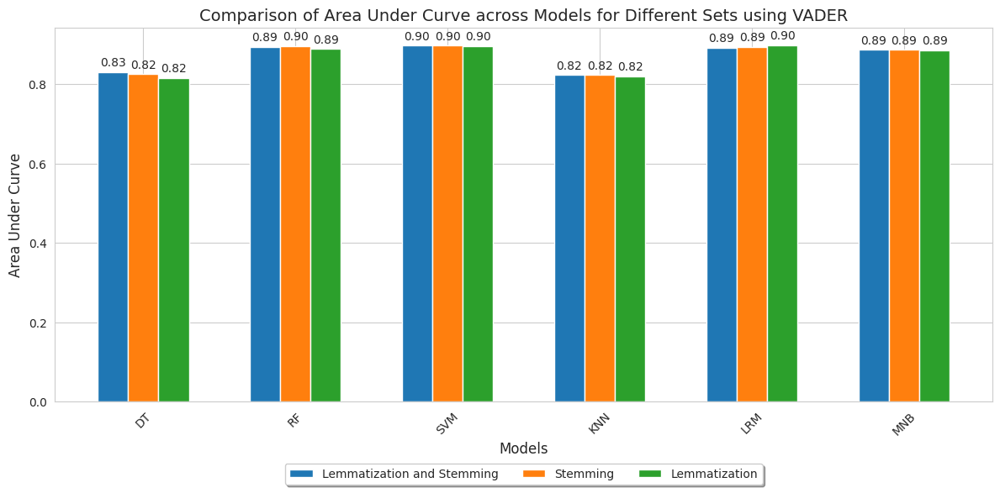

In [ ]:
vd_auc = pd.DataFrame({
    'Model': [m for m in models],
    'Set 1': auc4,
    'Set 2': auc5,
    'Set 3': auc6,
})

bar_width = 0.2
index = np.arange(len(models))

plt.figure(figsize=(12, 6))
bar1 = plt.bar(index, vd_auc['Set 1'], bar_width, label='Lemmatization and Stemming')
bar2 = plt.bar(index + bar_width, vd_auc['Set 2'], bar_width, label='Stemming')
bar3 = plt.bar(index + 2 * bar_width, vd_auc['Set 3'], bar_width, label='Lemmatization')

plt.xlabel('Models', fontsize=12)
plt.ylabel('Area Under Curve', fontsize=12)
plt.title('Comparison of Area Under Curve across Models for Different Sets using VADER', fontsize=14)
plt.xticks(index + bar_width, vd_auc['Model'], rotation=45)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), shadow=True, ncol=3, fontsize='medium')

for bars in [bar1, bar2, bar3]:
    for bar in bars:
        height = bar.get_height()
        plt.annotate(f'{height:.2f}',
                     xy=(bar.get_x() + bar.get_width() / 2, height),
                     xytext=(0, 3),
                     textcoords="offset points",
                     ha='center', va='bottom')

plt.tight_layout()
plt.show()

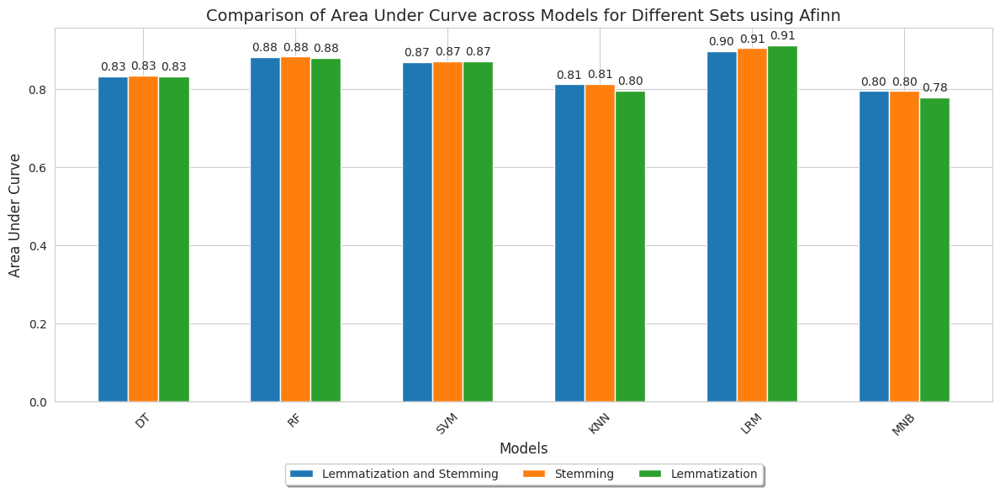

In [ ]:
af_auc = pd.DataFrame({
    'Model': [m for m in models],
    'Set 1': auc7,
    'Set 2': auc8,
    'Set 3': auc9,
})

bar_width = 0.2
index = np.arange(len(models))

plt.figure(figsize=(12, 6))
bar1 = plt.bar(index, af_auc['Set 1'], bar_width, label='Lemmatization and Stemming')
bar2 = plt.bar(index + bar_width, af_auc['Set 2'], bar_width, label='Stemming')
bar3 = plt.bar(index + 2 * bar_width, af_auc['Set 3'], bar_width, label='Lemmatization')

plt.xlabel('Models', fontsize=12)
plt.ylabel('Area Under Curve', fontsize=12)
plt.title('Comparison of Area Under Curve across Models for Different Sets using Afinn', fontsize=14)
plt.xticks(index + bar_width, af_auc['Model'], rotation=45)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), shadow=True, ncol=3, fontsize='medium')

for bars in [bar1, bar2, bar3]:
    for bar in bars:
        height = bar.get_height()
        plt.annotate(f'{height:.2f}',
                     xy=(bar.get_x() + bar.get_width() / 2, height),
                     xytext=(0, 3),
                     textcoords="offset points",
                     ha='center', va='bottom')

plt.tight_layout()
plt.show()

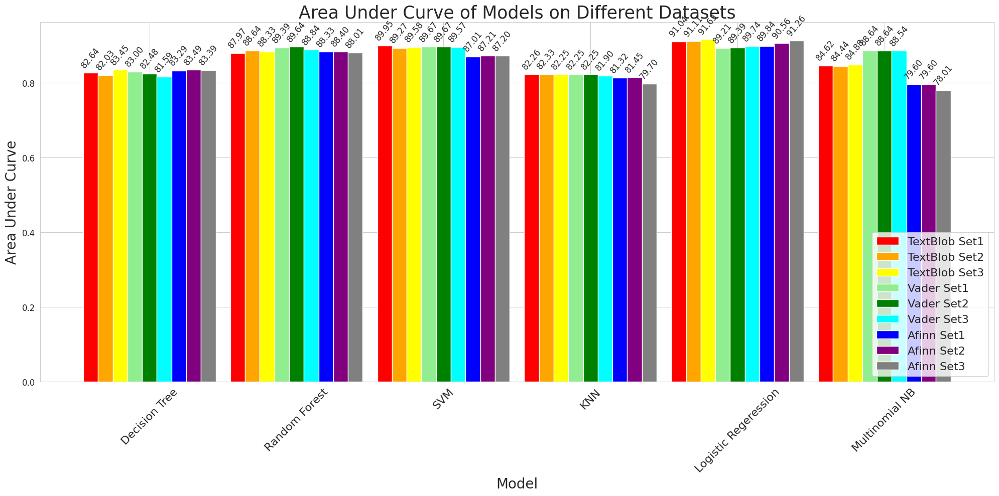

In [ ]:
dataset_scores = []
auc_scores = [auc1, auc2, auc3, auc4, auc5, auc6, auc7, auc8, auc9]

for i, scores in enumerate(auc_scores):
    dataset_scores.append(pd.DataFrame({
        'Model': model_names,
        f'Auc {dataset_names[i]}': scores
    }))

comparison_df = pd.concat([df.set_index('Model') for df in dataset_scores], axis=1)

fig, ax = plt.subplots(figsize=(20, 10))
bar_width = 0.9
index = np.arange(len(comparison_df))

bars = []
for i, dataset in enumerate(dataset_names):
    bars.append(ax.bar(index + i*bar_width/len(dataset_names), comparison_df[f'Auc {dataset}'], bar_width/len(dataset_names), label=dataset, color=colors[i]))

plt.xlabel('Model', fontsize=20)
plt.ylabel('Area Under Curve', fontsize=20)
plt.title('Area Under Curve of Models on Different Datasets', fontsize=25)
plt.xticks(index + bar_width*(len(dataset_names)-1)/(2*len(dataset_names)), comparison_df.index, rotation=45, fontsize=16)
plt.yticks(fontsize=12)
plt.legend(loc='lower right', fontsize=16)

for bar_group in bars:
    for bar in bar_group:
        height = bar.get_height()
        ax.annotate(f"{height*100:.2f}", (bar.get_x() + bar.get_width() / 2, height), ha='center', va='bottom', xytext=(0, 5), rotation=50, textcoords='offset points', fontsize=12)


plt.tight_layout()
plt.show()